In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class SelfAttention(nn.Module):
    def __init__(self, in_channels=64):
        super().__init__()
        self.query = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
        self.key   = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
        self.value = nn.Conv2d(in_channels, in_channels, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B, C, H, W = x.shape

        # Q, K, V projections
        q = self.query(x).view(B, -1, H * W).permute(0, 2, 1)  # [B, HW, C_new]
        k = self.key(x).view(B, -1, H * W)                     # [B, C_new, HW]
        v = self.value(x).view(B, -1, H * W)                   # [B, C,  HW]

        # Attention map
        attn = torch.bmm(q, k)                                 # [B, HW, HW]
        attn = F.softmax(attn, dim=-1)

        # Apply attention to value
        out = torch.bmm(v, attn.permute(0, 2, 1))              # [B, C, HW]
        out = out.view(B, C, H, W)

        return self.gamma * out + x

In [ ]:
class Generator(nn.Module):
    def __init__(self, noise_dim=100, embed_dim=5, output_channels=7, feature_map=64, picture_size=14):
        super().__init__()
        self.picture_size = 14

        self.feature_map = feature_map

        # Embed feature vector u [B, 5] -> [B, 14 * 14]
        self.embed = nn.Sequential(
            nn.Linear(embed_dim, 256),
            nn.ReLU(),
            nn.Linear(256, self.picture_size * self.picture_size)
        )

        # Latent vector z [B, noise_dim] -> feature map [B, feature_map * (pic_size // 2)^2]
        self.fc = nn.Linear(noise_dim, feature_map * (self.picture_size // 2) * (self.picture_size // 2))

        # Upsample to 7x7 -> 14x14
        self.upsample = nn.Sequential(
            nn.BatchNorm2d(feature_map),
            nn.ReLU(),
            nn.ConvTranspose2d(feature_map, feature_map, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(feature_map),
            nn.ReLU()
        )

        self.attn = SelfAttention(feature_map)

        # Output: [B, output_channels, pic_size, pic_size]
        self.out = nn.Conv2d(feature_map + 1, output_channels, kernel_size=1)

    # z: [B, noise_dim]
    # u: [B, embed_dim]
    def forward(self, z, u):
        # x: [B, feature_map, pic_size // 2, pic_size // 2]
        x = self.fc(z).view(-1, self.feature_map, self.picture_size // 2, self.picture_size // 2)
        # x: [B, feature_map, pic_size, pic_size]
        x = self.upsample(x)
        # x: [B, feature_map, pic_size, pic_size]
        x = self.attn(x)


        # u_embed: [B, 1, pic_size, pic_size]
        u_embed = self.embed(u).view(-1, 1, self.picture_size, self.picture_size)

        # x: [B, feature_map + 1, pic_size, pic_size]
        x = torch.cat([x, u_embed], dim=1)

        # out: [B, output_channels, pic_size, pic_size]
        return self.out(x)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, input_channels=10, embed_dim=5, feature_map_size=64, picture_size=14):
        super().__init__()
        self.picture_size = picture_size
        self.feature_map = feature_map_size

        # Embed feature vector u -> [B, 1, H, W]
        self.embed = nn.Sequential(
            nn.Linear(embed_dim, picture_size * picture_size),
            nn.ReLU()
        )

        # Conv: [B, input_channels + 1, H, W] -> [B, feature_map, H/2, W/2]
        self.conv = nn.Sequential(
            nn.Conv2d(input_channels + 1, feature_map_size, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(feature_map_size, feature_map_size, kernel_size=3, stride=2, padding=1),
            nn.ReLU()
        )

        # Self-attention block
        self.attn = SelfAttention(feature_map_size)

        # Final classification head
        self.out = nn.Linear((picture_size // 2) * (picture_size // 2) * feature_map_size, 1)

    # x: [B, input_channels, H, W]
    # u: [B, embed_dim]
    def forward(self, x, u):
        # u_embed: [B, 1, H, W]
        u_embed = self.embed(u).view(-1, 1, self.picture_size, self.picture_size)

        # x: [B, input_channels + 1, H, W]
        x = torch.cat([x, u_embed], dim=1)

        # x: [B, feature_map, H/2, W/2]
        x = self.conv(x)

        # x: [B, feature_map, H/2, W/2]
        x = self.attn(x)

        # Flatten and classify
        x = x.view(x.size(0), -1)  # [B, feature_map * H/2 * W/2]
        return self.out(x)         # [B, 1]

Модель без вектора условий для дебага

In [ ]:
class GeneratorNoCondition(nn.Module):
    def __init__(self, noise_dim=100, output_channels=7, feature_map=64, picture_size=14):
        super().__init__()
        self.picture_size = 14

        self.feature_map = feature_map


        # Latent vector z [B, noise_dim] -> feature map [B, feature_map * (pic_size // 2)^2]
        self.fc = nn.Linear(noise_dim, feature_map * (self.picture_size // 2) * (self.picture_size // 2))

        # Upsample to 7x7 -> 14x14
        self.upsample = nn.Sequential(
            nn.BatchNorm2d(feature_map),
            nn.ReLU(),
            nn.ConvTranspose2d(feature_map, feature_map, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(feature_map),
            nn.ReLU()
        )

        self.attn = SelfAttention(feature_map)

        # Output: [B, output_channels, pic_size, pic_size]
        self.out = nn.Conv2d(feature_map, output_channels, kernel_size=1)

    # z: [B, noise_dim]
    def forward(self, z):
        # x: [B, feature_map, pic_size // 2, pic_size // 2]
        x = self.fc(z).view(-1, self.feature_map, self.picture_size // 2, self.picture_size // 2)
        # x: [B, feature_map, pic_size, pic_size]
        x = self.upsample(x)
        # x: [B, feature_map, pic_size, pic_size]
        x = self.attn(x)


        # out: [B, output_channels, pic_size, pic_size]
        return self.out(x)

In [ ]:
class DiscriminatorNoCondition(nn.Module):
    def __init__(self, input_channels=10, feature_map_size=64, picture_size=14):
        super().__init__()
        self.picture_size = picture_size
        self.feature_map = feature_map_size


        # Conv: [B, input_channels, H, W] -> [B, feature_map, H/2, W/2]
        self.conv = nn.Sequential(
            nn.Conv2d(input_channels, feature_map_size, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(feature_map_size, feature_map_size, kernel_size=3, stride=2, padding=1),
            nn.ReLU()
        )

        # Self-attention block
        self.attn = SelfAttention(feature_map_size)

        # Final classification head
        self.out = nn.Linear((picture_size // 2) * (picture_size // 2) * feature_map_size, 1)

    # x: [B, input_channels, H, W]
    def forward(self, x):

        # x: [B, feature_map, H/2, W/2]
        x = self.conv(x)

        # x: [B, feature_map, H/2, W/2]
        x = self.attn(x)

        # Flatten and classify
        x = x.view(x.size(0), -1)  # [B, feature_map * H/2 * W/2]
        return self.out(x)         # [B, 1]

In [ ]:
# вход [player, key, door, enemy1, enemy2]
# выход: [empty, wall, player, key, door, enemy1, enemy2]

G = Generator(output_channels=7, embed_dim=5)
D = Discriminator(input_channels=7, embed_dim=5)

In [ ]:
print(G)
print(sum(p.numel() for p in G.parameters()))

Generator(
  (embed): Sequential(
    (0): Linear(in_features=5, out_features=256, bias=True)
    (1): ReLU()
    (2): Linear(in_features=256, out_features=14, bias=True)
  )
  (fc): Linear(in_features=100, out_features=3136, bias=True)
  (upsample): Sequential(
    (0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): ReLU()
    (2): ConvTranspose2d(64, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU()
  )
  (attn): SelfAttention(
    (query): Conv2d(64, 8, kernel_size=(1, 1), stride=(1, 1))
    (key): Conv2d(64, 8, kernel_size=(1, 1), stride=(1, 1))
    (value): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (out): Conv2d(65, 7, kernel_size=(1, 1), stride=(1, 1))
)
393389


In [ ]:
print(D)
print(sum(p.numel() for p in D.parameters()))

Discriminator(
  (embed): Sequential(
    (0): Linear(in_features=5, out_features=196, bias=True)
    (1): ReLU()
  )
  (conv): Sequential(
    (0): Conv2d(8, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
  )
  (attn): SelfAttention(
    (query): Conv2d(64, 8, kernel_size=(1, 1), stride=(1, 1))
    (key): Conv2d(64, 8, kernel_size=(1, 1), stride=(1, 1))
    (value): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (out): Linear(in_features=3136, out_features=1, bias=True)
)
51114


In [ ]:
z = torch.randn(1, 100)
u = torch.tensor([1, 1, 1, 2, 0]).type(torch.FloatTensor).unsqueeze(0)
G(z, u).shape

torch.Size([1, 7, 14, 14])

In [ ]:
z = torch.randn(1, 100)
u = torch.tensor([1, 1, 1, 2, 0]).type(torch.FloatTensor).unsqueeze(0)
torch.argmax(G(z, u), dim=1)[0]

tensor([[5, 6, 5, 5, 4, 6, 5, 5, 3, 6, 6, 5, 5, 6],
        [3, 6, 6, 5, 3, 5, 5, 4, 1, 6, 5, 6, 5, 5],
        [6, 6, 6, 5, 5, 6, 5, 6, 6, 5, 5, 6, 3, 5],
        [6, 5, 3, 5, 6, 5, 6, 1, 6, 3, 6, 5, 3, 5],
        [5, 6, 3, 5, 5, 5, 6, 6, 6, 3, 6, 6, 5, 5],
        [5, 6, 3, 5, 6, 6, 6, 5, 6, 6, 6, 6, 6, 5],
        [5, 6, 5, 6, 6, 5, 3, 6, 5, 3, 5, 5, 5, 5],
        [6, 6, 6, 5, 5, 3, 5, 3, 6, 5, 5, 3, 1, 5],
        [6, 3, 5, 6, 5, 6, 6, 6, 6, 5, 6, 5, 6, 6],
        [6, 6, 5, 5, 2, 6, 5, 5, 5, 6, 6, 4, 5, 6],
        [3, 5, 5, 6, 5, 5, 5, 5, 6, 5, 5, 5, 6, 5],
        [5, 5, 5, 5, 6, 3, 6, 5, 5, 6, 6, 6, 6, 5],
        [6, 6, 5, 5, 5, 5, 6, 5, 5, 6, 3, 6, 3, 5],
        [5, 6, 5, 6, 6, 6, 5, 5, 6, 5, 6, 5, 5, 6]])

In [ ]:
GN = GeneratorNoCondition(output_channels=7)
z = torch.randn(1, 100)
torch.argmax(GN(z), dim=1)[0]

tensor([[1, 5, 6, 6, 2, 2, 2, 3, 5, 1, 2, 2, 2, 2],
        [2, 5, 3, 2, 6, 2, 2, 6, 2, 2, 3, 5, 1, 6],
        [4, 2, 1, 2, 2, 5, 2, 2, 2, 2, 6, 2, 2, 6],
        [3, 2, 1, 1, 2, 2, 5, 6, 1, 2, 1, 2, 1, 5],
        [2, 2, 6, 2, 2, 5, 2, 3, 2, 2, 4, 1, 6, 2],
        [1, 2, 0, 2, 3, 2, 2, 5, 6, 2, 3, 6, 1, 6],
        [4, 6, 2, 2, 3, 1, 2, 2, 6, 2, 0, 1, 5, 2],
        [2, 6, 6, 2, 1, 3, 1, 2, 2, 2, 5, 1, 1, 6],
        [4, 3, 5, 5, 1, 2, 5, 5, 2, 5, 0, 5, 1, 5],
        [3, 3, 5, 1, 0, 6, 1, 2, 1, 6, 2, 2, 2, 6],
        [0, 3, 1, 2, 5, 1, 1, 5, 6, 5, 2, 5, 2, 6],
        [3, 4, 1, 2, 2, 4, 2, 0, 3, 2, 5, 2, 6, 2],
        [4, 5, 2, 6, 6, 5, 5, 1, 5, 2, 0, 2, 2, 2],
        [4, 2, 2, 6, 3, 2, 3, 2, 6, 2, 6, 6, 6, 6]])

# Генерация датасета

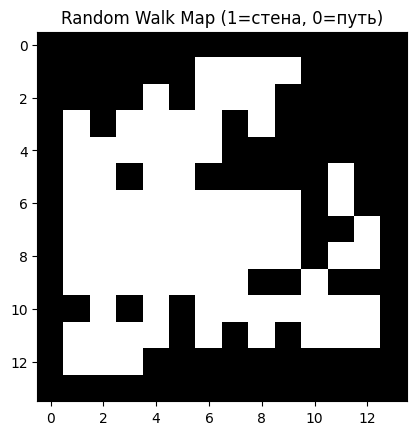

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_walk_map(width=14, height=14, steps=500, path_prob=0.45, num_new_placements=8):
    """
    Генерирует карту с помощью случайного блуждания.

    Параметры:
        width, height: размер карты.
        steps: количество шагов блуждания.
        wall_prob: вероятность превращения клетки в стену.
    """
    # Инициализация карты (0 = путь, 1 = стена)
    grid = np.ones((width, height), dtype=int)

    # Начальная позиция "блуждателя" (в центре)
    x, y = width // 2, height // 2

    for i in range(steps):
        # Случайное направление (вверх, вниз, влево, вправо)
        dx, dy = [(0, 1), (0, -1), (1, 0), (-1, 0)][np.random.randint(4)]

        # Обновляем позицию с проверкой границ
        x = np.clip(x + dx, 1, width - 2)
        y = np.clip(y + dy, 1, height - 2)

        # С вероятностью wall_prob превращаем клетку в стену
        if np.random.rand() < path_prob:
            grid[y, x] = 0

        if i % (steps // num_new_placements) == 0 and i > 0:
          x, y = np.random.randint(1, width - 2), np.random.randint(1, height - 2)

    return grid

# Генерируем карту
map_grid = generate_random_walk_map(width=14, height=14, steps=500, path_prob=0.45, num_new_placements=8)

# Визуализация
plt.imshow(map_grid, cmap='binary', interpolation='nearest')
plt.title("Random Walk Map (1=стена, 0=путь)")
plt.show()

[[1 1 1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 1 0 0 0 1 1 1 1 1]
 [1 0 1 0 0 0 0 1 0 1 1 1 1 1]
 [1 0 0 0 0 0 0 1 1 1 1 1 1 1]
 [1 0 0 1 0 0 1 1 1 1 1 0 1 1]
 [1 0 0 0 0 0 0 0 0 0 1 0 1 1]
 [1 0 0 0 0 0 0 0 0 0 1 1 0 1]
 [1 0 0 0 0 0 0 0 0 0 1 0 0 1]
 [1 0 0 0 0 0 0 0 1 1 0 1 1 1]
 [1 1 0 1 0 1 0 0 0 0 0 0 0 1]
 [1 0 0 0 0 1 0 1 0 1 0 0 0 1]
 [1 0 0 0 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1 1 1 1]]


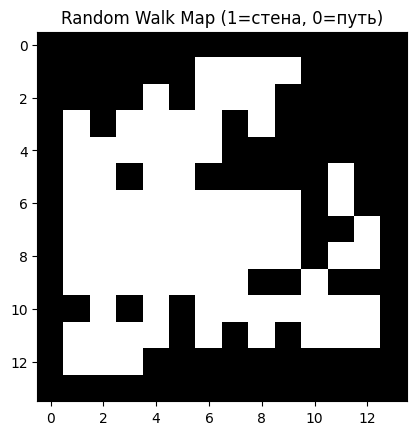

In [ ]:
print(map_grid)
plt.imshow(map_grid, cmap='binary', interpolation='nearest')
plt.title("Random Walk Map (1=стена, 0=путь)")
plt.show()

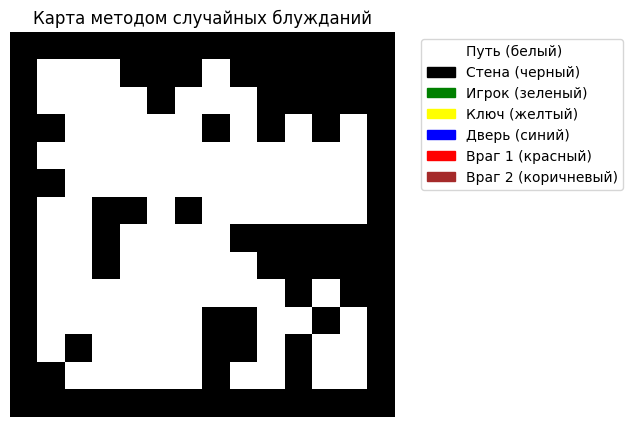

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import numpy as np

def visualize_map(map_grid, title=None):
    """Визуализация с базовыми цветами"""
    color_dict = {
        0: [255, 255, 255],  # Белый - путь
        1: [0, 0, 0],        # Черный - стена
        2: [0, 255, 0],      # Зеленый - игрок
        3: [255, 255, 0],    # Желтый - ключ
        4: [0, 0, 255],      # Синий - дверь
        5: [255, 0, 0],      # Красный - враг1
        6: [165, 42, 42]     # Коричневый - враг2
    }
    colors = [
        'white',   # 0 = путь
        'black',   # 1 = стена (должны быть черными)
        'green',   # 2 = игрок
        'yellow',  # 3 = ключ
        'blue',     # 4 = дверь
        'red',     # 5 = враг 1
        'brown',   # 6 = враг 2
    ]
    legend_labels = {
        0: 'Путь (белый)',
        1: 'Стена (черный)',
        2: 'Игрок (зеленый)',
        3: 'Ключ (желтый)',
        4: 'Дверь (синий)',
        5: 'Враг 1 (красный)',
        6: 'Враг 2 (коричневый)',
    }

    # Преобразуем в RGB изображение
    rgb_map = np.zeros((*map_grid.shape, 3), dtype=np.uint8)
    for val in np.unique(map_grid):
        rgb_map[map_grid == val] = color_dict.get(val, [128, 128, 128])


    plt.figure(figsize=(5, 5))
    patches = [Patch(color=colors[i], label=legend_labels[i]) for i in legend_labels]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.imshow(rgb_map)
    plt.axis('off')
    if title == None:
      title = "Карта методом случайных блужданий"
    plt.title(title)
    plt.show()

map_grid = generate_random_walk_map()
visualize_map(map_grid)

{'player': [(9, 4)], 'key': [(3, 4)], 'door': [(10, 7)], 'enemy1': [(12, 3), (1, 12)]}
[1, 1, 1, 2, 0]
[[1 1 1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 0 1 0 0 0 1 1 0 1 0 5 1]
 [1 0 0 1 0 0 0 1 1 1 0 0 0 1]
 [1 1 0 0 3 0 0 1 1 1 0 0 0 1]
 [1 1 0 0 0 1 0 1 0 0 0 0 1 1]
 [1 1 0 1 0 0 1 0 0 0 1 1 1 1]
 [1 1 0 0 0 0 0 0 0 0 0 0 0 1]
 [1 1 1 0 0 1 0 0 0 1 1 1 0 1]
 [1 1 1 0 0 1 0 0 0 0 0 1 0 1]
 [1 1 1 0 2 1 1 1 0 0 0 0 0 1]
 [1 1 1 0 0 0 0 4 1 0 0 0 0 1]
 [1 0 0 1 0 0 0 0 1 1 0 1 1 1]
 [1 0 0 5 0 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1 1 1 1]]


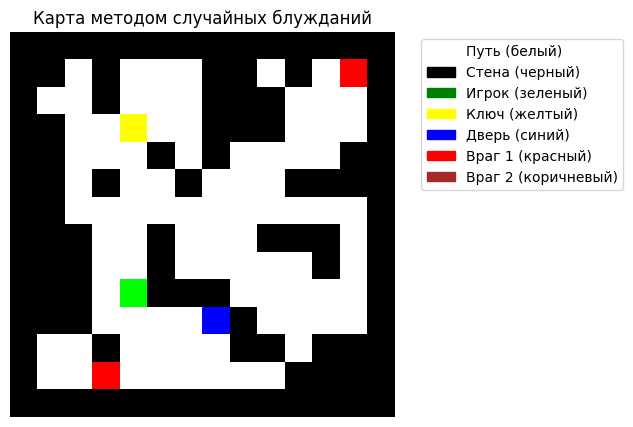

In [ ]:
from scipy.spatial import distance

def find_object_placement(map_grid, object_nums, object_types=['player', 'key', 'door', 'enemy1', 'enemy2'], min_distance=3):
    """Размещает объекты с минимальным расстоянием между ними"""
    object_nums = object_nums.copy()
    walkable = np.argwhere(map_grid == 0)
    positions = {}

    attempts_left = sum(object_nums) * 3
    for i in range(len(object_types)):
        obj = object_types[i]
        while object_nums[i] > 0:
            attempts_left -= 1
            pos = walkable[np.random.randint(len(walkable))]
            pos = (int(pos[0]), int(pos[1]))

            # Проверяем расстояние до других объектов
            valid = True
            for object_positions in positions.values():
              for existing_pos in object_positions:
                if distance.euclidean(pos, existing_pos) < min_distance:
                    valid = False
                    break
              if not valid:
                break

            if valid:
              if obj in positions:
                positions[obj].append(tuple(pos))
              else:
                positions[obj] = [tuple(pos)]
              object_nums[i] -= 1

            if attempts_left <= 0:
              return None

    return positions

def place_objects(map_grid, positions, object_types=['player', 'key', 'door', 'enemy1', 'enemy2']):
  for i in range(len(object_types)):
    if object_types[i] in positions:
      for pos in positions[object_types[i]]:
        map_grid[pos[0]][pos[1]] = i + 2


map_grid = generate_random_walk_map()
object_nums = [1, 1, 1, 2, 0]
points = find_object_placement(map_grid, object_nums)
print(points)
print(object_nums)
if points:
  place_objects(map_grid, points)
print(map_grid)
visualize_map(map_grid)

In [ ]:
!pip install pathfinding

In [ ]:
from pathfinding.core.grid import Grid
from pathfinding.finder.a_star import AStarFinder
from pathfinding.core.diagonal_movement import DiagonalMovement
import numpy as np

def verify_paths(map_grid, points):
    """
    Проверяет существование путей между всеми точками на карте.

    :param map_grid: 2D массив карты (0 = путь, 1 = стена)
    :param points: Словарь с координатами в формате {'player': [(x1,y1)], 'key': [(x2,y2)], ...}
    :return: True если все пути существуют, иначе False
    """
    # Инвертируем карту для библиотеки pathfinding (0 = препятствие, 1 = путь)
    # map_grid: 0 - путь, 1 - стена
    pathfinding_matrix = 1 - map_grid

    # Собираем все координаты из всех категорий
    all_points = []
    for category in points.values():
        all_points.extend(category)

    for i in range(len(all_points)):
        for j in range(i + 1, len(all_points)):
            x1, y1 = all_points[i]
            x2, y2 = all_points[j]


            if map_grid[x1][y1] != 0:
                # print(f"Точка находится в стене: {all_points[i]}")
                return False
            if map_grid[x2][y2] != 0:
                # print(f"Точка находится в стене: {all_points[j]}")
                return False


            grid = Grid(matrix=pathfinding_matrix.copy())
            start = grid.node(y1, x1)
            end = grid.node(y2, x2)

            finder = AStarFinder(diagonal_movement=DiagonalMovement.never)
            path, _ = finder.find_path(start, end, grid)

            if not path:
                # print(f"Путь не найден между {all_points[i]} и {all_points[j]}")
                return False

    return True


[[0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 1 1 1 0 0 1 1 0 1 1 1 0]
 [0 0 1 1 1 0 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 0 0 0 1 0]
 [0 1 1 1 1 1 1 1 0 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 0 1 1 1 0 0]
 [0 0 1 1 1 0 0 0 1 1 0 1 0 0]
 [0 1 1 1 1 1 0 0 1 0 1 0 0 0]
 [0 1 1 1 1 1 0 0 1 0 1 1 0 0]
 [0 1 1 1 1 0 0 0 1 0 1 0 0 0]
 [0 1 1 1 1 0 0 0 1 0 1 0 1 0]
 [0 1 1 1 1 0 0 0 1 1 1 1 1 0]
 [0 0 1 1 1 0 0 0 1 1 1 1 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
Все пути найдены


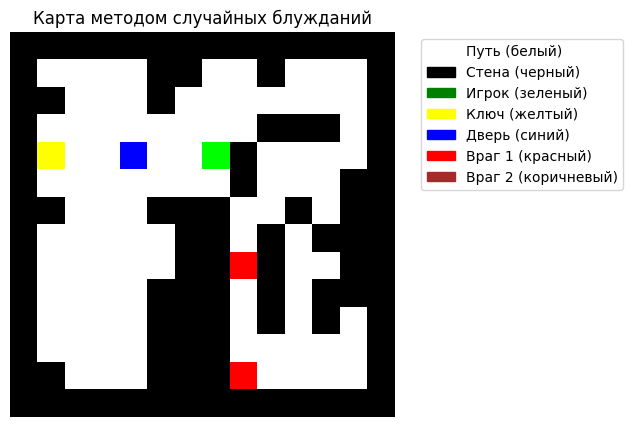

In [ ]:
map_grid = generate_random_walk_map()
object_nums = [1, 1, 1, 2, 0]
points = find_object_placement(map_grid, object_nums)
print(1 - map_grid)
if points:
  if verify_paths(map_grid, points):
    print("Все пути найдены")
  else:
    print("Путь не найден")
  place_objects(map_grid, points)
visualize_map(map_grid)

In [ ]:
dataset = {
    "object_nums": [], # вектор объектов
    "positions": [], # позиции объектов
    "maps": [], # карты
}

In [ ]:
from tqdm import tqdm

for i in tqdm(range(30)):
  map_grid = generate_random_walk_map(width=14, height=14, steps=600, path_prob=0.8, num_new_placements=8)
  object_nums = [1, 1, 0, 1, 0]
  points = find_object_placement(map_grid, object_nums)
  if points:
    if verify_paths(map_grid, points):
      place_objects(map_grid, points)
      dataset["object_nums"].append(object_nums)
      dataset["positions"].append(points)
      dataset["maps"].append(map_grid)

print()
len(dataset["object_nums"])

100%|██████████| 30/30 [00:00<00:00, 100.84it/s]

1000

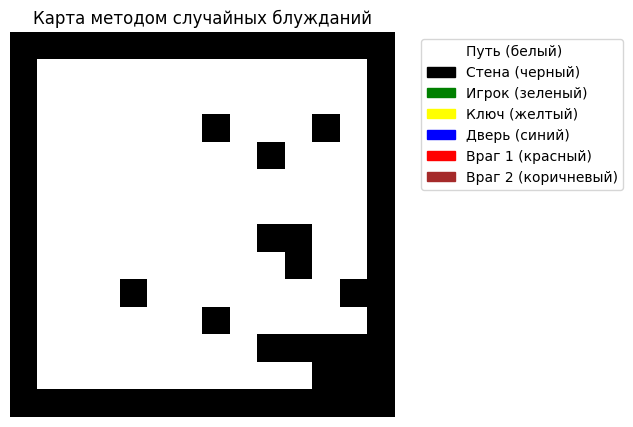

In [ ]:
import pickle
with open('game_maps_dataset.pkl', 'wb') as f:
    pickle.dump(dataset, f)

In [ ]:
# Загрузка
import pickle
with open('game_maps_dataset.pkl', 'rb') as f:
    dataset = pickle.load(f)

object_nums: [2, 1, 2, 2, 1]
positions: {'player': [(4, 6), (11, 6)], 'key': [(10, 2)], 'door': [(11, 11), (7, 11)], 'enemy1': [(8, 7), (2, 12)], 'enemy2': [(1, 5)]}


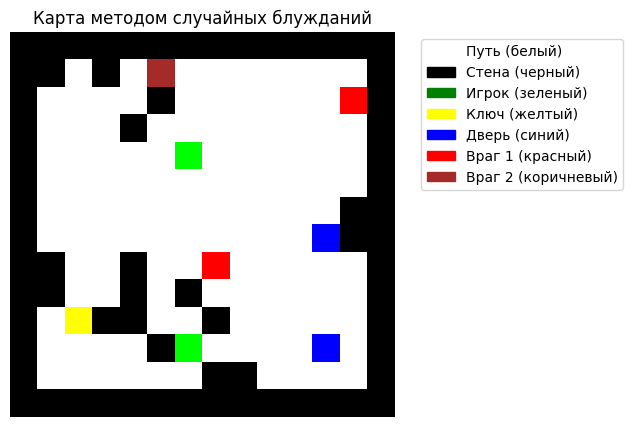

In [ ]:
dataset_index = 917
print("object_nums:", dataset["object_nums"][dataset_index])
print("positions:", dataset["positions"][dataset_index])
visualize_map(dataset["maps"][dataset_index])

# Обучение

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from tqdm import tqdm

class GameMapDataset(Dataset):
    def __init__(self, maps):
        self.maps = torch.FloatTensor(maps)

    def __len__(self):
        return len(self.maps)

    def __getitem__(self, idx):
        return self.maps[idx]

def get_dataloader(maps, batch_size=32):
    dataset = GameMapDataset(maps)
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [ ]:
def train_gan(generator, discriminator, dataloader, epochs=100, lr=0.0002):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    generator.to(device)
    discriminator.to(device)

    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    criterion = nn.BCEWithLogitsLoss()  # Изменено на BCEWithLogits

    for epoch in range(epochs):
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")

        for object_nums, real_maps in progress_bar:
            batch_size = real_maps.size(0)

            # Подготовка данных
            real_maps = real_maps.to(device).unsqueeze(1)  # [B, 1, 14, 14]
            object_nums = object_nums.to(device)

            # Генерация меток
            real_labels = torch.ones(batch_size, 1, device=device)
            fake_labels = torch.zeros(batch_size, 1, device=device)

            # Обучение дискриминатора
            discriminator.zero_grad()

            # Реальные данные
            real_maps_expanded = real_maps.expand(-1, 7, -1, -1)  # [B, 7, 14, 14]
            d_real = discriminator(real_maps_expanded, object_nums)
            loss_real = criterion(d_real, real_labels)

            # Фейковые данные
            noise = torch.randn(batch_size, 100, device=device)
            fake_maps = generator(noise, object_nums)
            d_fake = discriminator(fake_maps.detach(), object_nums)
            loss_fake = criterion(d_fake, fake_labels)

            loss_d = (loss_real + loss_fake) * 0.5
            loss_d.backward()
            opt_d.step()

            # Обучение генератора
            generator.zero_grad()

            d_fake = discriminator(fake_maps, object_nums)
            loss_g = criterion(d_fake, real_labels)

            # Добавляем L1 loss
            l1_loss = F.l1_loss(fake_maps, real_maps_expanded)
            total_loss = loss_g + l1_loss * 10.0

            total_loss.backward()
            opt_g.step()

            progress_bar.set_postfix({
                'D_loss': loss_d.item(),
                'G_loss': loss_g.item(),
                'L1': l1_loss.item()
            })

In [ ]:
maps = dataset['maps']
objects = dataset['object_nums']

generator = Generator(
    noise_dim=100,
    embed_dim=5,
    output_channels=7,
    feature_map=64,
    picture_size=14
)

discriminator = Discriminator(
  input_channels=7,
  embed_dim=5,
  feature_map_size=64,
  picture_size=14
)

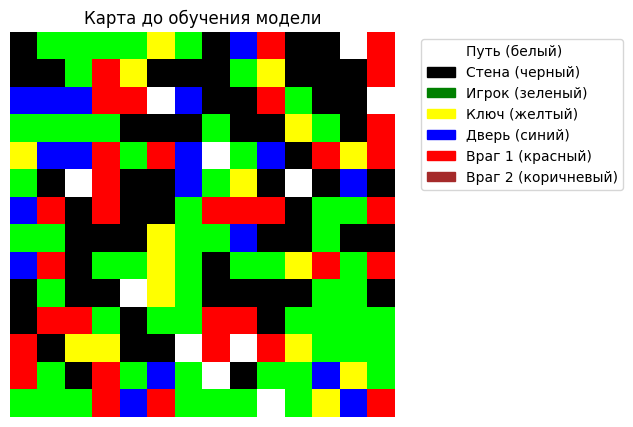

In [ ]:
z = torch.randn(1, 100)
u = torch.tensor([1, 1, 1, 2, 0]).type(torch.FloatTensor).unsqueeze(0)
map = torch.argmax(generator(z, u), dim=1)[0]
visualize_map(map, title="Карта до обучения модели")

In [ ]:
dataloader = get_dataloader(maps, objects, batch_size=32)
train_gan(generator, discriminator, dataloader, epochs=50)

Epoch 50/50: 100%|██████████| 32/32 [00:05<00:00,  5.67it/s, D_loss=0.527, G_loss=1.66, L1=0.531]


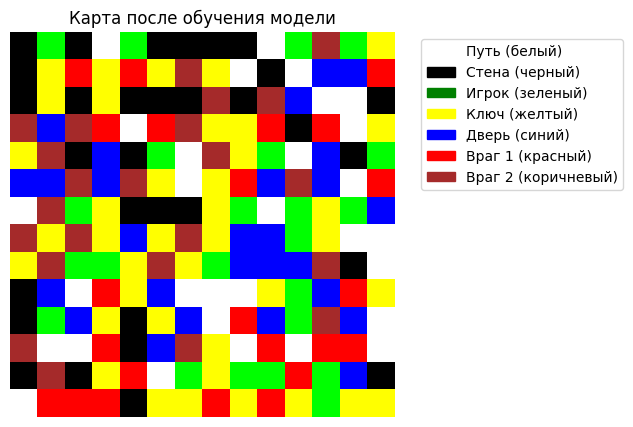

In [ ]:
z = torch.randn(1, 100)
u = torch.tensor([1, 1, 1, 2, 0]).type(torch.FloatTensor).unsqueeze(0)
map = torch.argmax(generator(z, u), dim=1)[0]
visualize_map(map, title="Карта после обучения модели")

# GAN без условий

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 32

In [ ]:
import torch.optim as optim
from torchvision.utils import save_image
import os

# Создание директории для сохранения результатов
os.makedirs("gan_results", exist_ok=True)

# Функция для генерации шума
def generate_noise(batch_size, noise_dim):
    return torch.randn(batch_size, noise_dim, device=device)

def train(generator, discriminator, dataloader, epochs=1000, noise_dim=100, lr_g = 0.0002, lr_d = 0.0002, beta1 = 0.5, beta2 = 0.999):
  criterion = nn.BCEWithLogitsLoss()
  optimizer_g = optim.Adam(generator.parameters(), lr=lr_g, betas=(beta1, beta2))
  optimizer_d = optim.Adam(discriminator.parameters(), lr=lr_d, betas=(beta1, beta2))


  for epoch in range(epochs):
      for i, real_maps in enumerate(tqdm(dataloader)):
          real_maps = real_maps.to(device)
          real_maps = F.one_hot(real_maps.long().squeeze(1), 7).permute(0,3,1,2).float() # one-hot для настоящих карт
          batch_size = real_maps.size(0)

          # Подготовка меток
          real_labels = torch.ones(batch_size, 1, device=device)
          fake_labels = torch.zeros(batch_size, 1, device=device)

          # ==================== Обучение дискриминатора ====================
          optimizer_d.zero_grad()

          # Обработка реальных изображений
          real_outputs = discriminator(real_maps)
          d_loss_real = criterion(real_outputs, real_labels)

          # Обработка фейковых изображений
          noise = generate_noise(batch_size, noise_dim)
          fake_maps = generator(noise)
          fake_outputs = discriminator(fake_maps.detach())
          d_loss_fake = criterion(fake_outputs, fake_labels)

          # Общий loss и backward
          d_loss = d_loss_real + d_loss_fake
          d_loss.backward()
          optimizer_d.step()

          # ==================== Обучение генератора ====================
          optimizer_g.zero_grad()

          # Генерация фейков и вычисление loss
          noise = generate_noise(batch_size, noise_dim)
          fake_maps = generator(noise)
          outputs = discriminator(fake_maps)
          g_loss = criterion(outputs, real_labels)  # пытаемся обмануть D

          g_loss.backward()
          optimizer_g.step()

          # ==================== Логирование и сохранение ====================
          if i % 50 == 0:
              print(f"[Epoch {epoch}/{epochs}] [Batch {i}/{len(dataloader)}] "
                    f"D_loss: {d_loss.item():.4f} G_loss: {g_loss.item():.4f}")

      # Сохранение примеров и моделей
      if epoch % 10 == 0:
          with torch.no_grad():
              test_noise = generate_noise(1, noise_dim)
              generated_map = generator(test_noise)

          torch.save(generator.state_dict(), f"gan_results/generator_{epoch}.pth")
          torch.save(discriminator.state_dict(), f"gan_results/discriminator_{epoch}.pth")

In [ ]:
maps = dataset['maps']
dataloader = get_dataloader(maps, batch_size=batch_size)

generator = GeneratorNoCondition(noise_dim=100, output_channels=7).to(device)
discriminator = DiscriminatorNoCondition(input_channels=7).to(device)

In [ ]:
train(generator, discriminator, dataloader, epochs=50)

  6%|▋         | 2/32 [00:00<00:05,  5.30it/s]

[Epoch 0/300] [Batch 0/32] D_loss: 1.3894 G_loss: 0.6823


  6%|▋         | 2/32 [00:00<00:05,  5.42it/s]

[Epoch 1/300] [Batch 0/32] D_loss: 1.0694 G_loss: 0.9578


  6%|▋         | 2/32 [00:00<00:05,  5.70it/s]

[Epoch 2/300] [Batch 0/32] D_loss: 1.3474 G_loss: 0.7138


  3%|▎         | 1/32 [00:00<00:07,  4.18it/s]

[Epoch 3/300] [Batch 0/32] D_loss: 1.3519 G_loss: 0.8044


  6%|▋         | 2/32 [00:00<00:05,  5.80it/s]

[Epoch 4/300] [Batch 0/32] D_loss: 1.3253 G_loss: 0.7413


  3%|▎         | 1/32 [00:00<00:07,  4.09it/s]

[Epoch 5/300] [Batch 0/32] D_loss: 1.2834 G_loss: 0.9182


  6%|▋         | 2/32 [00:00<00:05,  5.73it/s]

[Epoch 6/300] [Batch 0/32] D_loss: 1.2064 G_loss: 0.9701


  6%|▋         | 2/32 [00:00<00:05,  5.70it/s]

[Epoch 7/300] [Batch 0/32] D_loss: 1.1982 G_loss: 0.8384


  6%|▋         | 2/32 [00:00<00:05,  5.76it/s]

[Epoch 8/300] [Batch 0/32] D_loss: 1.0810 G_loss: 0.9129


  6%|▋         | 2/32 [00:00<00:05,  5.99it/s]

[Epoch 9/300] [Batch 0/32] D_loss: 1.0330 G_loss: 1.0774


  6%|▋         | 2/32 [00:00<00:05,  5.60it/s]

[Epoch 10/300] [Batch 0/32] D_loss: 0.9255 G_loss: 1.1513


  6%|▋         | 2/32 [00:00<00:05,  5.98it/s]

[Epoch 11/300] [Batch 0/32] D_loss: 0.6690 G_loss: 1.4462


  6%|▋         | 2/32 [00:00<00:05,  5.98it/s]

[Epoch 12/300] [Batch 0/32] D_loss: 0.5976 G_loss: 1.5590


  6%|▋         | 2/32 [00:00<00:04,  6.04it/s]

[Epoch 13/300] [Batch 0/32] D_loss: 0.5147 G_loss: 1.3587


  3%|▎         | 1/32 [00:00<00:07,  3.98it/s]

[Epoch 14/300] [Batch 0/32] D_loss: 0.2778 G_loss: 2.4526


  6%|▋         | 2/32 [00:00<00:05,  5.87it/s]

[Epoch 15/300] [Batch 0/32] D_loss: 0.7635 G_loss: 0.9495


  3%|▎         | 1/32 [00:00<00:09,  3.29it/s]

[Epoch 16/300] [Batch 0/32] D_loss: 0.2184 G_loss: 2.6492


  6%|▋         | 2/32 [00:00<00:05,  5.73it/s]

[Epoch 17/300] [Batch 0/32] D_loss: 0.2694 G_loss: 2.5261


  6%|▋         | 2/32 [00:00<00:05,  5.86it/s]

[Epoch 18/300] [Batch 0/32] D_loss: 1.0576 G_loss: 0.7371


  6%|▋         | 2/32 [00:00<00:04,  6.12it/s]

[Epoch 19/300] [Batch 0/32] D_loss: 0.4491 G_loss: 1.4445


  6%|▋         | 2/32 [00:00<00:05,  5.49it/s]

[Epoch 20/300] [Batch 0/32] D_loss: 0.5333 G_loss: 2.1341


  6%|▋         | 2/32 [00:00<00:05,  5.46it/s]

[Epoch 21/300] [Batch 0/32] D_loss: 0.5253 G_loss: 1.3856


  6%|▋         | 2/32 [00:00<00:05,  5.47it/s]

[Epoch 22/300] [Batch 0/32] D_loss: 0.5815 G_loss: 1.1586


  6%|▋         | 2/32 [00:00<00:05,  5.03it/s]

[Epoch 23/300] [Batch 0/32] D_loss: 0.5720 G_loss: 2.8923


  3%|▎         | 1/32 [00:00<00:06,  4.65it/s]

[Epoch 24/300] [Batch 0/32] D_loss: 0.7282 G_loss: 1.8979


  6%|▋         | 2/32 [00:00<00:05,  5.12it/s]

[Epoch 25/300] [Batch 0/32] D_loss: 0.9353 G_loss: 0.5538


  3%|▎         | 1/32 [00:00<00:06,  4.44it/s]

[Epoch 26/300] [Batch 0/32] D_loss: 0.6194 G_loss: 3.0187


  3%|▎         | 1/32 [00:00<00:06,  4.83it/s]

[Epoch 27/300] [Batch 0/32] D_loss: 0.6366 G_loss: 1.0822


  3%|▎         | 1/32 [00:00<00:09,  3.24it/s]

[Epoch 28/300] [Batch 0/32] D_loss: 0.4479 G_loss: 1.6731


  3%|▎         | 1/32 [00:00<00:10,  3.06it/s]

[Epoch 29/300] [Batch 0/32] D_loss: 0.4264 G_loss: 1.5655


  3%|▎         | 1/32 [00:00<00:11,  2.80it/s]

[Epoch 30/300] [Batch 0/32] D_loss: 0.3263 G_loss: 2.0614


  3%|▎         | 1/32 [00:00<00:08,  3.56it/s]

[Epoch 31/300] [Batch 0/32] D_loss: 0.4067 G_loss: 3.8094


  3%|▎         | 1/32 [00:00<00:10,  2.98it/s]

[Epoch 32/300] [Batch 0/32] D_loss: 0.3030 G_loss: 2.8159


  3%|▎         | 1/32 [00:00<00:10,  3.08it/s]

[Epoch 33/300] [Batch 0/32] D_loss: 0.4137 G_loss: 4.1118


  3%|▎         | 1/32 [00:00<00:10,  2.93it/s]

[Epoch 34/300] [Batch 0/32] D_loss: 0.2745 G_loss: 2.9894


  3%|▎         | 1/32 [00:00<00:14,  2.20it/s]

[Epoch 35/300] [Batch 0/32] D_loss: 0.2979 G_loss: 2.7909


  3%|▎         | 1/32 [00:00<00:12,  2.54it/s]

[Epoch 36/300] [Batch 0/32] D_loss: 0.6314 G_loss: 1.1888


  3%|▎         | 1/32 [00:00<00:11,  2.75it/s]

[Epoch 37/300] [Batch 0/32] D_loss: 0.6738 G_loss: 2.7568


  3%|▎         | 1/32 [00:00<00:12,  2.45it/s]

[Epoch 38/300] [Batch 0/32] D_loss: 0.2247 G_loss: 3.1616


  3%|▎         | 1/32 [00:00<00:12,  2.39it/s]

[Epoch 39/300] [Batch 0/32] D_loss: 0.4272 G_loss: 1.2257


  3%|▎         | 1/32 [00:00<00:14,  2.21it/s]

[Epoch 40/300] [Batch 0/32] D_loss: 0.3087 G_loss: 2.7414


 31%|███▏      | 10/32 [00:04<00:10,  2.01it/s]


KeyboardInterrupt: 

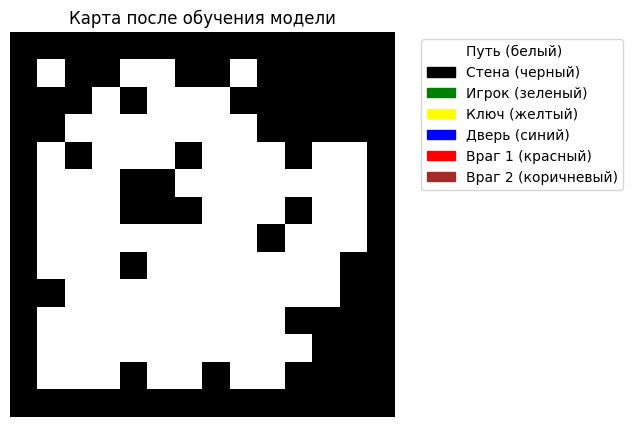

In [ ]:
z = torch.randn(1, 100)
map = torch.argmax(generator(z), dim=1)[0]
visualize_map(map, title="Карта после обучения модели")

# Условная генерация

In [ ]:
def visualize_map_save(map_grid, title=None, save_path=None):
    """Визуализация с базовыми цветами"""
    color_dict = {
        0: [255, 255, 255],  # Белый - путь
        1: [0, 0, 0],        # Черный - стена
        2: [0, 255, 0],      # Зеленый - игрок
        3: [255, 255, 0],    # Желтый - ключ
        4: [0, 0, 255],      # Синий - дверь
        5: [255, 0, 0],      # Красный - враг1
        6: [165, 42, 42]     # Коричневый - враг2
    }
    colors = [
        'white',   # 0 = путь
        'black',   # 1 = стена (должны быть черными)
        'green',   # 2 = игрок
        'yellow',  # 3 = ключ
        'blue',     # 4 = дверь
        'red',     # 5 = враг 1
        'brown',   # 6 = враг 2
    ]
    legend_labels = {
        0: 'Путь (белый)',
        1: 'Стена (черный)',
        2: 'Игрок (зеленый)',
        3: 'Ключ (желтый)',
        4: 'Дверь (синий)',
        5: 'Враг 1 (красный)',
        6: 'Враг 2 (коричневый)',
    }

    # Преобразуем в RGB изображение
    rgb_map = np.zeros((*map_grid.shape, 3), dtype=np.uint8)
    for val in np.unique(map_grid):
        rgb_map[map_grid == val] = color_dict.get(val, [128, 128, 128])


    plt.figure(figsize=(5, 5))
    patches = [Patch(color=colors[i], label=legend_labels[i]) for i in legend_labels]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.imshow(rgb_map)
    plt.axis('off')
    if title == None:
      title = "Карта методом случайных блужданий"
    plt.title(title)

    plt.savefig(save_path)


In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from tqdm import tqdm

class GameMapDataset(Dataset):
    def __init__(self, maps, objects):
        self.maps = torch.FloatTensor(maps)
        self.objects = torch.FloatTensor(objects)

    def __len__(self):
        return len(self.maps)

    def __getitem__(self, idx):
        return self.maps[idx], self.objects[idx]

def get_dataloader(maps, objects, batch_size=32):
    dataset = GameMapDataset(maps, objects)
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [218]:
maps = dataset['maps']
objects = dataset['object_nums']

generator = Generator(
    noise_dim=100,
    embed_dim=5,
    output_channels=7,
    feature_map=64,
    picture_size=14
)

discriminator = Discriminator(
  input_channels=7,
  embed_dim=5,
  feature_map_size=64,
  picture_size=14
)

In [ ]:
!pip install wandb
!wandb login

wandb: Currently logged in as: egor_kra02 (egor_kra02-mipt) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [195]:
import wandb

def train_gan(generator, discriminator, dataloader, epochs=100, noise_dim=100, lr_g = 0.0002, lr_d = 0.0002, beta1 = 0.5, beta2 = 0.999):


    run = wandb.init(project="map-generator-gan", name="Conditional-GAN-3")

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    criterion = nn.BCEWithLogitsLoss()
    optimizer_g = optim.Adam(generator.parameters(), lr=lr_g, betas=(beta1, beta2))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr_d, betas=(beta1, beta2))


    generator.to(device)
    discriminator.to(device)
    for epoch in range(epochs):
        for i, (real_maps, real_objects) in enumerate(tqdm(dataloader)):
              real_maps = real_maps.to(device)
              real_objects = real_objects.to(device) # [B, 5]
              real_maps = F.one_hot(real_maps.long().squeeze(1), 7).permute(0,3,1,2).float() # one-hot для настоящих карт
              batch_size = real_maps.size(0)

              # Подготовка меток
              real_labels = torch.ones(batch_size, 1, device=device)
              fake_labels = torch.zeros(batch_size, 1, device=device)

              # ==================== Обучение дискриминатора ====================
              optimizer_d.zero_grad()

              # Обработка реальных изображений
              real_outputs = discriminator(real_maps, real_objects)
              d_loss_real = criterion(real_outputs, real_labels)

              # Обработка фейковых изображений
              noise = generate_noise(batch_size, noise_dim)
              objects_vec = torch.randint(4, (batch_size, 5), device=device).float()
              fake_maps = generator(noise, objects_vec)
              fake_outputs = discriminator(fake_maps.detach(), objects_vec)
              d_loss_fake = criterion(fake_outputs, fake_labels)

              # Общий loss и backward
              d_loss = d_loss_real + d_loss_fake
              d_loss.backward()
              optimizer_d.step()

              # ==================== Обучение генератора ====================
              optimizer_g.zero_grad()

              # Генерация фейков и вычисление loss
              noise = generate_noise(batch_size, noise_dim)
              objects_vec = torch.randint(4, (batch_size, 5), device=device).float()
              fake_maps = generator(noise, objects_vec)
              outputs = discriminator(fake_maps, objects_vec)
              g_loss = criterion(outputs, real_labels)  # пытаемся обмануть D

              # Loss для условий генератоора
              pred_classes = torch.argmax(fake_maps, dim=1)
              batch_class_counts = torch.zeros(batch_size, 7, device=pred_classes.device)
              for b in range(batch_size):
                  batch_class_counts[b] = torch.bincount(pred_classes[b].view(-1), minlength=7)
              conditional_loss = F.mse_loss(batch_class_counts[:, 2:], objects_vec)
              total_loss = g_loss + conditional_loss * 3
              total_loss.backward()
              optimizer_g.step()

              if i % 10 == 0:
                    print(f"[Epoch {epoch}/{epochs}] [Batch {i}/{len(dataloader)}] "
                          f"D_loss: {d_loss.item():.4f} G_loss: {g_loss.item():.4f}")

        wandb.log({"D_loss": d_loss.item(), "G_loss": g_loss.item(), "conditional_loss": conditional_loss.item()})
        z = torch.randn(1, 100)
        u = torch.tensor([1, 1, 1, 2, 0]).type(torch.FloatTensor).unsqueeze(0)
        map = torch.argmax(generator(z, u), dim=1)[0]
        visualize_map_save(map, title=f"Карта после эпохи {epoch}", save_path=f"gan_results/maps/map_{epoch}.png")

        if epoch % 10 == 0:
            torch.save(generator.state_dict(), f"gan_results/generator_pth/generator_{epoch}.pth")
            torch.save(discriminator.state_dict(), f"gan_results/discriminator_pth/discriminator_{epoch}.pth")

D_loss,▂█▁█▁▁▃▁▂▁
G_loss,▄▆▁█▄▆█▆▆▇
conditional_loss,▆█▁▆▆▇▆▃▇█
D_loss,0.05425
G_loss,13.23008
conditional_loss,4.3


  6%|▋         | 2/32 [00:00<00:05,  5.24it/s]

[Epoch 0/300] [Batch 0/32] D_loss: 1.3654 G_loss: 0.7489


 38%|███▊      | 12/32 [00:02<00:03,  5.41it/s]

[Epoch 0/300] [Batch 10/32] D_loss: 1.1397 G_loss: 0.9373


 69%|██████▉   | 22/32 [00:04<00:01,  5.37it/s]

[Epoch 0/300] [Batch 20/32] D_loss: 0.8269 G_loss: 1.3064


100%|██████████| 32/32 [00:06<00:00,  5.14it/s]

[Epoch 0/300] [Batch 30/32] D_loss: 0.7665 G_loss: 1.4086



  3%|▎         | 1/32 [00:00<00:08,  3.65it/s]

[Epoch 1/300] [Batch 0/32] D_loss: 0.8723 G_loss: 1.3798


 38%|███▊      | 12/32 [00:03<00:04,  4.54it/s]

[Epoch 1/300] [Batch 10/32] D_loss: 0.9283 G_loss: 1.5625


 69%|██████▉   | 22/32 [00:04<00:01,  5.42it/s]

[Epoch 1/300] [Batch 20/32] D_loss: 1.2039 G_loss: 1.2333


100%|██████████| 32/32 [00:06<00:00,  4.85it/s]


[Epoch 1/300] [Batch 30/32] D_loss: 1.0558 G_loss: 1.2584


  6%|▋         | 2/32 [00:00<00:05,  5.19it/s]

[Epoch 2/300] [Batch 0/32] D_loss: 1.1226 G_loss: 1.3893


 38%|███▊      | 12/32 [00:02<00:03,  5.37it/s]

[Epoch 2/300] [Batch 10/32] D_loss: 0.9909 G_loss: 2.2499


 69%|██████▉   | 22/32 [00:04<00:01,  5.54it/s]

[Epoch 2/300] [Batch 20/32] D_loss: 0.8121 G_loss: 1.9208


100%|██████████| 32/32 [00:05<00:00,  5.54it/s]

[Epoch 2/300] [Batch 30/32] D_loss: 0.7947 G_loss: 1.5080



  3%|▎         | 1/32 [00:00<00:09,  3.42it/s]

[Epoch 3/300] [Batch 0/32] D_loss: 0.7385 G_loss: 2.1622


 34%|███▍      | 11/32 [00:03<00:05,  3.58it/s]

[Epoch 3/300] [Batch 10/32] D_loss: 0.7672 G_loss: 2.5230


 69%|██████▉   | 22/32 [00:05<00:01,  5.40it/s]

[Epoch 3/300] [Batch 20/32] D_loss: 0.8620 G_loss: 1.6139


100%|██████████| 32/32 [00:07<00:00,  4.53it/s]


[Epoch 3/300] [Batch 30/32] D_loss: 0.5515 G_loss: 2.5651


  6%|▋         | 2/32 [00:00<00:05,  5.42it/s]

[Epoch 4/300] [Batch 0/32] D_loss: 0.5870 G_loss: 2.4959


 38%|███▊      | 12/32 [00:02<00:03,  5.37it/s]

[Epoch 4/300] [Batch 10/32] D_loss: 0.8315 G_loss: 2.3608


 69%|██████▉   | 22/32 [00:04<00:01,  5.42it/s]

[Epoch 4/300] [Batch 20/32] D_loss: 0.9432 G_loss: 2.4045


100%|██████████| 32/32 [00:05<00:00,  5.53it/s]


[Epoch 4/300] [Batch 30/32] D_loss: 0.4741 G_loss: 2.6152


  6%|▋         | 2/32 [00:00<00:05,  5.37it/s]

[Epoch 5/300] [Batch 0/32] D_loss: 0.6772 G_loss: 2.9939


 34%|███▍      | 11/32 [00:02<00:05,  3.74it/s]

[Epoch 5/300] [Batch 10/32] D_loss: 0.7389 G_loss: 3.1111


 69%|██████▉   | 22/32 [00:05<00:02,  4.77it/s]

[Epoch 5/300] [Batch 20/32] D_loss: 0.5138 G_loss: 3.0344


100%|██████████| 32/32 [00:07<00:00,  4.52it/s]


[Epoch 5/300] [Batch 30/32] D_loss: 0.5416 G_loss: 2.3179


  3%|▎         | 1/32 [00:00<00:06,  4.93it/s]

[Epoch 6/300] [Batch 0/32] D_loss: 0.6832 G_loss: 3.6122


 38%|███▊      | 12/32 [00:02<00:03,  5.44it/s]

[Epoch 6/300] [Batch 10/32] D_loss: 0.5304 G_loss: 2.7452


 69%|██████▉   | 22/32 [00:04<00:01,  5.50it/s]

[Epoch 6/300] [Batch 20/32] D_loss: 0.5523 G_loss: 4.1164


100%|██████████| 32/32 [00:05<00:00,  5.52it/s]


[Epoch 6/300] [Batch 30/32] D_loss: 0.5850 G_loss: 3.6636


  6%|▋         | 2/32 [00:00<00:05,  5.41it/s]

[Epoch 7/300] [Batch 0/32] D_loss: 0.4221 G_loss: 2.6645


 34%|███▍      | 11/32 [00:02<00:04,  4.31it/s]

[Epoch 7/300] [Batch 10/32] D_loss: 0.6481 G_loss: 3.5313


 66%|██████▌   | 21/32 [00:04<00:03,  3.60it/s]

[Epoch 7/300] [Batch 20/32] D_loss: 0.3217 G_loss: 2.8902


100%|██████████| 32/32 [00:07<00:00,  4.56it/s]


[Epoch 7/300] [Batch 30/32] D_loss: 0.5315 G_loss: 4.5341


  6%|▋         | 2/32 [00:00<00:05,  5.19it/s]

[Epoch 8/300] [Batch 0/32] D_loss: 0.5602 G_loss: 5.6300


 38%|███▊      | 12/32 [00:02<00:03,  5.46it/s]

[Epoch 8/300] [Batch 10/32] D_loss: 0.3880 G_loss: 3.1869


 69%|██████▉   | 22/32 [00:04<00:01,  5.37it/s]

[Epoch 8/300] [Batch 20/32] D_loss: 0.3325 G_loss: 4.1716


100%|██████████| 32/32 [00:05<00:00,  5.50it/s]


[Epoch 8/300] [Batch 30/32] D_loss: 0.5377 G_loss: 4.1868


  6%|▋         | 2/32 [00:00<00:05,  5.02it/s]

[Epoch 9/300] [Batch 0/32] D_loss: 0.8532 G_loss: 3.6615


 38%|███▊      | 12/32 [00:02<00:03,  5.49it/s]

[Epoch 9/300] [Batch 10/32] D_loss: 0.4305 G_loss: 4.3111


 66%|██████▌   | 21/32 [00:04<00:02,  3.72it/s]

[Epoch 9/300] [Batch 20/32] D_loss: 0.2351 G_loss: 4.4979


100%|██████████| 32/32 [00:07<00:00,  4.54it/s]


[Epoch 9/300] [Batch 30/32] D_loss: 0.5268 G_loss: 3.7830


  3%|▎         | 1/32 [00:00<00:05,  5.62it/s]

[Epoch 10/300] [Batch 0/32] D_loss: 0.3896 G_loss: 5.0439


 38%|███▊      | 12/32 [00:02<00:03,  5.62it/s]

[Epoch 10/300] [Batch 10/32] D_loss: 0.4951 G_loss: 3.4625


 69%|██████▉   | 22/32 [00:04<00:01,  5.55it/s]

[Epoch 10/300] [Batch 20/32] D_loss: 0.3599 G_loss: 4.8544


100%|██████████| 32/32 [00:05<00:00,  5.56it/s]


[Epoch 10/300] [Batch 30/32] D_loss: 0.3663 G_loss: 5.8621


  6%|▋         | 2/32 [00:00<00:05,  5.66it/s]

[Epoch 11/300] [Batch 0/32] D_loss: 0.6072 G_loss: 5.7203


 38%|███▊      | 12/32 [00:02<00:03,  5.43it/s]

[Epoch 11/300] [Batch 10/32] D_loss: 0.4412 G_loss: 6.3834


 66%|██████▌   | 21/32 [00:04<00:02,  3.99it/s]

[Epoch 11/300] [Batch 20/32] D_loss: 0.3494 G_loss: 4.5053


100%|██████████| 32/32 [00:06<00:00,  4.60it/s]


[Epoch 11/300] [Batch 30/32] D_loss: 0.2850 G_loss: 4.1744


  6%|▋         | 2/32 [00:00<00:05,  5.33it/s]

[Epoch 12/300] [Batch 0/32] D_loss: 0.3346 G_loss: 4.3818


 38%|███▊      | 12/32 [00:02<00:03,  5.40it/s]

[Epoch 12/300] [Batch 10/32] D_loss: 0.2750 G_loss: 4.4067


 69%|██████▉   | 22/32 [00:04<00:01,  5.45it/s]

[Epoch 12/300] [Batch 20/32] D_loss: 0.4164 G_loss: 5.0460


100%|██████████| 32/32 [00:05<00:00,  5.52it/s]


[Epoch 12/300] [Batch 30/32] D_loss: 0.3018 G_loss: 5.5893


  6%|▋         | 2/32 [00:00<00:05,  5.42it/s]

[Epoch 13/300] [Batch 0/32] D_loss: 0.2664 G_loss: 6.2446


 38%|███▊      | 12/32 [00:02<00:03,  5.53it/s]

[Epoch 13/300] [Batch 10/32] D_loss: 0.2668 G_loss: 4.9240


 66%|██████▌   | 21/32 [00:03<00:02,  5.45it/s]

[Epoch 13/300] [Batch 20/32] D_loss: 0.3302 G_loss: 6.6140


100%|██████████| 32/32 [00:06<00:00,  4.85it/s]

[Epoch 13/300] [Batch 30/32] D_loss: 0.3281 G_loss: 6.0448



  3%|▎         | 1/32 [00:00<00:08,  3.71it/s]

[Epoch 14/300] [Batch 0/32] D_loss: 0.3355 G_loss: 5.0068


 38%|███▊      | 12/32 [00:02<00:03,  5.36it/s]

[Epoch 14/300] [Batch 10/32] D_loss: 0.2302 G_loss: 5.9631


 69%|██████▉   | 22/32 [00:04<00:01,  5.19it/s]

[Epoch 14/300] [Batch 20/32] D_loss: 0.1209 G_loss: 6.1863


100%|██████████| 32/32 [00:06<00:00,  5.21it/s]


[Epoch 14/300] [Batch 30/32] D_loss: 0.2218 G_loss: 6.1005


  6%|▋         | 2/32 [00:00<00:05,  5.26it/s]

[Epoch 15/300] [Batch 0/32] D_loss: 0.4081 G_loss: 6.6520


 34%|███▍      | 11/32 [00:02<00:03,  5.46it/s]

[Epoch 15/300] [Batch 10/32] D_loss: 0.2541 G_loss: 5.6337


 69%|██████▉   | 22/32 [00:04<00:01,  5.40it/s]

[Epoch 15/300] [Batch 20/32] D_loss: 0.2782 G_loss: 6.4830


100%|██████████| 32/32 [00:06<00:00,  5.05it/s]

[Epoch 15/300] [Batch 30/32] D_loss: 0.3366 G_loss: 5.4392



  3%|▎         | 1/32 [00:00<00:08,  3.81it/s]

[Epoch 16/300] [Batch 0/32] D_loss: 0.2126 G_loss: 6.7689


 38%|███▊      | 12/32 [00:02<00:04,  4.88it/s]

[Epoch 16/300] [Batch 10/32] D_loss: 0.2699 G_loss: 6.3943


 69%|██████▉   | 22/32 [00:04<00:01,  5.26it/s]

[Epoch 16/300] [Batch 20/32] D_loss: 0.4070 G_loss: 8.4396


100%|██████████| 32/32 [00:06<00:00,  4.90it/s]


[Epoch 16/300] [Batch 30/32] D_loss: 0.2170 G_loss: 7.2284


  6%|▋         | 2/32 [00:00<00:05,  5.28it/s]

[Epoch 17/300] [Batch 0/32] D_loss: 0.3300 G_loss: 5.9407


 38%|███▊      | 12/32 [00:02<00:03,  5.25it/s]

[Epoch 17/300] [Batch 10/32] D_loss: 0.3235 G_loss: 7.3533


 69%|██████▉   | 22/32 [00:04<00:01,  5.40it/s]

[Epoch 17/300] [Batch 20/32] D_loss: 0.3693 G_loss: 5.3225


100%|██████████| 32/32 [00:06<00:00,  5.26it/s]

[Epoch 17/300] [Batch 30/32] D_loss: 0.2433 G_loss: 5.8979



  3%|▎         | 1/32 [00:00<00:08,  3.81it/s]

[Epoch 18/300] [Batch 0/32] D_loss: 0.1720 G_loss: 6.0772


 34%|███▍      | 11/32 [00:02<00:05,  3.63it/s]

[Epoch 18/300] [Batch 10/32] D_loss: 0.3791 G_loss: 6.9147


 69%|██████▉   | 22/32 [00:05<00:01,  5.37it/s]

[Epoch 18/300] [Batch 20/32] D_loss: 0.3821 G_loss: 6.5611


100%|██████████| 32/32 [00:06<00:00,  4.72it/s]


[Epoch 18/300] [Batch 30/32] D_loss: 0.6336 G_loss: 6.7463


  6%|▋         | 2/32 [00:00<00:05,  5.17it/s]

[Epoch 19/300] [Batch 0/32] D_loss: 0.3242 G_loss: 6.4712


 38%|███▊      | 12/32 [00:02<00:03,  5.40it/s]

[Epoch 19/300] [Batch 10/32] D_loss: 0.2687 G_loss: 8.2445


 69%|██████▉   | 22/32 [00:04<00:01,  5.54it/s]

[Epoch 19/300] [Batch 20/32] D_loss: 0.3038 G_loss: 7.4490


100%|██████████| 32/32 [00:05<00:00,  5.55it/s]


[Epoch 19/300] [Batch 30/32] D_loss: 0.3540 G_loss: 7.5670


  6%|▋         | 2/32 [00:00<00:05,  5.37it/s]

[Epoch 20/300] [Batch 0/32] D_loss: 0.4402 G_loss: 8.2565


 34%|███▍      | 11/32 [00:02<00:05,  3.74it/s]

[Epoch 20/300] [Batch 10/32] D_loss: 0.5314 G_loss: 8.4977


 69%|██████▉   | 22/32 [00:05<00:02,  4.96it/s]

[Epoch 20/300] [Batch 20/32] D_loss: 0.1942 G_loss: 6.3922


100%|██████████| 32/32 [00:07<00:00,  4.47it/s]
<ipython-input-174-ae9b14d0bdda>:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5, 5))


[Epoch 20/300] [Batch 30/32] D_loss: 0.3835 G_loss: 8.9979


  6%|▋         | 2/32 [00:00<00:05,  5.28it/s]

[Epoch 21/300] [Batch 0/32] D_loss: 0.2667 G_loss: 7.1407


 38%|███▊      | 12/32 [00:02<00:03,  5.42it/s]

[Epoch 21/300] [Batch 10/32] D_loss: 0.0983 G_loss: 6.7631


 69%|██████▉   | 22/32 [00:04<00:01,  5.35it/s]

[Epoch 21/300] [Batch 20/32] D_loss: 0.3537 G_loss: 8.2092


100%|██████████| 32/32 [00:05<00:00,  5.53it/s]


[Epoch 21/300] [Batch 30/32] D_loss: 0.2850 G_loss: 7.8151


  6%|▋         | 2/32 [00:00<00:05,  5.53it/s]

[Epoch 22/300] [Batch 0/32] D_loss: 0.2531 G_loss: 8.4854


 34%|███▍      | 11/32 [00:02<00:05,  3.92it/s]

[Epoch 22/300] [Batch 10/32] D_loss: 0.4008 G_loss: 8.9337


 66%|██████▌   | 21/32 [00:05<00:03,  3.64it/s]

[Epoch 22/300] [Batch 20/32] D_loss: 0.2326 G_loss: 10.6972


100%|██████████| 32/32 [00:07<00:00,  4.50it/s]


[Epoch 22/300] [Batch 30/32] D_loss: 0.1404 G_loss: 7.7555


  6%|▋         | 2/32 [00:00<00:05,  5.23it/s]

[Epoch 23/300] [Batch 0/32] D_loss: 0.2980 G_loss: 9.6298


 38%|███▊      | 12/32 [00:02<00:03,  5.36it/s]

[Epoch 23/300] [Batch 10/32] D_loss: 0.3646 G_loss: 10.1768


 69%|██████▉   | 22/32 [00:04<00:01,  5.59it/s]

[Epoch 23/300] [Batch 20/32] D_loss: 0.4753 G_loss: 10.3567


100%|██████████| 32/32 [00:05<00:00,  5.51it/s]


[Epoch 23/300] [Batch 30/32] D_loss: 0.1595 G_loss: 8.1020


  6%|▋         | 2/32 [00:00<00:05,  5.40it/s]

[Epoch 24/300] [Batch 0/32] D_loss: 0.2669 G_loss: 8.6412


 34%|███▍      | 11/32 [00:02<00:04,  4.54it/s]

[Epoch 24/300] [Batch 10/32] D_loss: 0.0800 G_loss: 7.7413


 66%|██████▌   | 21/32 [00:05<00:03,  3.53it/s]

[Epoch 24/300] [Batch 20/32] D_loss: 0.6092 G_loss: 10.1249


100%|██████████| 32/32 [00:07<00:00,  4.35it/s]


[Epoch 24/300] [Batch 30/32] D_loss: 0.2289 G_loss: 8.6131


  6%|▋         | 2/32 [00:00<00:05,  5.13it/s]

[Epoch 25/300] [Batch 0/32] D_loss: 0.1812 G_loss: 8.0008


 38%|███▊      | 12/32 [00:02<00:03,  5.39it/s]

[Epoch 25/300] [Batch 10/32] D_loss: 0.1170 G_loss: 9.5589


 69%|██████▉   | 22/32 [00:04<00:01,  5.42it/s]

[Epoch 25/300] [Batch 20/32] D_loss: 0.1722 G_loss: 8.0486


100%|██████████| 32/32 [00:05<00:00,  5.41it/s]


[Epoch 25/300] [Batch 30/32] D_loss: 0.2317 G_loss: 11.3843


  6%|▋         | 2/32 [00:00<00:05,  5.40it/s]

[Epoch 26/300] [Batch 0/32] D_loss: 0.2295 G_loss: 7.6557


 38%|███▊      | 12/32 [00:02<00:03,  5.44it/s]

[Epoch 26/300] [Batch 10/32] D_loss: 0.3593 G_loss: 10.6829


 66%|██████▌   | 21/32 [00:04<00:02,  3.81it/s]

[Epoch 26/300] [Batch 20/32] D_loss: 0.1734 G_loss: 9.4636


100%|██████████| 32/32 [00:07<00:00,  4.53it/s]


[Epoch 26/300] [Batch 30/32] D_loss: 0.3574 G_loss: 11.6084


  6%|▋         | 2/32 [00:00<00:05,  5.33it/s]

[Epoch 27/300] [Batch 0/32] D_loss: 0.1690 G_loss: 9.8546


 38%|███▊      | 12/32 [00:02<00:03,  5.28it/s]

[Epoch 27/300] [Batch 10/32] D_loss: 0.2217 G_loss: 9.7207


 69%|██████▉   | 22/32 [00:04<00:01,  5.45it/s]

[Epoch 27/300] [Batch 20/32] D_loss: 0.4546 G_loss: 12.4506


100%|██████████| 32/32 [00:05<00:00,  5.49it/s]


[Epoch 27/300] [Batch 30/32] D_loss: 0.2740 G_loss: 9.7571


  3%|▎         | 1/32 [00:00<00:06,  4.99it/s]

[Epoch 28/300] [Batch 0/32] D_loss: 0.2761 G_loss: 9.3809


 38%|███▊      | 12/32 [00:02<00:03,  5.37it/s]

[Epoch 28/300] [Batch 10/32] D_loss: 0.3071 G_loss: 11.8909


 66%|██████▌   | 21/32 [00:04<00:02,  4.08it/s]

[Epoch 28/300] [Batch 20/32] D_loss: 0.5006 G_loss: 13.0473


100%|██████████| 32/32 [00:07<00:00,  4.51it/s]

[Epoch 28/300] [Batch 30/32] D_loss: 0.2385 G_loss: 13.4223



  6%|▋         | 2/32 [00:00<00:05,  5.26it/s]

[Epoch 29/300] [Batch 0/32] D_loss: 0.2488 G_loss: 10.5561


 38%|███▊      | 12/32 [00:02<00:03,  5.45it/s]

[Epoch 29/300] [Batch 10/32] D_loss: 0.3641 G_loss: 11.4866


 69%|██████▉   | 22/32 [00:04<00:01,  5.34it/s]

[Epoch 29/300] [Batch 20/32] D_loss: 0.1395 G_loss: 9.5554


100%|██████████| 32/32 [00:05<00:00,  5.42it/s]


[Epoch 29/300] [Batch 30/32] D_loss: 0.2196 G_loss: 11.2274


  6%|▋         | 2/32 [00:00<00:05,  5.34it/s]

[Epoch 30/300] [Batch 0/32] D_loss: 0.1331 G_loss: 9.9438


 38%|███▊      | 12/32 [00:02<00:03,  5.39it/s]

[Epoch 30/300] [Batch 10/32] D_loss: 0.3319 G_loss: 12.2673


 66%|██████▌   | 21/32 [00:03<00:02,  5.23it/s]

[Epoch 30/300] [Batch 20/32] D_loss: 0.4184 G_loss: 11.8198


100%|██████████| 32/32 [00:06<00:00,  4.77it/s]

[Epoch 30/300] [Batch 30/32] D_loss: 0.3818 G_loss: 13.0554



  3%|▎         | 1/32 [00:00<00:09,  3.21it/s]

[Epoch 31/300] [Batch 0/32] D_loss: 0.2966 G_loss: 11.4189


 38%|███▊      | 12/32 [00:02<00:03,  5.18it/s]

[Epoch 31/300] [Batch 10/32] D_loss: 0.1409 G_loss: 12.1875


 69%|██████▉   | 22/32 [00:04<00:01,  5.23it/s]

[Epoch 31/300] [Batch 20/32] D_loss: 0.2396 G_loss: 10.2120


100%|██████████| 32/32 [00:06<00:00,  5.13it/s]


[Epoch 31/300] [Batch 30/32] D_loss: 0.2662 G_loss: 12.6992


  6%|▋         | 2/32 [00:00<00:05,  5.08it/s]

[Epoch 32/300] [Batch 0/32] D_loss: 0.4277 G_loss: 14.5055


 34%|███▍      | 11/32 [00:02<00:04,  5.22it/s]

[Epoch 32/300] [Batch 10/32] D_loss: 0.2556 G_loss: 16.4534


 69%|██████▉   | 22/32 [00:04<00:01,  5.29it/s]

[Epoch 32/300] [Batch 20/32] D_loss: 0.0997 G_loss: 11.9577


100%|██████████| 32/32 [00:06<00:00,  4.83it/s]

[Epoch 32/300] [Batch 30/32] D_loss: 0.0412 G_loss: 7.8543



  3%|▎         | 1/32 [00:00<00:08,  3.73it/s]

[Epoch 33/300] [Batch 0/32] D_loss: 0.2782 G_loss: 14.1701


 38%|███▊      | 12/32 [00:02<00:03,  5.10it/s]

[Epoch 33/300] [Batch 10/32] D_loss: 0.2053 G_loss: 11.2772


 69%|██████▉   | 22/32 [00:04<00:01,  5.23it/s]

[Epoch 33/300] [Batch 20/32] D_loss: 0.2321 G_loss: 13.0359


100%|██████████| 32/32 [00:06<00:00,  4.90it/s]


[Epoch 33/300] [Batch 30/32] D_loss: 0.1944 G_loss: 15.6673


  3%|▎         | 1/32 [00:00<00:06,  4.88it/s]

[Epoch 34/300] [Batch 0/32] D_loss: 0.1875 G_loss: 12.4290


 38%|███▊      | 12/32 [00:02<00:03,  5.20it/s]

[Epoch 34/300] [Batch 10/32] D_loss: 0.1299 G_loss: 13.2037


 69%|██████▉   | 22/32 [00:04<00:01,  5.27it/s]

[Epoch 34/300] [Batch 20/32] D_loss: 0.2209 G_loss: 14.1107


100%|██████████| 32/32 [00:06<00:00,  4.88it/s]

[Epoch 34/300] [Batch 30/32] D_loss: 0.3823 G_loss: 16.0588



  3%|▎         | 1/32 [00:00<00:08,  3.74it/s]

[Epoch 35/300] [Batch 0/32] D_loss: 0.0352 G_loss: 16.8812


 38%|███▊      | 12/32 [00:02<00:04,  4.79it/s]

[Epoch 35/300] [Batch 10/32] D_loss: 0.2140 G_loss: 14.6945


 69%|██████▉   | 22/32 [00:04<00:01,  5.15it/s]

[Epoch 35/300] [Batch 20/32] D_loss: 0.1956 G_loss: 12.8954


100%|██████████| 32/32 [00:06<00:00,  4.74it/s]

[Epoch 35/300] [Batch 30/32] D_loss: 0.2082 G_loss: 14.6780



  6%|▋         | 2/32 [00:00<00:05,  5.29it/s]

[Epoch 36/300] [Batch 0/32] D_loss: 0.2931 G_loss: 13.1385


 38%|███▊      | 12/32 [00:02<00:03,  5.26it/s]

[Epoch 36/300] [Batch 10/32] D_loss: 0.0393 G_loss: 13.7877


 69%|██████▉   | 22/32 [00:04<00:01,  5.23it/s]

[Epoch 36/300] [Batch 20/32] D_loss: 0.0451 G_loss: 16.7608


100%|██████████| 32/32 [00:06<00:00,  4.95it/s]

[Epoch 36/300] [Batch 30/32] D_loss: 0.1394 G_loss: 16.0982



  3%|▎         | 1/32 [00:00<00:08,  3.50it/s]

[Epoch 37/300] [Batch 0/32] D_loss: 0.1039 G_loss: 16.3722


 38%|███▊      | 12/32 [00:03<00:04,  4.38it/s]

[Epoch 37/300] [Batch 10/32] D_loss: 0.1803 G_loss: 18.9026


 69%|██████▉   | 22/32 [00:05<00:01,  5.15it/s]

[Epoch 37/300] [Batch 20/32] D_loss: 0.0979 G_loss: 14.4408


100%|██████████| 32/32 [00:07<00:00,  4.54it/s]


[Epoch 37/300] [Batch 30/32] D_loss: 0.3262 G_loss: 13.5798


  3%|▎         | 1/32 [00:00<00:06,  4.91it/s]

[Epoch 38/300] [Batch 0/32] D_loss: 0.2372 G_loss: 15.1659


 34%|███▍      | 11/32 [00:02<00:04,  5.18it/s]

[Epoch 38/300] [Batch 10/32] D_loss: 0.2926 G_loss: 19.8930


 69%|██████▉   | 22/32 [00:04<00:01,  5.05it/s]

[Epoch 38/300] [Batch 20/32] D_loss: 0.1171 G_loss: 12.7844


100%|██████████| 32/32 [00:06<00:00,  4.88it/s]

[Epoch 38/300] [Batch 30/32] D_loss: 0.0973 G_loss: 16.6371



  3%|▎         | 1/32 [00:00<00:08,  3.60it/s]

[Epoch 39/300] [Batch 0/32] D_loss: 0.0675 G_loss: 16.4723


 34%|███▍      | 11/32 [00:02<00:05,  4.08it/s]

[Epoch 39/300] [Batch 10/32] D_loss: 0.1399 G_loss: 19.2000


 66%|██████▌   | 21/32 [00:04<00:02,  5.04it/s]

[Epoch 39/300] [Batch 20/32] D_loss: 0.0968 G_loss: 18.3734


100%|██████████| 32/32 [00:07<00:00,  4.54it/s]


[Epoch 39/300] [Batch 30/32] D_loss: 0.1021 G_loss: 20.2550


  6%|▋         | 2/32 [00:00<00:05,  5.07it/s]

[Epoch 40/300] [Batch 0/32] D_loss: 0.0569 G_loss: 15.5829


 34%|███▍      | 11/32 [00:02<00:04,  5.04it/s]

[Epoch 40/300] [Batch 10/32] D_loss: 0.0838 G_loss: 18.8483


 66%|██████▌   | 21/32 [00:04<00:02,  4.96it/s]

[Epoch 40/300] [Batch 20/32] D_loss: 0.1683 G_loss: 17.2136


100%|██████████| 32/32 [00:06<00:00,  4.73it/s]

[Epoch 40/300] [Batch 30/32] D_loss: 0.0562 G_loss: 21.9054



  3%|▎         | 1/32 [00:00<00:08,  3.50it/s]

[Epoch 41/300] [Batch 0/32] D_loss: 0.1933 G_loss: 18.1156


 38%|███▊      | 12/32 [00:03<00:04,  4.48it/s]

[Epoch 41/300] [Batch 10/32] D_loss: 0.2735 G_loss: 17.4717


 66%|██████▌   | 21/32 [00:05<00:02,  4.76it/s]

[Epoch 41/300] [Batch 20/32] D_loss: 0.0559 G_loss: 16.0878


100%|██████████| 32/32 [00:07<00:00,  4.54it/s]


[Epoch 41/300] [Batch 30/32] D_loss: 0.1142 G_loss: 17.4530


  6%|▋         | 2/32 [00:00<00:06,  4.98it/s]

[Epoch 42/300] [Batch 0/32] D_loss: 0.1413 G_loss: 19.4784


 34%|███▍      | 11/32 [00:02<00:04,  4.91it/s]

[Epoch 42/300] [Batch 10/32] D_loss: 0.0695 G_loss: 21.4587


 69%|██████▉   | 22/32 [00:04<00:01,  5.04it/s]

[Epoch 42/300] [Batch 20/32] D_loss: 0.0267 G_loss: 18.9644


100%|██████████| 32/32 [00:06<00:00,  4.73it/s]

[Epoch 42/300] [Batch 30/32] D_loss: 0.0685 G_loss: 20.3424



  3%|▎         | 1/32 [00:00<00:09,  3.18it/s]

[Epoch 43/300] [Batch 0/32] D_loss: 0.0604 G_loss: 19.8947


 34%|███▍      | 11/32 [00:02<00:04,  4.38it/s]

[Epoch 43/300] [Batch 10/32] D_loss: 0.1973 G_loss: 21.7186


 66%|██████▌   | 21/32 [00:04<00:02,  5.01it/s]

[Epoch 43/300] [Batch 20/32] D_loss: 0.0849 G_loss: 24.6793


100%|██████████| 32/32 [00:07<00:00,  4.46it/s]


[Epoch 43/300] [Batch 30/32] D_loss: 0.1729 G_loss: 24.8910


  6%|▋         | 2/32 [00:00<00:06,  4.71it/s]

[Epoch 44/300] [Batch 0/32] D_loss: 0.0813 G_loss: 21.9954


 34%|███▍      | 11/32 [00:02<00:04,  4.65it/s]

[Epoch 44/300] [Batch 10/32] D_loss: 0.1348 G_loss: 26.5139


 66%|██████▌   | 21/32 [00:04<00:02,  4.61it/s]

[Epoch 44/300] [Batch 20/32] D_loss: 0.1433 G_loss: 25.1561


100%|██████████| 32/32 [00:07<00:00,  4.32it/s]

[Epoch 44/300] [Batch 30/32] D_loss: 0.3052 G_loss: 26.4814



  3%|▎         | 1/32 [00:00<00:10,  2.92it/s]

[Epoch 45/300] [Batch 0/32] D_loss: 0.2306 G_loss: 20.6628


 34%|███▍      | 11/32 [00:02<00:04,  4.69it/s]

[Epoch 45/300] [Batch 10/32] D_loss: 0.0605 G_loss: 22.9180


 66%|██████▌   | 21/32 [00:04<00:02,  4.76it/s]

[Epoch 45/300] [Batch 20/32] D_loss: 0.0534 G_loss: 20.5118


100%|██████████| 32/32 [00:06<00:00,  4.58it/s]


[Epoch 45/300] [Batch 30/32] D_loss: 0.0513 G_loss: 22.1255


  3%|▎         | 1/32 [00:00<00:06,  4.50it/s]

[Epoch 46/300] [Batch 0/32] D_loss: 0.1732 G_loss: 26.3402


 34%|███▍      | 11/32 [00:02<00:04,  4.79it/s]

[Epoch 46/300] [Batch 10/32] D_loss: 0.0083 G_loss: 21.1914


 66%|██████▌   | 21/32 [00:04<00:02,  4.10it/s]

[Epoch 46/300] [Batch 20/32] D_loss: 0.1482 G_loss: 24.5715


100%|██████████| 32/32 [00:07<00:00,  4.16it/s]

[Epoch 46/300] [Batch 30/32] D_loss: 0.0847 G_loss: 22.5154



  3%|▎         | 1/32 [00:00<00:07,  4.02it/s]

[Epoch 47/300] [Batch 0/32] D_loss: 0.5011 G_loss: 19.9788


 34%|███▍      | 11/32 [00:02<00:04,  4.54it/s]

[Epoch 47/300] [Batch 10/32] D_loss: 0.1288 G_loss: 23.8684


 66%|██████▌   | 21/32 [00:04<00:02,  4.68it/s]

[Epoch 47/300] [Batch 20/32] D_loss: 0.0669 G_loss: 25.9220


100%|██████████| 32/32 [00:06<00:00,  4.74it/s]


[Epoch 47/300] [Batch 30/32] D_loss: 0.6542 G_loss: 24.7363


  3%|▎         | 1/32 [00:00<00:06,  4.53it/s]

[Epoch 48/300] [Batch 0/32] D_loss: 0.1878 G_loss: 25.8234


 34%|███▍      | 11/32 [00:02<00:04,  4.53it/s]

[Epoch 48/300] [Batch 10/32] D_loss: 0.0519 G_loss: 24.2848


 66%|██████▌   | 21/32 [00:05<00:03,  3.30it/s]

[Epoch 48/300] [Batch 20/32] D_loss: 0.0130 G_loss: 25.0812


100%|██████████| 32/32 [00:07<00:00,  4.01it/s]


[Epoch 48/300] [Batch 30/32] D_loss: 0.0164 G_loss: 23.1187


  3%|▎         | 1/32 [00:00<00:06,  4.58it/s]

[Epoch 49/300] [Batch 0/32] D_loss: 0.0036 G_loss: 17.6851


 38%|███▊      | 12/32 [00:02<00:04,  4.91it/s]

[Epoch 49/300] [Batch 10/32] D_loss: 0.1053 G_loss: 24.2846


 66%|██████▌   | 21/32 [00:04<00:02,  4.58it/s]

[Epoch 49/300] [Batch 20/32] D_loss: 0.0900 G_loss: 20.9465


100%|██████████| 32/32 [00:06<00:00,  4.82it/s]

[Epoch 49/300] [Batch 30/32] D_loss: 0.2955 G_loss: 29.6630



  6%|▋         | 2/32 [00:00<00:05,  5.02it/s]

[Epoch 50/300] [Batch 0/32] D_loss: 0.7222 G_loss: 12.0454


 34%|███▍      | 11/32 [00:02<00:05,  3.59it/s]

[Epoch 50/300] [Batch 10/32] D_loss: 0.0257 G_loss: 23.7429


 66%|██████▌   | 21/32 [00:05<00:03,  3.45it/s]

[Epoch 50/300] [Batch 20/32] D_loss: 0.0243 G_loss: 23.8299


100%|██████████| 32/32 [00:07<00:00,  4.04it/s]

[Epoch 50/300] [Batch 30/32] D_loss: 0.0527 G_loss: 21.9744



  3%|▎         | 1/32 [00:00<00:06,  4.71it/s]

[Epoch 51/300] [Batch 0/32] D_loss: 0.0554 G_loss: 24.4737


 34%|███▍      | 11/32 [00:02<00:04,  4.73it/s]

[Epoch 51/300] [Batch 10/32] D_loss: 0.2589 G_loss: 28.1566


 66%|██████▌   | 21/32 [00:04<00:02,  4.71it/s]

[Epoch 51/300] [Batch 20/32] D_loss: 0.2080 G_loss: 24.2222


100%|██████████| 32/32 [00:06<00:00,  4.74it/s]


[Epoch 51/300] [Batch 30/32] D_loss: 0.0120 G_loss: 22.8895


  3%|▎         | 1/32 [00:00<00:06,  4.86it/s]

[Epoch 52/300] [Batch 0/32] D_loss: 0.0739 G_loss: 21.3113


 34%|███▍      | 11/32 [00:03<00:06,  3.39it/s]

[Epoch 52/300] [Batch 10/32] D_loss: 0.2346 G_loss: 29.2400


 66%|██████▌   | 21/32 [00:05<00:02,  4.36it/s]

[Epoch 52/300] [Batch 20/32] D_loss: 0.0329 G_loss: 21.8371


100%|██████████| 32/32 [00:07<00:00,  4.05it/s]


[Epoch 52/300] [Batch 30/32] D_loss: 0.0197 G_loss: 21.0246


  3%|▎         | 1/32 [00:00<00:06,  4.81it/s]

[Epoch 53/300] [Batch 0/32] D_loss: 0.0405 G_loss: 18.8433


 38%|███▊      | 12/32 [00:02<00:04,  4.83it/s]

[Epoch 53/300] [Batch 10/32] D_loss: 0.0940 G_loss: 23.0635


 66%|██████▌   | 21/32 [00:04<00:02,  4.76it/s]

[Epoch 53/300] [Batch 20/32] D_loss: 0.0331 G_loss: 20.1411


100%|██████████| 32/32 [00:06<00:00,  4.77it/s]

[Epoch 53/300] [Batch 30/32] D_loss: 0.0856 G_loss: 18.8911



  3%|▎         | 1/32 [00:00<00:09,  3.12it/s]

[Epoch 54/300] [Batch 0/32] D_loss: 0.4915 G_loss: 20.4411


 34%|███▍      | 11/32 [00:03<00:06,  3.38it/s]

[Epoch 54/300] [Batch 10/32] D_loss: 0.0441 G_loss: 23.1019


 66%|██████▌   | 21/32 [00:05<00:02,  4.96it/s]

[Epoch 54/300] [Batch 20/32] D_loss: 0.3192 G_loss: 22.1324


100%|██████████| 32/32 [00:07<00:00,  4.26it/s]

[Epoch 54/300] [Batch 30/32] D_loss: 0.1859 G_loss: 21.8170



  3%|▎         | 1/32 [00:00<00:06,  5.07it/s]

[Epoch 55/300] [Batch 0/32] D_loss: 0.1380 G_loss: 20.2557


 38%|███▊      | 12/32 [00:02<00:04,  4.95it/s]

[Epoch 55/300] [Batch 10/32] D_loss: 0.0493 G_loss: 16.2740


 66%|██████▌   | 21/32 [00:04<00:02,  4.58it/s]

[Epoch 55/300] [Batch 20/32] D_loss: 0.0534 G_loss: 17.6766


100%|██████████| 32/32 [00:07<00:00,  4.51it/s]

[Epoch 55/300] [Batch 30/32] D_loss: 0.0730 G_loss: 17.6732



  3%|▎         | 1/32 [00:00<00:09,  3.42it/s]

[Epoch 56/300] [Batch 0/32] D_loss: 0.0555 G_loss: 19.5847


 34%|███▍      | 11/32 [00:02<00:04,  4.27it/s]

[Epoch 56/300] [Batch 10/32] D_loss: 0.1860 G_loss: 16.4447


 66%|██████▌   | 21/32 [00:05<00:02,  4.60it/s]

[Epoch 56/300] [Batch 20/32] D_loss: 0.1912 G_loss: 24.3680


100%|██████████| 32/32 [00:07<00:00,  4.40it/s]


[Epoch 56/300] [Batch 30/32] D_loss: 0.0412 G_loss: 21.0550


  3%|▎         | 1/32 [00:00<00:06,  4.66it/s]

[Epoch 57/300] [Batch 0/32] D_loss: 0.0511 G_loss: 19.8670


 34%|███▍      | 11/32 [00:02<00:04,  4.75it/s]

[Epoch 57/300] [Batch 10/32] D_loss: 0.0848 G_loss: 18.1004


 66%|██████▌   | 21/32 [00:04<00:02,  4.82it/s]

[Epoch 57/300] [Batch 20/32] D_loss: 0.1483 G_loss: 16.8545


100%|██████████| 32/32 [00:07<00:00,  4.50it/s]

[Epoch 57/300] [Batch 30/32] D_loss: 0.0356 G_loss: 20.9245



  3%|▎         | 1/32 [00:00<00:09,  3.42it/s]

[Epoch 58/300] [Batch 0/32] D_loss: 0.0175 G_loss: 19.6959


 38%|███▊      | 12/32 [00:02<00:04,  4.74it/s]

[Epoch 58/300] [Batch 10/32] D_loss: 0.0669 G_loss: 19.9451


 66%|██████▌   | 21/32 [00:04<00:02,  4.91it/s]

[Epoch 58/300] [Batch 20/32] D_loss: 0.0666 G_loss: 14.6588


100%|██████████| 32/32 [00:06<00:00,  4.59it/s]


[Epoch 58/300] [Batch 30/32] D_loss: 0.0359 G_loss: 13.8217


  3%|▎         | 1/32 [00:00<00:06,  4.96it/s]

[Epoch 59/300] [Batch 0/32] D_loss: 0.0261 G_loss: 18.8726


 34%|███▍      | 11/32 [00:02<00:04,  4.86it/s]

[Epoch 59/300] [Batch 10/32] D_loss: 0.0055 G_loss: 14.7478


 66%|██████▌   | 21/32 [00:04<00:02,  4.83it/s]

[Epoch 59/300] [Batch 20/32] D_loss: 0.0208 G_loss: 18.5815


100%|██████████| 32/32 [00:07<00:00,  4.36it/s]

[Epoch 59/300] [Batch 30/32] D_loss: 0.2843 G_loss: 20.4104



  3%|▎         | 1/32 [00:00<00:09,  3.22it/s]

[Epoch 60/300] [Batch 0/32] D_loss: 0.2894 G_loss: 17.4687


 34%|███▍      | 11/32 [00:02<00:04,  4.57it/s]

[Epoch 60/300] [Batch 10/32] D_loss: 0.2678 G_loss: 22.3784


 66%|██████▌   | 21/32 [00:04<00:02,  4.79it/s]

[Epoch 60/300] [Batch 20/32] D_loss: 0.1111 G_loss: 16.4129


100%|██████████| 32/32 [00:06<00:00,  4.66it/s]


[Epoch 60/300] [Batch 30/32] D_loss: 0.0302 G_loss: 18.2127


  3%|▎         | 1/32 [00:00<00:06,  4.51it/s]

[Epoch 61/300] [Batch 0/32] D_loss: 0.3593 G_loss: 19.4156


 34%|███▍      | 11/32 [00:02<00:04,  4.75it/s]

[Epoch 61/300] [Batch 10/32] D_loss: 0.1022 G_loss: 17.3556


 66%|██████▌   | 21/32 [00:04<00:02,  3.93it/s]

[Epoch 61/300] [Batch 20/32] D_loss: 0.0850 G_loss: 17.6763


100%|██████████| 32/32 [00:07<00:00,  4.13it/s]

[Epoch 61/300] [Batch 30/32] D_loss: 0.0081 G_loss: 13.4844



  3%|▎         | 1/32 [00:00<00:06,  4.85it/s]

[Epoch 62/300] [Batch 0/32] D_loss: 0.0588 G_loss: 18.5969


 34%|███▍      | 11/32 [00:02<00:04,  4.79it/s]

[Epoch 62/300] [Batch 10/32] D_loss: 0.1406 G_loss: 17.5325


 66%|██████▌   | 21/32 [00:04<00:02,  4.91it/s]

[Epoch 62/300] [Batch 20/32] D_loss: 0.0389 G_loss: 17.3507


100%|██████████| 32/32 [00:06<00:00,  4.93it/s]

[Epoch 62/300] [Batch 30/32] D_loss: 0.0651 G_loss: 20.0898



  6%|▋         | 2/32 [00:00<00:06,  4.99it/s]

[Epoch 63/300] [Batch 0/32] D_loss: 0.0167 G_loss: 14.9308


 34%|███▍      | 11/32 [00:02<00:04,  4.91it/s]

[Epoch 63/300] [Batch 10/32] D_loss: 0.0426 G_loss: 15.3916


 66%|██████▌   | 21/32 [00:04<00:02,  3.69it/s]

[Epoch 63/300] [Batch 20/32] D_loss: 0.0519 G_loss: 18.5765


100%|██████████| 32/32 [00:07<00:00,  4.19it/s]


[Epoch 63/300] [Batch 30/32] D_loss: 0.1789 G_loss: 23.6677


  6%|▋         | 2/32 [00:00<00:06,  4.95it/s]

[Epoch 64/300] [Batch 0/32] D_loss: 0.0573 G_loss: 15.9542


 34%|███▍      | 11/32 [00:02<00:04,  4.93it/s]

[Epoch 64/300] [Batch 10/32] D_loss: 0.0826 G_loss: 21.8377


 66%|██████▌   | 21/32 [00:04<00:02,  4.86it/s]

[Epoch 64/300] [Batch 20/32] D_loss: 0.0156 G_loss: 15.4263


100%|██████████| 32/32 [00:06<00:00,  4.91it/s]

[Epoch 64/300] [Batch 30/32] D_loss: 0.1687 G_loss: 18.7547



  6%|▋         | 2/32 [00:00<00:06,  4.87it/s]

[Epoch 65/300] [Batch 0/32] D_loss: 0.2524 G_loss: 16.4255


 38%|███▊      | 12/32 [00:02<00:04,  4.88it/s]

[Epoch 65/300] [Batch 10/32] D_loss: 0.0304 G_loss: 20.0701


 66%|██████▌   | 21/32 [00:05<00:03,  3.53it/s]

[Epoch 65/300] [Batch 20/32] D_loss: 0.0810 G_loss: 20.2318


100%|██████████| 32/32 [00:07<00:00,  4.15it/s]


[Epoch 65/300] [Batch 30/32] D_loss: 0.0240 G_loss: 15.7041


  3%|▎         | 1/32 [00:00<00:06,  4.88it/s]

[Epoch 66/300] [Batch 0/32] D_loss: 0.1050 G_loss: 20.1940


 34%|███▍      | 11/32 [00:02<00:04,  4.75it/s]

[Epoch 66/300] [Batch 10/32] D_loss: 0.0073 G_loss: 16.9530


 66%|██████▌   | 21/32 [00:04<00:02,  4.76it/s]

[Epoch 66/300] [Batch 20/32] D_loss: 0.0321 G_loss: 20.3902


100%|██████████| 32/32 [00:06<00:00,  4.84it/s]


[Epoch 66/300] [Batch 30/32] D_loss: 0.0387 G_loss: 21.4875


  3%|▎         | 1/32 [00:00<00:06,  4.64it/s]

[Epoch 67/300] [Batch 0/32] D_loss: 0.0628 G_loss: 16.1091


 34%|███▍      | 11/32 [00:02<00:04,  4.59it/s]

[Epoch 67/300] [Batch 10/32] D_loss: 0.0256 G_loss: 21.0330


 66%|██████▌   | 21/32 [00:05<00:03,  3.33it/s]

[Epoch 67/300] [Batch 20/32] D_loss: 0.0468 G_loss: 19.0683


100%|██████████| 32/32 [00:07<00:00,  4.11it/s]

[Epoch 67/300] [Batch 30/32] D_loss: 0.0393 G_loss: 15.3436



  3%|▎         | 1/32 [00:00<00:06,  5.13it/s]

[Epoch 68/300] [Batch 0/32] D_loss: 0.1796 G_loss: 20.0484


 34%|███▍      | 11/32 [00:02<00:04,  4.72it/s]

[Epoch 68/300] [Batch 10/32] D_loss: 0.0441 G_loss: 16.4374


 66%|██████▌   | 21/32 [00:04<00:02,  4.85it/s]

[Epoch 68/300] [Batch 20/32] D_loss: 0.0394 G_loss: 17.2597


100%|██████████| 32/32 [00:06<00:00,  4.92it/s]


[Epoch 68/300] [Batch 30/32] D_loss: 0.0855 G_loss: 19.2065


  3%|▎         | 1/32 [00:00<00:06,  4.99it/s]

[Epoch 69/300] [Batch 0/32] D_loss: 0.0150 G_loss: 18.9553


 34%|███▍      | 11/32 [00:02<00:05,  3.59it/s]

[Epoch 69/300] [Batch 10/32] D_loss: 0.0572 G_loss: 17.6787


 66%|██████▌   | 21/32 [00:05<00:03,  3.59it/s]

[Epoch 69/300] [Batch 20/32] D_loss: 0.0255 G_loss: 17.1955


100%|██████████| 32/32 [00:07<00:00,  4.13it/s]


[Epoch 69/300] [Batch 30/32] D_loss: 0.0197 G_loss: 16.4489


  3%|▎         | 1/32 [00:00<00:07,  4.00it/s]

[Epoch 70/300] [Batch 0/32] D_loss: 1.9026 G_loss: 4.0176


 38%|███▊      | 12/32 [00:02<00:03,  5.02it/s]

[Epoch 70/300] [Batch 10/32] D_loss: 0.2570 G_loss: 14.6271


 66%|██████▌   | 21/32 [00:04<00:02,  5.15it/s]

[Epoch 70/300] [Batch 20/32] D_loss: 0.1660 G_loss: 11.1315


100%|██████████| 32/32 [00:06<00:00,  5.10it/s]


[Epoch 70/300] [Batch 30/32] D_loss: 0.1950 G_loss: 12.2129


  6%|▋         | 2/32 [00:00<00:05,  5.09it/s]

[Epoch 71/300] [Batch 0/32] D_loss: 0.1236 G_loss: 10.3013


 34%|███▍      | 11/32 [00:02<00:05,  3.83it/s]

[Epoch 71/300] [Batch 10/32] D_loss: 0.2814 G_loss: 11.7147


 66%|██████▌   | 21/32 [00:05<00:02,  3.94it/s]

[Epoch 71/300] [Batch 20/32] D_loss: 0.0612 G_loss: 11.8473


100%|██████████| 32/32 [00:07<00:00,  4.37it/s]


[Epoch 71/300] [Batch 30/32] D_loss: 0.0281 G_loss: 11.2633


  6%|▋         | 2/32 [00:00<00:05,  5.09it/s]

[Epoch 72/300] [Batch 0/32] D_loss: 0.0746 G_loss: 13.0986


 38%|███▊      | 12/32 [00:02<00:03,  5.02it/s]

[Epoch 72/300] [Batch 10/32] D_loss: 0.0380 G_loss: 13.0553


 66%|██████▌   | 21/32 [00:04<00:02,  5.22it/s]

[Epoch 72/300] [Batch 20/32] D_loss: 0.0585 G_loss: 13.3164


100%|██████████| 32/32 [00:06<00:00,  5.26it/s]


[Epoch 72/300] [Batch 30/32] D_loss: 0.0291 G_loss: 14.5973


  6%|▋         | 2/32 [00:00<00:06,  5.00it/s]

[Epoch 73/300] [Batch 0/32] D_loss: 0.0815 G_loss: 14.0996


 34%|███▍      | 11/32 [00:02<00:05,  3.77it/s]

[Epoch 73/300] [Batch 10/32] D_loss: 0.0308 G_loss: 11.0754


 66%|██████▌   | 21/32 [00:05<00:03,  3.50it/s]

[Epoch 73/300] [Batch 20/32] D_loss: 0.0554 G_loss: 14.6810


100%|██████████| 32/32 [00:07<00:00,  4.32it/s]


[Epoch 73/300] [Batch 30/32] D_loss: 0.0217 G_loss: 12.1326


  6%|▋         | 2/32 [00:00<00:06,  4.98it/s]

[Epoch 74/300] [Batch 0/32] D_loss: 0.0384 G_loss: 12.7175


 34%|███▍      | 11/32 [00:02<00:04,  4.85it/s]

[Epoch 74/300] [Batch 10/32] D_loss: 0.0519 G_loss: 12.4988


 69%|██████▉   | 22/32 [00:04<00:01,  5.04it/s]

[Epoch 74/300] [Batch 20/32] D_loss: 0.0420 G_loss: 11.6501


100%|██████████| 32/32 [00:06<00:00,  5.15it/s]

[Epoch 74/300] [Batch 30/32] D_loss: 0.0192 G_loss: 10.9417



  6%|▋         | 2/32 [00:00<00:05,  5.23it/s]

[Epoch 75/300] [Batch 0/32] D_loss: 0.0620 G_loss: 12.6746


 34%|███▍      | 11/32 [00:02<00:05,  3.83it/s]

[Epoch 75/300] [Batch 10/32] D_loss: 0.0530 G_loss: 10.3623


 66%|██████▌   | 21/32 [00:05<00:03,  3.42it/s]

[Epoch 75/300] [Batch 20/32] D_loss: 0.0241 G_loss: 13.4094


100%|██████████| 32/32 [00:07<00:00,  4.37it/s]


[Epoch 75/300] [Batch 30/32] D_loss: 0.0774 G_loss: 12.8376


  6%|▋         | 2/32 [00:00<00:05,  5.29it/s]

[Epoch 76/300] [Batch 0/32] D_loss: 0.0426 G_loss: 12.0176


 38%|███▊      | 12/32 [00:02<00:03,  5.17it/s]

[Epoch 76/300] [Batch 10/32] D_loss: 0.0269 G_loss: 9.5666


 66%|██████▌   | 21/32 [00:04<00:02,  5.14it/s]

[Epoch 76/300] [Batch 20/32] D_loss: 0.0467 G_loss: 11.5438


100%|██████████| 32/32 [00:06<00:00,  5.29it/s]


[Epoch 76/300] [Batch 30/32] D_loss: 0.0202 G_loss: 12.0732


  6%|▋         | 2/32 [00:00<00:06,  4.98it/s]

[Epoch 77/300] [Batch 0/32] D_loss: 0.0221 G_loss: 17.3229


 34%|███▍      | 11/32 [00:02<00:04,  4.30it/s]

[Epoch 77/300] [Batch 10/32] D_loss: 0.0440 G_loss: 16.2118


 66%|██████▌   | 21/32 [00:05<00:03,  3.65it/s]

[Epoch 77/300] [Batch 20/32] D_loss: 0.0466 G_loss: 12.7136


100%|██████████| 32/32 [00:07<00:00,  4.40it/s]


[Epoch 77/300] [Batch 30/32] D_loss: 0.0173 G_loss: 13.2227


  6%|▋         | 2/32 [00:00<00:06,  4.92it/s]

[Epoch 78/300] [Batch 0/32] D_loss: 0.0224 G_loss: 12.1184


 38%|███▊      | 12/32 [00:02<00:03,  5.16it/s]

[Epoch 78/300] [Batch 10/32] D_loss: 0.0595 G_loss: 15.0516


 66%|██████▌   | 21/32 [00:04<00:02,  5.24it/s]

[Epoch 78/300] [Batch 20/32] D_loss: 0.0492 G_loss: 14.4579


100%|██████████| 32/32 [00:06<00:00,  5.27it/s]


[Epoch 78/300] [Batch 30/32] D_loss: 0.0150 G_loss: 12.3118


  6%|▋         | 2/32 [00:00<00:05,  5.29it/s]

[Epoch 79/300] [Batch 0/32] D_loss: 0.0498 G_loss: 12.4322


 34%|███▍      | 11/32 [00:02<00:03,  5.40it/s]

[Epoch 79/300] [Batch 10/32] D_loss: 0.1125 G_loss: 16.9611


 66%|██████▌   | 21/32 [00:04<00:02,  3.71it/s]

[Epoch 79/300] [Batch 20/32] D_loss: 0.0108 G_loss: 13.1886


100%|██████████| 32/32 [00:07<00:00,  4.47it/s]


[Epoch 79/300] [Batch 30/32] D_loss: 0.0416 G_loss: 16.2451


  3%|▎         | 1/32 [00:00<00:06,  5.05it/s]

[Epoch 80/300] [Batch 0/32] D_loss: 0.0520 G_loss: 14.6856


 38%|███▊      | 12/32 [00:02<00:03,  5.34it/s]

[Epoch 80/300] [Batch 10/32] D_loss: 0.0336 G_loss: 14.7142


 69%|██████▉   | 22/32 [00:04<00:01,  5.32it/s]

[Epoch 80/300] [Batch 20/32] D_loss: 0.0170 G_loss: 14.4779


100%|██████████| 32/32 [00:05<00:00,  5.35it/s]


[Epoch 80/300] [Batch 30/32] D_loss: 0.0177 G_loss: 13.9235


  6%|▋         | 2/32 [00:00<00:05,  5.09it/s]

[Epoch 81/300] [Batch 0/32] D_loss: 0.0337 G_loss: 14.0788


 38%|███▊      | 12/32 [00:02<00:03,  5.38it/s]

[Epoch 81/300] [Batch 10/32] D_loss: 0.0645 G_loss: 13.5293


 66%|██████▌   | 21/32 [00:04<00:02,  3.75it/s]

[Epoch 81/300] [Batch 20/32] D_loss: 0.0238 G_loss: 16.3864


100%|██████████| 32/32 [00:07<00:00,  4.42it/s]


[Epoch 81/300] [Batch 30/32] D_loss: 0.0501 G_loss: 14.7028


  6%|▋         | 2/32 [00:00<00:05,  5.27it/s]

[Epoch 82/300] [Batch 0/32] D_loss: 0.0194 G_loss: 15.1917


 38%|███▊      | 12/32 [00:02<00:03,  5.18it/s]

[Epoch 82/300] [Batch 10/32] D_loss: 0.0159 G_loss: 16.3346


 69%|██████▉   | 22/32 [00:04<00:01,  5.24it/s]

[Epoch 82/300] [Batch 20/32] D_loss: 0.0675 G_loss: 17.6470


100%|██████████| 32/32 [00:06<00:00,  5.30it/s]


[Epoch 82/300] [Batch 30/32] D_loss: 0.0260 G_loss: 16.4866


  6%|▋         | 2/32 [00:00<00:05,  5.44it/s]

[Epoch 83/300] [Batch 0/32] D_loss: 0.0304 G_loss: 14.6608


 38%|███▊      | 12/32 [00:02<00:03,  5.09it/s]

[Epoch 83/300] [Batch 10/32] D_loss: 0.0521 G_loss: 16.9497


 66%|██████▌   | 21/32 [00:04<00:02,  3.92it/s]

[Epoch 83/300] [Batch 20/32] D_loss: 0.0186 G_loss: 16.4847


100%|██████████| 32/32 [00:07<00:00,  4.40it/s]


[Epoch 83/300] [Batch 30/32] D_loss: 0.0107 G_loss: 14.9385


  6%|▋         | 2/32 [00:00<00:05,  5.17it/s]

[Epoch 84/300] [Batch 0/32] D_loss: 0.2222 G_loss: 20.2673


 38%|███▊      | 12/32 [00:02<00:03,  5.23it/s]

[Epoch 84/300] [Batch 10/32] D_loss: 0.0293 G_loss: 18.3899


 69%|██████▉   | 22/32 [00:04<00:01,  5.24it/s]

[Epoch 84/300] [Batch 20/32] D_loss: 0.0152 G_loss: 16.8740


100%|██████████| 32/32 [00:06<00:00,  5.29it/s]


[Epoch 84/300] [Batch 30/32] D_loss: 0.0134 G_loss: 18.5670


  6%|▋         | 2/32 [00:00<00:05,  5.11it/s]

[Epoch 85/300] [Batch 0/32] D_loss: 0.0110 G_loss: 14.8262


 38%|███▊      | 12/32 [00:02<00:03,  5.15it/s]

[Epoch 85/300] [Batch 10/32] D_loss: 0.0112 G_loss: 19.5773


 66%|██████▌   | 21/32 [00:04<00:02,  4.02it/s]

[Epoch 85/300] [Batch 20/32] D_loss: 0.0314 G_loss: 17.8038


100%|██████████| 32/32 [00:07<00:00,  4.42it/s]

[Epoch 85/300] [Batch 30/32] D_loss: 0.0236 G_loss: 18.7886



  6%|▋         | 2/32 [00:00<00:06,  4.67it/s]

[Epoch 86/300] [Batch 0/32] D_loss: 0.0332 G_loss: 18.3611


 38%|███▊      | 12/32 [00:02<00:03,  5.12it/s]

[Epoch 86/300] [Batch 10/32] D_loss: 0.0493 G_loss: 18.8963


 69%|██████▉   | 22/32 [00:04<00:01,  5.18it/s]

[Epoch 86/300] [Batch 20/32] D_loss: 0.0692 G_loss: 19.6812


100%|██████████| 32/32 [00:06<00:00,  5.16it/s]


[Epoch 86/300] [Batch 30/32] D_loss: 0.0290 G_loss: 19.1401


  6%|▋         | 2/32 [00:00<00:05,  5.08it/s]

[Epoch 87/300] [Batch 0/32] D_loss: 0.0751 G_loss: 16.9394


 38%|███▊      | 12/32 [00:02<00:03,  5.17it/s]

[Epoch 87/300] [Batch 10/32] D_loss: 0.0130 G_loss: 16.3087


 66%|██████▌   | 21/32 [00:04<00:02,  4.41it/s]

[Epoch 87/300] [Batch 20/32] D_loss: 0.0275 G_loss: 17.0862


100%|██████████| 32/32 [00:07<00:00,  4.48it/s]

[Epoch 87/300] [Batch 30/32] D_loss: 0.0197 G_loss: 20.1170



  3%|▎         | 1/32 [00:00<00:08,  3.56it/s]

[Epoch 88/300] [Batch 0/32] D_loss: 0.0245 G_loss: 19.3985


 34%|███▍      | 11/32 [00:02<00:04,  4.95it/s]

[Epoch 88/300] [Batch 10/32] D_loss: 0.0335 G_loss: 20.8913


 66%|██████▌   | 21/32 [00:04<00:02,  5.12it/s]

[Epoch 88/300] [Batch 20/32] D_loss: 0.0189 G_loss: 15.6746


100%|██████████| 32/32 [00:06<00:00,  5.07it/s]


[Epoch 88/300] [Batch 30/32] D_loss: 0.0183 G_loss: 14.6129


  6%|▋         | 2/32 [00:00<00:05,  5.09it/s]

[Epoch 89/300] [Batch 0/32] D_loss: 0.0767 G_loss: 17.8533


 34%|███▍      | 11/32 [00:02<00:04,  4.98it/s]

[Epoch 89/300] [Batch 10/32] D_loss: 0.0259 G_loss: 20.6159


 66%|██████▌   | 21/32 [00:04<00:02,  4.28it/s]

[Epoch 89/300] [Batch 20/32] D_loss: 0.0117 G_loss: 16.0608


100%|██████████| 32/32 [00:07<00:00,  4.36it/s]

[Epoch 89/300] [Batch 30/32] D_loss: 0.1465 G_loss: 18.3218



  3%|▎         | 1/32 [00:00<00:09,  3.35it/s]

[Epoch 90/300] [Batch 0/32] D_loss: 0.0404 G_loss: 16.9965


 38%|███▊      | 12/32 [00:02<00:03,  5.10it/s]

[Epoch 90/300] [Batch 10/32] D_loss: 0.0221 G_loss: 17.7843


 69%|██████▉   | 22/32 [00:04<00:01,  5.13it/s]

[Epoch 90/300] [Batch 20/32] D_loss: 0.0088 G_loss: 15.8539


100%|██████████| 32/32 [00:06<00:00,  5.05it/s]


[Epoch 90/300] [Batch 30/32] D_loss: 0.0236 G_loss: 16.7364


  3%|▎         | 1/32 [00:00<00:06,  4.87it/s]

[Epoch 91/300] [Batch 0/32] D_loss: 0.0045 G_loss: 16.1889


 38%|███▊      | 12/32 [00:02<00:03,  5.15it/s]

[Epoch 91/300] [Batch 10/32] D_loss: 0.0299 G_loss: 19.2022


 66%|██████▌   | 21/32 [00:04<00:02,  4.29it/s]

[Epoch 91/300] [Batch 20/32] D_loss: 0.0268 G_loss: 20.2977


100%|██████████| 32/32 [00:07<00:00,  4.35it/s]

[Epoch 91/300] [Batch 30/32] D_loss: 0.0496 G_loss: 19.3844



  3%|▎         | 1/32 [00:00<00:09,  3.31it/s]

[Epoch 92/300] [Batch 0/32] D_loss: 0.0355 G_loss: 19.2456


 34%|███▍      | 11/32 [00:02<00:04,  5.18it/s]

[Epoch 92/300] [Batch 10/32] D_loss: 0.0452 G_loss: 15.9975


 66%|██████▌   | 21/32 [00:04<00:02,  5.14it/s]

[Epoch 92/300] [Batch 20/32] D_loss: 0.0125 G_loss: 14.1080


100%|██████████| 32/32 [00:06<00:00,  5.09it/s]


[Epoch 92/300] [Batch 30/32] D_loss: 0.0352 G_loss: 18.9057


  3%|▎         | 1/32 [00:00<00:06,  4.53it/s]

[Epoch 93/300] [Batch 0/32] D_loss: 0.3617 G_loss: 12.8997


 34%|███▍      | 11/32 [00:02<00:04,  4.86it/s]

[Epoch 93/300] [Batch 10/32] D_loss: 0.0342 G_loss: 18.8211


 66%|██████▌   | 21/32 [00:04<00:02,  3.95it/s]

[Epoch 93/300] [Batch 20/32] D_loss: 0.0218 G_loss: 19.4872


100%|██████████| 32/32 [00:07<00:00,  4.25it/s]

[Epoch 93/300] [Batch 30/32] D_loss: 0.0184 G_loss: 16.6225



  6%|▋         | 2/32 [00:00<00:06,  4.59it/s]

[Epoch 94/300] [Batch 0/32] D_loss: 0.0129 G_loss: 14.9754


 38%|███▊      | 12/32 [00:02<00:03,  5.04it/s]

[Epoch 94/300] [Batch 10/32] D_loss: 0.0234 G_loss: 16.7878


 69%|██████▉   | 22/32 [00:04<00:01,  5.02it/s]

[Epoch 94/300] [Batch 20/32] D_loss: 0.0293 G_loss: 21.6584


100%|██████████| 32/32 [00:06<00:00,  5.08it/s]


[Epoch 94/300] [Batch 30/32] D_loss: 0.0368 G_loss: 19.9022


  6%|▋         | 2/32 [00:00<00:05,  5.09it/s]

[Epoch 95/300] [Batch 0/32] D_loss: 0.0245 G_loss: 15.4894


 38%|███▊      | 12/32 [00:02<00:03,  5.09it/s]

[Epoch 95/300] [Batch 10/32] D_loss: 0.0255 G_loss: 20.3926


 66%|██████▌   | 21/32 [00:04<00:02,  3.94it/s]

[Epoch 95/300] [Batch 20/32] D_loss: 0.0129 G_loss: 21.5352


100%|██████████| 32/32 [00:07<00:00,  4.33it/s]

[Epoch 95/300] [Batch 30/32] D_loss: 0.0132 G_loss: 20.9408



  6%|▋         | 2/32 [00:00<00:06,  4.81it/s]

[Epoch 96/300] [Batch 0/32] D_loss: 0.0140 G_loss: 14.0629


 38%|███▊      | 12/32 [00:02<00:03,  5.02it/s]

[Epoch 96/300] [Batch 10/32] D_loss: 0.0192 G_loss: 17.4648


 69%|██████▉   | 22/32 [00:04<00:01,  5.13it/s]

[Epoch 96/300] [Batch 20/32] D_loss: 0.0119 G_loss: 17.4834


100%|██████████| 32/32 [00:06<00:00,  5.13it/s]


[Epoch 96/300] [Batch 30/32] D_loss: 0.0054 G_loss: 16.5283


  6%|▋         | 2/32 [00:00<00:05,  5.02it/s]

[Epoch 97/300] [Batch 0/32] D_loss: 0.0152 G_loss: 18.9135


 34%|███▍      | 11/32 [00:02<00:04,  5.04it/s]

[Epoch 97/300] [Batch 10/32] D_loss: 0.0149 G_loss: 20.7934


 66%|██████▌   | 21/32 [00:04<00:02,  3.98it/s]

[Epoch 97/300] [Batch 20/32] D_loss: 0.0094 G_loss: 18.4994


100%|██████████| 32/32 [00:07<00:00,  4.31it/s]

[Epoch 97/300] [Batch 30/32] D_loss: 0.0039 G_loss: 20.9654



  3%|▎         | 1/32 [00:00<00:06,  4.77it/s]

[Epoch 98/300] [Batch 0/32] D_loss: 0.0084 G_loss: 16.9582


 38%|███▊      | 12/32 [00:02<00:03,  5.04it/s]

[Epoch 98/300] [Batch 10/32] D_loss: 0.0048 G_loss: 21.6914


 69%|██████▉   | 22/32 [00:04<00:01,  5.04it/s]

[Epoch 98/300] [Batch 20/32] D_loss: 0.0143 G_loss: 18.6550


100%|██████████| 32/32 [00:06<00:00,  5.14it/s]


[Epoch 98/300] [Batch 30/32] D_loss: 0.0088 G_loss: 18.7648


  3%|▎         | 1/32 [00:00<00:06,  4.89it/s]

[Epoch 99/300] [Batch 0/32] D_loss: 0.0071 G_loss: 20.0304


 34%|███▍      | 11/32 [00:02<00:04,  5.04it/s]

[Epoch 99/300] [Batch 10/32] D_loss: 0.0060 G_loss: 22.6036


 66%|██████▌   | 21/32 [00:04<00:02,  3.93it/s]

[Epoch 99/300] [Batch 20/32] D_loss: 0.0035 G_loss: 18.4599


100%|██████████| 32/32 [00:07<00:00,  4.30it/s]

[Epoch 99/300] [Batch 30/32] D_loss: 0.0137 G_loss: 17.7474



  6%|▋         | 2/32 [00:00<00:06,  4.67it/s]

[Epoch 100/300] [Batch 0/32] D_loss: 0.0150 G_loss: 22.3439


 34%|███▍      | 11/32 [00:02<00:04,  4.99it/s]

[Epoch 100/300] [Batch 10/32] D_loss: 0.0126 G_loss: 18.5977


 66%|██████▌   | 21/32 [00:04<00:02,  5.05it/s]

[Epoch 100/300] [Batch 20/32] D_loss: 0.0059 G_loss: 17.9208


100%|██████████| 32/32 [00:06<00:00,  5.08it/s]

[Epoch 100/300] [Batch 30/32] D_loss: 0.0195 G_loss: 20.0614



  3%|▎         | 1/32 [00:00<00:06,  5.16it/s]

[Epoch 101/300] [Batch 0/32] D_loss: 0.0058 G_loss: 22.0004


 38%|███▊      | 12/32 [00:02<00:04,  4.93it/s]

[Epoch 101/300] [Batch 10/32] D_loss: 0.0033 G_loss: 19.8673


 66%|██████▌   | 21/32 [00:04<00:02,  3.72it/s]

[Epoch 101/300] [Batch 20/32] D_loss: 0.0056 G_loss: 20.8195


100%|██████████| 32/32 [00:07<00:00,  4.15it/s]

[Epoch 101/300] [Batch 30/32] D_loss: 0.0267 G_loss: 17.2839



  6%|▋         | 2/32 [00:00<00:05,  5.16it/s]

[Epoch 102/300] [Batch 0/32] D_loss: 0.0282 G_loss: 19.3432


 38%|███▊      | 12/32 [00:02<00:04,  4.91it/s]

[Epoch 102/300] [Batch 10/32] D_loss: 0.0100 G_loss: 25.5571


 69%|██████▉   | 22/32 [00:04<00:02,  4.99it/s]

[Epoch 102/300] [Batch 20/32] D_loss: 0.0131 G_loss: 24.5156


100%|██████████| 32/32 [00:06<00:00,  5.02it/s]


[Epoch 102/300] [Batch 30/32] D_loss: 0.0064 G_loss: 19.5559


  3%|▎         | 1/32 [00:00<00:06,  4.87it/s]

[Epoch 103/300] [Batch 0/32] D_loss: 0.0049 G_loss: 23.6802


 34%|███▍      | 11/32 [00:02<00:04,  4.99it/s]

[Epoch 103/300] [Batch 10/32] D_loss: 0.0135 G_loss: 17.6948


 66%|██████▌   | 21/32 [00:04<00:03,  3.63it/s]

[Epoch 103/300] [Batch 20/32] D_loss: 0.0261 G_loss: 23.5674


100%|██████████| 32/32 [00:07<00:00,  4.21it/s]


[Epoch 103/300] [Batch 30/32] D_loss: 0.0068 G_loss: 20.1986


  6%|▋         | 2/32 [00:00<00:06,  4.88it/s]

[Epoch 104/300] [Batch 0/32] D_loss: 0.0378 G_loss: 25.0855


 34%|███▍      | 11/32 [00:02<00:04,  5.06it/s]

[Epoch 104/300] [Batch 10/32] D_loss: 0.0025 G_loss: 20.4881


 66%|██████▌   | 21/32 [00:04<00:02,  4.94it/s]

[Epoch 104/300] [Batch 20/32] D_loss: 0.0054 G_loss: 20.0988


100%|██████████| 32/32 [00:06<00:00,  5.04it/s]

[Epoch 104/300] [Batch 30/32] D_loss: 0.0023 G_loss: 15.5348



  6%|▋         | 2/32 [00:00<00:05,  5.13it/s]

[Epoch 105/300] [Batch 0/32] D_loss: 0.0064 G_loss: 17.8024


 34%|███▍      | 11/32 [00:02<00:04,  4.59it/s]

[Epoch 105/300] [Batch 10/32] D_loss: 0.0024 G_loss: 22.8986


 66%|██████▌   | 21/32 [00:04<00:03,  3.61it/s]

[Epoch 105/300] [Batch 20/32] D_loss: 0.0034 G_loss: 23.1446


100%|██████████| 32/32 [00:07<00:00,  4.19it/s]


[Epoch 105/300] [Batch 30/32] D_loss: 0.0040 G_loss: 19.3620


  6%|▋         | 2/32 [00:00<00:05,  5.16it/s]

[Epoch 106/300] [Batch 0/32] D_loss: 0.0045 G_loss: 19.3198


 34%|███▍      | 11/32 [00:02<00:04,  4.89it/s]

[Epoch 106/300] [Batch 10/32] D_loss: 0.0063 G_loss: 23.4417


 66%|██████▌   | 21/32 [00:04<00:02,  5.06it/s]

[Epoch 106/300] [Batch 20/32] D_loss: 0.0061 G_loss: 17.6431


100%|██████████| 32/32 [00:06<00:00,  4.97it/s]


[Epoch 106/300] [Batch 30/32] D_loss: 0.0047 G_loss: 21.2901


  3%|▎         | 1/32 [00:00<00:06,  4.83it/s]

[Epoch 107/300] [Batch 0/32] D_loss: 0.0084 G_loss: 22.0112


 34%|███▍      | 11/32 [00:02<00:04,  4.87it/s]

[Epoch 107/300] [Batch 10/32] D_loss: 0.0044 G_loss: 21.1207


 66%|██████▌   | 21/32 [00:04<00:03,  3.61it/s]

[Epoch 107/300] [Batch 20/32] D_loss: 0.0304 G_loss: 23.7088


100%|██████████| 32/32 [00:07<00:00,  4.21it/s]


[Epoch 107/300] [Batch 30/32] D_loss: 0.0038 G_loss: 24.9859


  3%|▎         | 1/32 [00:00<00:07,  4.41it/s]

[Epoch 108/300] [Batch 0/32] D_loss: 0.0045 G_loss: 25.5353


 34%|███▍      | 11/32 [00:02<00:04,  4.89it/s]

[Epoch 108/300] [Batch 10/32] D_loss: 0.0092 G_loss: 22.4933


 69%|██████▉   | 22/32 [00:04<00:02,  4.89it/s]

[Epoch 108/300] [Batch 20/32] D_loss: 0.0019 G_loss: 25.3684


100%|██████████| 32/32 [00:06<00:00,  4.96it/s]


[Epoch 108/300] [Batch 30/32] D_loss: 0.0083 G_loss: 22.2582


  3%|▎         | 1/32 [00:00<00:06,  4.82it/s]

[Epoch 109/300] [Batch 0/32] D_loss: 0.0057 G_loss: 22.9653


 34%|███▍      | 11/32 [00:02<00:04,  4.97it/s]

[Epoch 109/300] [Batch 10/32] D_loss: 0.0025 G_loss: 20.7487


 66%|██████▌   | 21/32 [00:04<00:03,  3.59it/s]

[Epoch 109/300] [Batch 20/32] D_loss: 0.0034 G_loss: 18.7630


100%|██████████| 32/32 [00:07<00:00,  4.24it/s]


[Epoch 109/300] [Batch 30/32] D_loss: 0.0012 G_loss: 22.8807


  3%|▎         | 1/32 [00:00<00:06,  4.71it/s]

[Epoch 110/300] [Batch 0/32] D_loss: 0.0004 G_loss: 23.2408


 34%|███▍      | 11/32 [00:02<00:04,  4.74it/s]

[Epoch 110/300] [Batch 10/32] D_loss: 0.0035 G_loss: 18.2402


 66%|██████▌   | 21/32 [00:04<00:02,  4.92it/s]

[Epoch 110/300] [Batch 20/32] D_loss: 0.0037 G_loss: 19.6665


100%|██████████| 32/32 [00:06<00:00,  4.84it/s]

[Epoch 110/300] [Batch 30/32] D_loss: 0.0037 G_loss: 21.2573



  3%|▎         | 1/32 [00:00<00:06,  4.48it/s]

[Epoch 111/300] [Batch 0/32] D_loss: 0.0244 G_loss: 24.9839


 34%|███▍      | 11/32 [00:02<00:05,  4.10it/s]

[Epoch 111/300] [Batch 10/32] D_loss: 0.0020 G_loss: 25.4831


 66%|██████▌   | 21/32 [00:05<00:03,  3.38it/s]

[Epoch 111/300] [Batch 20/32] D_loss: 0.0044 G_loss: 20.4925


100%|██████████| 32/32 [00:07<00:00,  4.18it/s]

[Epoch 111/300] [Batch 30/32] D_loss: 0.0040 G_loss: 27.8719



  3%|▎         | 1/32 [00:00<00:06,  4.80it/s]

[Epoch 112/300] [Batch 0/32] D_loss: 0.0063 G_loss: 24.3001


 34%|███▍      | 11/32 [00:02<00:04,  5.02it/s]

[Epoch 112/300] [Batch 10/32] D_loss: 0.0046 G_loss: 17.9416


 66%|██████▌   | 21/32 [00:04<00:02,  5.07it/s]

[Epoch 112/300] [Batch 20/32] D_loss: 0.0013 G_loss: 20.9784


100%|██████████| 32/32 [00:06<00:00,  5.05it/s]


[Epoch 112/300] [Batch 30/32] D_loss: 0.0039 G_loss: 24.4518


  6%|▋         | 2/32 [00:00<00:06,  4.90it/s]

[Epoch 113/300] [Batch 0/32] D_loss: 0.0033 G_loss: 27.1405


 34%|███▍      | 11/32 [00:02<00:05,  3.56it/s]

[Epoch 113/300] [Batch 10/32] D_loss: 0.0072 G_loss: 18.8492


 66%|██████▌   | 21/32 [00:05<00:02,  4.27it/s]

[Epoch 113/300] [Batch 20/32] D_loss: 0.0054 G_loss: 18.7868


100%|██████████| 32/32 [00:07<00:00,  4.23it/s]


[Epoch 113/300] [Batch 30/32] D_loss: 0.0043 G_loss: 18.6051


  6%|▋         | 2/32 [00:00<00:05,  5.12it/s]

[Epoch 114/300] [Batch 0/32] D_loss: 0.0204 G_loss: 18.1697


 38%|███▊      | 12/32 [00:02<00:03,  5.02it/s]

[Epoch 114/300] [Batch 10/32] D_loss: 0.0052 G_loss: 17.5883


 66%|██████▌   | 21/32 [00:04<00:02,  4.93it/s]

[Epoch 114/300] [Batch 20/32] D_loss: 0.0265 G_loss: 28.2920


100%|██████████| 32/32 [00:06<00:00,  5.08it/s]


[Epoch 114/300] [Batch 30/32] D_loss: 0.0067 G_loss: 21.4604


  6%|▋         | 2/32 [00:00<00:06,  4.99it/s]

[Epoch 115/300] [Batch 0/32] D_loss: 0.0008 G_loss: 24.4594


 34%|███▍      | 11/32 [00:02<00:05,  3.56it/s]

[Epoch 115/300] [Batch 10/32] D_loss: 0.0020 G_loss: 22.5151


 69%|██████▉   | 22/32 [00:05<00:02,  4.58it/s]

[Epoch 115/300] [Batch 20/32] D_loss: 0.0022 G_loss: 17.8828


100%|██████████| 32/32 [00:07<00:00,  4.27it/s]


[Epoch 115/300] [Batch 30/32] D_loss: 0.0035 G_loss: 28.5541


  3%|▎         | 1/32 [00:00<00:06,  4.92it/s]

[Epoch 116/300] [Batch 0/32] D_loss: 0.0064 G_loss: 19.6199


 38%|███▊      | 12/32 [00:02<00:04,  4.99it/s]

[Epoch 116/300] [Batch 10/32] D_loss: 0.0066 G_loss: 26.4035


 69%|██████▉   | 22/32 [00:04<00:01,  5.03it/s]

[Epoch 116/300] [Batch 20/32] D_loss: 0.0007 G_loss: 18.7993


100%|██████████| 32/32 [00:06<00:00,  5.05it/s]


[Epoch 116/300] [Batch 30/32] D_loss: 0.0012 G_loss: 21.0503


  3%|▎         | 1/32 [00:00<00:06,  5.05it/s]

[Epoch 117/300] [Batch 0/32] D_loss: 0.0020 G_loss: 17.8801


 34%|███▍      | 11/32 [00:02<00:05,  3.50it/s]

[Epoch 117/300] [Batch 10/32] D_loss: 0.0044 G_loss: 26.0945


 66%|██████▌   | 21/32 [00:05<00:02,  4.67it/s]

[Epoch 117/300] [Batch 20/32] D_loss: 0.0027 G_loss: 20.2861


100%|██████████| 32/32 [00:07<00:00,  4.22it/s]


[Epoch 117/300] [Batch 30/32] D_loss: 0.0011 G_loss: 21.8474


  3%|▎         | 1/32 [00:00<00:06,  4.51it/s]

[Epoch 118/300] [Batch 0/32] D_loss: 0.0020 G_loss: 23.5959


 34%|███▍      | 11/32 [00:02<00:04,  5.00it/s]

[Epoch 118/300] [Batch 10/32] D_loss: 0.0025 G_loss: 25.4766


 66%|██████▌   | 21/32 [00:04<00:02,  4.99it/s]

[Epoch 118/300] [Batch 20/32] D_loss: 0.0018 G_loss: 23.0333


100%|██████████| 32/32 [00:06<00:00,  5.02it/s]


[Epoch 118/300] [Batch 30/32] D_loss: 0.0015 G_loss: 19.7411


  3%|▎         | 1/32 [00:00<00:06,  4.95it/s]

[Epoch 119/300] [Batch 0/32] D_loss: 0.0020 G_loss: 24.8269


 34%|███▍      | 11/32 [00:03<00:06,  3.40it/s]

[Epoch 119/300] [Batch 10/32] D_loss: 0.0016 G_loss: 21.6058


 69%|██████▉   | 22/32 [00:05<00:02,  4.77it/s]

[Epoch 119/300] [Batch 20/32] D_loss: 0.0044 G_loss: 20.4349


100%|██████████| 32/32 [00:07<00:00,  4.24it/s]


[Epoch 119/300] [Batch 30/32] D_loss: 0.0040 G_loss: 23.9420


  3%|▎         | 1/32 [00:00<00:06,  4.79it/s]

[Epoch 120/300] [Batch 0/32] D_loss: 0.0013 G_loss: 23.1400


 34%|███▍      | 11/32 [00:02<00:04,  4.90it/s]

[Epoch 120/300] [Batch 10/32] D_loss: 0.0013 G_loss: 24.9145


 69%|██████▉   | 22/32 [00:04<00:02,  4.93it/s]

[Epoch 120/300] [Batch 20/32] D_loss: 0.0009 G_loss: 24.0301


100%|██████████| 32/32 [00:06<00:00,  4.94it/s]


[Epoch 120/300] [Batch 30/32] D_loss: 0.0002 G_loss: 21.8751


  3%|▎         | 1/32 [00:00<00:09,  3.15it/s]

[Epoch 121/300] [Batch 0/32] D_loss: 0.0010 G_loss: 22.9027


 34%|███▍      | 11/32 [00:03<00:06,  3.45it/s]

[Epoch 121/300] [Batch 10/32] D_loss: 0.0009 G_loss: 23.5575


 66%|██████▌   | 21/32 [00:05<00:02,  4.81it/s]

[Epoch 121/300] [Batch 20/32] D_loss: 0.0102 G_loss: 21.7795


100%|██████████| 32/32 [00:07<00:00,  4.21it/s]


[Epoch 121/300] [Batch 30/32] D_loss: 0.0006 G_loss: 18.0823


  6%|▋         | 2/32 [00:00<00:06,  4.84it/s]

[Epoch 122/300] [Batch 0/32] D_loss: 0.0006 G_loss: 21.9732


 34%|███▍      | 11/32 [00:02<00:04,  4.76it/s]

[Epoch 122/300] [Batch 10/32] D_loss: 0.0007 G_loss: 22.9150


 69%|██████▉   | 22/32 [00:04<00:02,  4.93it/s]

[Epoch 122/300] [Batch 20/32] D_loss: 0.0005 G_loss: 21.3125


100%|██████████| 32/32 [00:06<00:00,  4.85it/s]

[Epoch 122/300] [Batch 30/32] D_loss: 0.0029 G_loss: 20.6345



  3%|▎         | 1/32 [00:00<00:09,  3.39it/s]

[Epoch 123/300] [Batch 0/32] D_loss: 0.0004 G_loss: 23.4184


 34%|███▍      | 11/32 [00:03<00:06,  3.36it/s]

[Epoch 123/300] [Batch 10/32] D_loss: 0.0016 G_loss: 24.7466


 69%|██████▉   | 22/32 [00:05<00:02,  4.91it/s]

[Epoch 123/300] [Batch 20/32] D_loss: 0.0029 G_loss: 22.2452


100%|██████████| 32/32 [00:07<00:00,  4.32it/s]


[Epoch 123/300] [Batch 30/32] D_loss: 0.0012 G_loss: 21.8815


  3%|▎         | 1/32 [00:00<00:06,  4.99it/s]

[Epoch 124/300] [Batch 0/32] D_loss: 0.0007 G_loss: 22.0077


 38%|███▊      | 12/32 [00:02<00:03,  5.06it/s]

[Epoch 124/300] [Batch 10/32] D_loss: 0.0011 G_loss: 24.4084


 66%|██████▌   | 21/32 [00:04<00:02,  5.00it/s]

[Epoch 124/300] [Batch 20/32] D_loss: 0.0022 G_loss: 21.0016


100%|██████████| 32/32 [00:06<00:00,  4.87it/s]

[Epoch 124/300] [Batch 30/32] D_loss: 0.0137 G_loss: 28.1412



  3%|▎         | 1/32 [00:00<00:08,  3.52it/s]

[Epoch 125/300] [Batch 0/32] D_loss: 0.0146 G_loss: 28.5079


 34%|███▍      | 11/32 [00:03<00:06,  3.37it/s]

[Epoch 125/300] [Batch 10/32] D_loss: 0.0028 G_loss: 26.1923


 66%|██████▌   | 21/32 [00:05<00:02,  4.84it/s]

[Epoch 125/300] [Batch 20/32] D_loss: 0.0003 G_loss: 26.3343


100%|██████████| 32/32 [00:07<00:00,  4.34it/s]


[Epoch 125/300] [Batch 30/32] D_loss: 0.0004 G_loss: 25.7275


  6%|▋         | 2/32 [00:00<00:06,  4.87it/s]

[Epoch 126/300] [Batch 0/32] D_loss: 0.0010 G_loss: 22.4109


 38%|███▊      | 12/32 [00:02<00:04,  4.99it/s]

[Epoch 126/300] [Batch 10/32] D_loss: 0.0019 G_loss: 22.9277


 66%|██████▌   | 21/32 [00:04<00:02,  4.87it/s]

[Epoch 126/300] [Batch 20/32] D_loss: 0.0006 G_loss: 24.3866


100%|██████████| 32/32 [00:06<00:00,  4.77it/s]

[Epoch 126/300] [Batch 30/32] D_loss: 0.0009 G_loss: 17.4460



  3%|▎         | 1/32 [00:00<00:08,  3.55it/s]

[Epoch 127/300] [Batch 0/32] D_loss: 0.0051 G_loss: 23.7205


 38%|███▊      | 12/32 [00:03<00:04,  4.13it/s]

[Epoch 127/300] [Batch 10/32] D_loss: 0.0012 G_loss: 19.5943


 69%|██████▉   | 22/32 [00:05<00:01,  5.04it/s]

[Epoch 127/300] [Batch 20/32] D_loss: 0.0027 G_loss: 20.5316


100%|██████████| 32/32 [00:07<00:00,  4.41it/s]


[Epoch 127/300] [Batch 30/32] D_loss: 0.0058 G_loss: 21.6324


  3%|▎         | 1/32 [00:00<00:06,  5.11it/s]

[Epoch 128/300] [Batch 0/32] D_loss: 0.0034 G_loss: 24.4574


 38%|███▊      | 12/32 [00:02<00:03,  5.09it/s]

[Epoch 128/300] [Batch 10/32] D_loss: 0.0011 G_loss: 16.7825


 69%|██████▉   | 22/32 [00:04<00:02,  4.96it/s]

[Epoch 128/300] [Batch 20/32] D_loss: 0.0042 G_loss: 19.1888


100%|██████████| 32/32 [00:06<00:00,  4.85it/s]

[Epoch 128/300] [Batch 30/32] D_loss: 0.0028 G_loss: 22.1277



  3%|▎         | 1/32 [00:00<00:09,  3.40it/s]

[Epoch 129/300] [Batch 0/32] D_loss: 0.0015 G_loss: 22.8596


 38%|███▊      | 12/32 [00:03<00:04,  4.33it/s]

[Epoch 129/300] [Batch 10/32] D_loss: 0.0026 G_loss: 18.6793


 69%|██████▉   | 22/32 [00:05<00:01,  5.04it/s]

[Epoch 129/300] [Batch 20/32] D_loss: 0.0008 G_loss: 24.3570


100%|██████████| 32/32 [00:07<00:00,  4.47it/s]


[Epoch 129/300] [Batch 30/32] D_loss: 0.0007 G_loss: 24.1289


  3%|▎         | 1/32 [00:00<00:06,  4.67it/s]

[Epoch 130/300] [Batch 0/32] D_loss: 0.0019 G_loss: 25.5705


 34%|███▍      | 11/32 [00:02<00:04,  5.07it/s]

[Epoch 130/300] [Batch 10/32] D_loss: 0.0044 G_loss: 23.2876


 66%|██████▌   | 21/32 [00:04<00:02,  5.00it/s]

[Epoch 130/300] [Batch 20/32] D_loss: 0.0016 G_loss: 24.0060


100%|██████████| 32/32 [00:06<00:00,  4.78it/s]

[Epoch 130/300] [Batch 30/32] D_loss: 0.0029 G_loss: 18.5916



  3%|▎         | 1/32 [00:00<00:08,  3.57it/s]

[Epoch 131/300] [Batch 0/32] D_loss: 0.0014 G_loss: 21.0505


 38%|███▊      | 12/32 [00:03<00:04,  4.23it/s]

[Epoch 131/300] [Batch 10/32] D_loss: 0.0011 G_loss: 23.1410


 66%|██████▌   | 21/32 [00:05<00:02,  4.86it/s]

[Epoch 131/300] [Batch 20/32] D_loss: 0.0010 G_loss: 26.0726


100%|██████████| 32/32 [00:07<00:00,  4.44it/s]


[Epoch 131/300] [Batch 30/32] D_loss: 0.0019 G_loss: 26.4788


  3%|▎         | 1/32 [00:00<00:06,  4.82it/s]

[Epoch 132/300] [Batch 0/32] D_loss: 0.0020 G_loss: 22.8079


 38%|███▊      | 12/32 [00:02<00:04,  4.96it/s]

[Epoch 132/300] [Batch 10/32] D_loss: 0.0032 G_loss: 20.5379


 69%|██████▉   | 22/32 [00:04<00:01,  5.03it/s]

[Epoch 132/300] [Batch 20/32] D_loss: 0.0044 G_loss: 23.9978


100%|██████████| 32/32 [00:06<00:00,  4.68it/s]

[Epoch 132/300] [Batch 30/32] D_loss: 0.0036 G_loss: 24.5144



  3%|▎         | 1/32 [00:00<00:10,  2.99it/s]

[Epoch 133/300] [Batch 0/32] D_loss: 0.0016 G_loss: 25.2723


 34%|███▍      | 11/32 [00:02<00:04,  4.34it/s]

[Epoch 133/300] [Batch 10/32] D_loss: 0.9175 G_loss: 70.7647


 66%|██████▌   | 21/32 [00:05<00:02,  4.62it/s]

[Epoch 133/300] [Batch 20/32] D_loss: 0.2200 G_loss: 27.1379


100%|██████████| 32/32 [00:07<00:00,  4.40it/s]


[Epoch 133/300] [Batch 30/32] D_loss: 0.3430 G_loss: 20.0705


  6%|▋         | 2/32 [00:00<00:05,  5.06it/s]

[Epoch 134/300] [Batch 0/32] D_loss: 0.0898 G_loss: 18.7855


 38%|███▊      | 12/32 [00:02<00:03,  5.26it/s]

[Epoch 134/300] [Batch 10/32] D_loss: 0.0172 G_loss: 20.8577


 69%|██████▉   | 22/32 [00:04<00:01,  5.27it/s]

[Epoch 134/300] [Batch 20/32] D_loss: 0.0085 G_loss: 15.1468


100%|██████████| 32/32 [00:06<00:00,  4.90it/s]

[Epoch 134/300] [Batch 30/32] D_loss: 0.0223 G_loss: 14.3782



  3%|▎         | 1/32 [00:00<00:08,  3.80it/s]

[Epoch 135/300] [Batch 0/32] D_loss: 0.0037 G_loss: 16.7969


 34%|███▍      | 11/32 [00:02<00:04,  4.53it/s]

[Epoch 135/300] [Batch 10/32] D_loss: 0.0058 G_loss: 16.8782


 66%|██████▌   | 21/32 [00:04<00:02,  5.12it/s]

[Epoch 135/300] [Batch 20/32] D_loss: 0.0120 G_loss: 13.7900


100%|██████████| 32/32 [00:06<00:00,  4.73it/s]


[Epoch 135/300] [Batch 30/32] D_loss: 0.0070 G_loss: 15.1528


  6%|▋         | 2/32 [00:00<00:06,  4.93it/s]

[Epoch 136/300] [Batch 0/32] D_loss: 0.0060 G_loss: 13.7506


 34%|███▍      | 11/32 [00:02<00:04,  5.07it/s]

[Epoch 136/300] [Batch 10/32] D_loss: 0.0025 G_loss: 14.2964


 69%|██████▉   | 22/32 [00:04<00:01,  5.21it/s]

[Epoch 136/300] [Batch 20/32] D_loss: 0.0049 G_loss: 15.4749


100%|██████████| 32/32 [00:06<00:00,  4.99it/s]

[Epoch 136/300] [Batch 30/32] D_loss: 0.0026 G_loss: 17.3739



  3%|▎         | 1/32 [00:00<00:08,  3.79it/s]

[Epoch 137/300] [Batch 0/32] D_loss: 0.0169 G_loss: 14.5172


 38%|███▊      | 12/32 [00:03<00:04,  4.41it/s]

[Epoch 137/300] [Batch 10/32] D_loss: 0.0047 G_loss: 17.5172


 69%|██████▉   | 22/32 [00:05<00:01,  5.37it/s]

[Epoch 137/300] [Batch 20/32] D_loss: 0.0053 G_loss: 13.4983


100%|██████████| 32/32 [00:06<00:00,  4.67it/s]


[Epoch 137/300] [Batch 30/32] D_loss: 0.0032 G_loss: 15.8610


  3%|▎         | 1/32 [00:00<00:07,  4.42it/s]

[Epoch 138/300] [Batch 0/32] D_loss: 0.0016 G_loss: 17.0911


 38%|███▊      | 12/32 [00:02<00:03,  5.24it/s]

[Epoch 138/300] [Batch 10/32] D_loss: 0.0028 G_loss: 16.2399


 69%|██████▉   | 22/32 [00:04<00:01,  5.18it/s]

[Epoch 138/300] [Batch 20/32] D_loss: 0.0144 G_loss: 15.5948


100%|██████████| 32/32 [00:06<00:00,  5.02it/s]

[Epoch 138/300] [Batch 30/32] D_loss: 0.0013 G_loss: 19.6518



  3%|▎         | 1/32 [00:00<00:08,  3.59it/s]

[Epoch 139/300] [Batch 0/32] D_loss: 0.0047 G_loss: 14.0555


 38%|███▊      | 12/32 [00:03<00:04,  4.02it/s]

[Epoch 139/300] [Batch 10/32] D_loss: 0.0024 G_loss: 18.2475


 69%|██████▉   | 22/32 [00:05<00:01,  5.24it/s]

[Epoch 139/300] [Batch 20/32] D_loss: 0.0092 G_loss: 13.5005


100%|██████████| 32/32 [00:06<00:00,  4.59it/s]


[Epoch 139/300] [Batch 30/32] D_loss: 0.0023 G_loss: 12.4641


  3%|▎         | 1/32 [00:00<00:06,  4.98it/s]

[Epoch 140/300] [Batch 0/32] D_loss: 0.0079 G_loss: 14.2591


 38%|███▊      | 12/32 [00:02<00:03,  5.16it/s]

[Epoch 140/300] [Batch 10/32] D_loss: 0.0292 G_loss: 19.8005


 69%|██████▉   | 22/32 [00:04<00:01,  5.17it/s]

[Epoch 140/300] [Batch 20/32] D_loss: 0.0086 G_loss: 17.2232


100%|██████████| 32/32 [00:06<00:00,  5.02it/s]

[Epoch 140/300] [Batch 30/32] D_loss: 0.0039 G_loss: 16.0676



  3%|▎         | 1/32 [00:00<00:08,  3.45it/s]

[Epoch 141/300] [Batch 0/32] D_loss: 0.0146 G_loss: 17.5196


 34%|███▍      | 11/32 [00:03<00:05,  3.52it/s]

[Epoch 141/300] [Batch 10/32] D_loss: 0.0053 G_loss: 17.5306


 69%|██████▉   | 22/32 [00:05<00:02,  4.88it/s]

[Epoch 141/300] [Batch 20/32] D_loss: 0.0041 G_loss: 18.6952


100%|██████████| 32/32 [00:07<00:00,  4.49it/s]


[Epoch 141/300] [Batch 30/32] D_loss: 0.0090 G_loss: 17.8498


  3%|▎         | 1/32 [00:00<00:06,  5.07it/s]

[Epoch 142/300] [Batch 0/32] D_loss: 0.0037 G_loss: 15.1212


 34%|███▍      | 11/32 [00:02<00:04,  5.07it/s]

[Epoch 142/300] [Batch 10/32] D_loss: 0.0060 G_loss: 19.1404


 69%|██████▉   | 22/32 [00:04<00:01,  5.14it/s]

[Epoch 142/300] [Batch 20/32] D_loss: 0.0031 G_loss: 15.1198


100%|██████████| 32/32 [00:06<00:00,  5.17it/s]

[Epoch 142/300] [Batch 30/32] D_loss: 0.0013 G_loss: 18.0458



  3%|▎         | 1/32 [00:00<00:08,  3.55it/s]

[Epoch 143/300] [Batch 0/32] D_loss: 0.0032 G_loss: 16.5036


 34%|███▍      | 11/32 [00:03<00:05,  3.51it/s]

[Epoch 143/300] [Batch 10/32] D_loss: 0.0085 G_loss: 18.7942


 69%|██████▉   | 22/32 [00:05<00:01,  5.15it/s]

[Epoch 143/300] [Batch 20/32] D_loss: 0.0054 G_loss: 14.4220


100%|██████████| 32/32 [00:07<00:00,  4.41it/s]


[Epoch 143/300] [Batch 30/32] D_loss: 0.0094 G_loss: 15.9937


  3%|▎         | 1/32 [00:00<00:06,  4.84it/s]

[Epoch 144/300] [Batch 0/32] D_loss: 0.0051 G_loss: 18.5904


 34%|███▍      | 11/32 [00:02<00:04,  5.06it/s]

[Epoch 144/300] [Batch 10/32] D_loss: 0.0047 G_loss: 17.1737


 69%|██████▉   | 22/32 [00:04<00:01,  5.22it/s]

[Epoch 144/300] [Batch 20/32] D_loss: 0.0032 G_loss: 15.9296


100%|██████████| 32/32 [00:06<00:00,  5.24it/s]


[Epoch 144/300] [Batch 30/32] D_loss: 0.0018 G_loss: 15.4565


  3%|▎         | 1/32 [00:00<00:07,  4.06it/s]

[Epoch 145/300] [Batch 0/32] D_loss: 0.0009 G_loss: 19.5638


 34%|███▍      | 11/32 [00:03<00:05,  3.62it/s]

[Epoch 145/300] [Batch 10/32] D_loss: 0.0055 G_loss: 18.3964


 69%|██████▉   | 22/32 [00:05<00:01,  5.09it/s]

[Epoch 145/300] [Batch 20/32] D_loss: 0.0065 G_loss: 19.7551


100%|██████████| 32/32 [00:07<00:00,  4.37it/s]


[Epoch 145/300] [Batch 30/32] D_loss: 0.0010 G_loss: 13.3943


  3%|▎         | 1/32 [00:00<00:06,  4.94it/s]

[Epoch 146/300] [Batch 0/32] D_loss: 0.0010 G_loss: 17.7418


 38%|███▊      | 12/32 [00:02<00:03,  5.27it/s]

[Epoch 146/300] [Batch 10/32] D_loss: 0.0051 G_loss: 16.3617


 69%|██████▉   | 22/32 [00:04<00:01,  5.03it/s]

[Epoch 146/300] [Batch 20/32] D_loss: 0.0044 G_loss: 16.6527


100%|██████████| 32/32 [00:06<00:00,  5.15it/s]


[Epoch 146/300] [Batch 30/32] D_loss: 0.0019 G_loss: 17.6924


  3%|▎         | 1/32 [00:00<00:06,  5.01it/s]

[Epoch 147/300] [Batch 0/32] D_loss: 0.0016 G_loss: 19.0433


 34%|███▍      | 11/32 [00:02<00:05,  3.64it/s]

[Epoch 147/300] [Batch 10/32] D_loss: 0.0016 G_loss: 15.9398


 69%|██████▉   | 22/32 [00:05<00:02,  4.98it/s]

[Epoch 147/300] [Batch 20/32] D_loss: 0.0027 G_loss: 18.8265


100%|██████████| 32/32 [00:07<00:00,  4.36it/s]


[Epoch 147/300] [Batch 30/32] D_loss: 0.0022 G_loss: 18.7295


  3%|▎         | 1/32 [00:00<00:06,  5.08it/s]

[Epoch 148/300] [Batch 0/32] D_loss: 0.0049 G_loss: 13.2881


 34%|███▍      | 11/32 [00:02<00:04,  5.18it/s]

[Epoch 148/300] [Batch 10/32] D_loss: 0.0027 G_loss: 16.1481


 69%|██████▉   | 22/32 [00:04<00:01,  5.28it/s]

[Epoch 148/300] [Batch 20/32] D_loss: 0.0012 G_loss: 16.4520


100%|██████████| 32/32 [00:06<00:00,  5.25it/s]


[Epoch 148/300] [Batch 30/32] D_loss: 0.0089 G_loss: 17.6958


  3%|▎         | 1/32 [00:00<00:06,  4.87it/s]

[Epoch 149/300] [Batch 0/32] D_loss: 0.0023 G_loss: 19.7077


 34%|███▍      | 11/32 [00:02<00:05,  3.71it/s]

[Epoch 149/300] [Batch 10/32] D_loss: 0.0092 G_loss: 19.4933


 69%|██████▉   | 22/32 [00:05<00:02,  4.75it/s]

[Epoch 149/300] [Batch 20/32] D_loss: 0.0042 G_loss: 17.2926


100%|██████████| 32/32 [00:07<00:00,  4.35it/s]


[Epoch 149/300] [Batch 30/32] D_loss: 0.0042 G_loss: 17.0996


  3%|▎         | 1/32 [00:00<00:06,  5.08it/s]

[Epoch 150/300] [Batch 0/32] D_loss: 0.0077 G_loss: 21.5548


 38%|███▊      | 12/32 [00:02<00:03,  5.34it/s]

[Epoch 150/300] [Batch 10/32] D_loss: 0.0033 G_loss: 17.4391


 66%|██████▌   | 21/32 [00:04<00:02,  5.17it/s]

[Epoch 150/300] [Batch 20/32] D_loss: 0.0026 G_loss: 18.4224


100%|██████████| 32/32 [00:06<00:00,  5.26it/s]

[Epoch 150/300] [Batch 30/32] D_loss: 0.0041 G_loss: 21.5954



  3%|▎         | 1/32 [00:00<00:05,  5.28it/s]

[Epoch 151/300] [Batch 0/32] D_loss: 0.0051 G_loss: 17.0084


 34%|███▍      | 11/32 [00:02<00:05,  3.68it/s]

[Epoch 151/300] [Batch 10/32] D_loss: 0.0012 G_loss: 19.0268


 69%|██████▉   | 22/32 [00:05<00:02,  4.57it/s]

[Epoch 151/300] [Batch 20/32] D_loss: 0.0025 G_loss: 19.8673


100%|██████████| 32/32 [00:07<00:00,  4.35it/s]


[Epoch 151/300] [Batch 30/32] D_loss: 0.0054 G_loss: 17.4983


  3%|▎         | 1/32 [00:00<00:06,  4.85it/s]

[Epoch 152/300] [Batch 0/32] D_loss: 0.0042 G_loss: 17.1987


 38%|███▊      | 12/32 [00:02<00:03,  5.23it/s]

[Epoch 152/300] [Batch 10/32] D_loss: 0.0022 G_loss: 19.2467


 66%|██████▌   | 21/32 [00:04<00:02,  5.05it/s]

[Epoch 152/300] [Batch 20/32] D_loss: 0.0037 G_loss: 16.5277


100%|██████████| 32/32 [00:06<00:00,  5.16it/s]


[Epoch 152/300] [Batch 30/32] D_loss: 0.0101 G_loss: 15.6900


  6%|▋         | 2/32 [00:00<00:06,  4.96it/s]

[Epoch 153/300] [Batch 0/32] D_loss: 0.0041 G_loss: 21.1009


 34%|███▍      | 11/32 [00:02<00:05,  3.77it/s]

[Epoch 153/300] [Batch 10/32] D_loss: 0.0053 G_loss: 22.1919


 69%|██████▉   | 22/32 [00:05<00:02,  4.11it/s]

[Epoch 153/300] [Batch 20/32] D_loss: 0.0046 G_loss: 17.7464


100%|██████████| 32/32 [00:07<00:00,  4.33it/s]


[Epoch 153/300] [Batch 30/32] D_loss: 0.0035 G_loss: 18.6155


  3%|▎         | 1/32 [00:00<00:07,  4.19it/s]

[Epoch 154/300] [Batch 0/32] D_loss: 0.0033 G_loss: 16.9079


 34%|███▍      | 11/32 [00:02<00:04,  5.17it/s]

[Epoch 154/300] [Batch 10/32] D_loss: 0.0050 G_loss: 17.0446


 69%|██████▉   | 22/32 [00:04<00:01,  5.27it/s]

[Epoch 154/300] [Batch 20/32] D_loss: 0.0114 G_loss: 18.6841


100%|██████████| 32/32 [00:06<00:00,  5.19it/s]


[Epoch 154/300] [Batch 30/32] D_loss: 0.0055 G_loss: 15.0411


  3%|▎         | 1/32 [00:00<00:05,  5.18it/s]

[Epoch 155/300] [Batch 0/32] D_loss: 0.0092 G_loss: 18.9201


 34%|███▍      | 11/32 [00:02<00:05,  3.63it/s]

[Epoch 155/300] [Batch 10/32] D_loss: 0.0065 G_loss: 17.5941


 69%|██████▉   | 22/32 [00:05<00:02,  3.89it/s]

[Epoch 155/300] [Batch 20/32] D_loss: 0.0075 G_loss: 19.7839


100%|██████████| 32/32 [00:07<00:00,  4.29it/s]


[Epoch 155/300] [Batch 30/32] D_loss: 0.0093 G_loss: 20.4973


  3%|▎         | 1/32 [00:00<00:06,  4.44it/s]

[Epoch 156/300] [Batch 0/32] D_loss: 0.0050 G_loss: 20.5369


 34%|███▍      | 11/32 [00:02<00:04,  5.12it/s]

[Epoch 156/300] [Batch 10/32] D_loss: 0.0053 G_loss: 25.4650


 66%|██████▌   | 21/32 [00:04<00:02,  5.16it/s]

[Epoch 156/300] [Batch 20/32] D_loss: 0.0044 G_loss: 18.0549


100%|██████████| 32/32 [00:06<00:00,  5.17it/s]


[Epoch 156/300] [Batch 30/32] D_loss: 0.0060 G_loss: 18.8544


  6%|▋         | 2/32 [00:00<00:05,  5.01it/s]

[Epoch 157/300] [Batch 0/32] D_loss: 0.0016 G_loss: 22.3147


 34%|███▍      | 11/32 [00:02<00:05,  3.91it/s]

[Epoch 157/300] [Batch 10/32] D_loss: 0.0010 G_loss: 18.3267


 66%|██████▌   | 21/32 [00:05<00:03,  3.40it/s]

[Epoch 157/300] [Batch 20/32] D_loss: 0.0075 G_loss: 21.7273


100%|██████████| 32/32 [00:07<00:00,  4.32it/s]


[Epoch 157/300] [Batch 30/32] D_loss: 0.0068 G_loss: 20.2145


  3%|▎         | 1/32 [00:00<00:06,  4.54it/s]

[Epoch 158/300] [Batch 0/32] D_loss: 0.0051 G_loss: 20.1882


 38%|███▊      | 12/32 [00:02<00:03,  5.08it/s]

[Epoch 158/300] [Batch 10/32] D_loss: 0.0112 G_loss: 20.8624


 69%|██████▉   | 22/32 [00:04<00:01,  5.05it/s]

[Epoch 158/300] [Batch 20/32] D_loss: 0.0264 G_loss: 21.1002


100%|██████████| 32/32 [00:06<00:00,  5.12it/s]

[Epoch 158/300] [Batch 30/32] D_loss: 0.0203 G_loss: 19.8083



  3%|▎         | 1/32 [00:00<00:06,  4.99it/s]

[Epoch 159/300] [Batch 0/32] D_loss: 0.0071 G_loss: 24.3222


 34%|███▍      | 11/32 [00:02<00:05,  3.80it/s]

[Epoch 159/300] [Batch 10/32] D_loss: 0.0088 G_loss: 21.2005


 66%|██████▌   | 21/32 [00:05<00:03,  3.33it/s]

[Epoch 159/300] [Batch 20/32] D_loss: 0.0018 G_loss: 15.3093


100%|██████████| 32/32 [00:07<00:00,  4.25it/s]


[Epoch 159/300] [Batch 30/32] D_loss: 0.0041 G_loss: 19.9126


  6%|▋         | 2/32 [00:00<00:06,  4.92it/s]

[Epoch 160/300] [Batch 0/32] D_loss: 0.0020 G_loss: 18.5196


 38%|███▊      | 12/32 [00:02<00:03,  5.04it/s]

[Epoch 160/300] [Batch 10/32] D_loss: 0.0024 G_loss: 18.3148


 66%|██████▌   | 21/32 [00:04<00:02,  4.76it/s]

[Epoch 160/300] [Batch 20/32] D_loss: 0.0043 G_loss: 17.6692


100%|██████████| 32/32 [00:06<00:00,  5.01it/s]


[Epoch 160/300] [Batch 30/32] D_loss: 0.0033 G_loss: 16.7606


  3%|▎         | 1/32 [00:00<00:07,  4.29it/s]

[Epoch 161/300] [Batch 0/32] D_loss: 0.0032 G_loss: 18.1593


 34%|███▍      | 11/32 [00:02<00:05,  3.80it/s]

[Epoch 161/300] [Batch 10/32] D_loss: 0.0041 G_loss: 20.2177


 66%|██████▌   | 21/32 [00:05<00:03,  3.49it/s]

[Epoch 161/300] [Batch 20/32] D_loss: 0.0091 G_loss: 15.3778


100%|██████████| 32/32 [00:07<00:00,  4.27it/s]


[Epoch 161/300] [Batch 30/32] D_loss: 0.0045 G_loss: 18.7800


  6%|▋         | 2/32 [00:00<00:05,  5.18it/s]

[Epoch 162/300] [Batch 0/32] D_loss: 0.0153 G_loss: 20.7954


 38%|███▊      | 12/32 [00:02<00:03,  5.08it/s]

[Epoch 162/300] [Batch 10/32] D_loss: 0.0031 G_loss: 23.4587


 69%|██████▉   | 22/32 [00:04<00:01,  5.21it/s]

[Epoch 162/300] [Batch 20/32] D_loss: 0.0033 G_loss: 22.1164


100%|██████████| 32/32 [00:06<00:00,  5.12it/s]


[Epoch 162/300] [Batch 30/32] D_loss: 0.0073 G_loss: 21.5841


  3%|▎         | 1/32 [00:00<00:06,  4.94it/s]

[Epoch 163/300] [Batch 0/32] D_loss: 0.0014 G_loss: 19.3293


 34%|███▍      | 11/32 [00:02<00:05,  3.89it/s]

[Epoch 163/300] [Batch 10/32] D_loss: 0.0048 G_loss: 23.4671


 66%|██████▌   | 21/32 [00:05<00:03,  3.54it/s]

[Epoch 163/300] [Batch 20/32] D_loss: 0.0057 G_loss: 18.7815


100%|██████████| 32/32 [00:07<00:00,  4.31it/s]


[Epoch 163/300] [Batch 30/32] D_loss: 0.0078 G_loss: 25.4592


  6%|▋         | 2/32 [00:00<00:05,  5.02it/s]

[Epoch 164/300] [Batch 0/32] D_loss: 0.0074 G_loss: 20.7240


 38%|███▊      | 12/32 [00:02<00:03,  5.18it/s]

[Epoch 164/300] [Batch 10/32] D_loss: 0.0013 G_loss: 18.1046


 69%|██████▉   | 22/32 [00:04<00:01,  5.20it/s]

[Epoch 164/300] [Batch 20/32] D_loss: 0.0036 G_loss: 16.8980


100%|██████████| 32/32 [00:06<00:00,  5.23it/s]


[Epoch 164/300] [Batch 30/32] D_loss: 0.0063 G_loss: 23.1550


  3%|▎         | 1/32 [00:00<00:05,  5.18it/s]

[Epoch 165/300] [Batch 0/32] D_loss: 0.0059 G_loss: 22.1235


 34%|███▍      | 11/32 [00:02<00:05,  4.12it/s]

[Epoch 165/300] [Batch 10/32] D_loss: 0.0053 G_loss: 22.3700


 66%|██████▌   | 21/32 [00:05<00:03,  3.51it/s]

[Epoch 165/300] [Batch 20/32] D_loss: 0.0079 G_loss: 20.6743


100%|██████████| 32/32 [00:07<00:00,  4.30it/s]


[Epoch 165/300] [Batch 30/32] D_loss: 0.0098 G_loss: 23.4511


  6%|▋         | 2/32 [00:00<00:06,  4.98it/s]

[Epoch 166/300] [Batch 0/32] D_loss: 0.0074 G_loss: 25.3230


 34%|███▍      | 11/32 [00:02<00:04,  5.11it/s]

[Epoch 166/300] [Batch 10/32] D_loss: 0.0046 G_loss: 19.4522


 69%|██████▉   | 22/32 [00:04<00:01,  5.05it/s]

[Epoch 166/300] [Batch 20/32] D_loss: 0.0042 G_loss: 24.2646


100%|██████████| 32/32 [00:06<00:00,  5.18it/s]


[Epoch 166/300] [Batch 30/32] D_loss: 0.0050 G_loss: 23.9053


  6%|▋         | 2/32 [00:00<00:05,  5.03it/s]

[Epoch 167/300] [Batch 0/32] D_loss: 0.0139 G_loss: 24.9578


 34%|███▍      | 11/32 [00:02<00:04,  4.44it/s]

[Epoch 167/300] [Batch 10/32] D_loss: 0.0036 G_loss: 19.2982


 66%|██████▌   | 21/32 [00:05<00:03,  3.61it/s]

[Epoch 167/300] [Batch 20/32] D_loss: 0.0341 G_loss: 18.3991


100%|██████████| 32/32 [00:07<00:00,  4.31it/s]


[Epoch 167/300] [Batch 30/32] D_loss: 0.0057 G_loss: 16.9803


  6%|▋         | 2/32 [00:00<00:05,  5.00it/s]

[Epoch 168/300] [Batch 0/32] D_loss: 0.0121 G_loss: 15.6265


 34%|███▍      | 11/32 [00:02<00:04,  5.19it/s]

[Epoch 168/300] [Batch 10/32] D_loss: 0.0099 G_loss: 19.2171


 66%|██████▌   | 21/32 [00:04<00:02,  5.02it/s]

[Epoch 168/300] [Batch 20/32] D_loss: 0.0070 G_loss: 21.6438


100%|██████████| 32/32 [00:06<00:00,  5.16it/s]


[Epoch 168/300] [Batch 30/32] D_loss: 0.0136 G_loss: 25.4640


  6%|▋         | 2/32 [00:00<00:06,  4.88it/s]

[Epoch 169/300] [Batch 0/32] D_loss: 0.0064 G_loss: 22.6836


 34%|███▍      | 11/32 [00:02<00:04,  4.88it/s]

[Epoch 169/300] [Batch 10/32] D_loss: 0.0041 G_loss: 19.8819


 66%|██████▌   | 21/32 [00:04<00:03,  3.64it/s]

[Epoch 169/300] [Batch 20/32] D_loss: 0.0188 G_loss: 21.2485


100%|██████████| 32/32 [00:07<00:00,  4.35it/s]


[Epoch 169/300] [Batch 30/32] D_loss: 0.0221 G_loss: 22.3305


  6%|▋         | 2/32 [00:00<00:05,  5.15it/s]

[Epoch 170/300] [Batch 0/32] D_loss: 0.0220 G_loss: 18.3643


 34%|███▍      | 11/32 [00:02<00:03,  5.34it/s]

[Epoch 170/300] [Batch 10/32] D_loss: 0.0063 G_loss: 17.8354


 66%|██████▌   | 21/32 [00:04<00:02,  5.14it/s]

[Epoch 170/300] [Batch 20/32] D_loss: 0.0147 G_loss: 18.4013


100%|██████████| 32/32 [00:06<00:00,  5.25it/s]


[Epoch 170/300] [Batch 30/32] D_loss: 0.0098 G_loss: 17.9184


  6%|▋         | 2/32 [00:00<00:06,  4.98it/s]

[Epoch 171/300] [Batch 0/32] D_loss: 0.0089 G_loss: 21.7200


 34%|███▍      | 11/32 [00:02<00:04,  5.18it/s]

[Epoch 171/300] [Batch 10/32] D_loss: 0.0069 G_loss: 24.5188


 66%|██████▌   | 21/32 [00:04<00:03,  3.61it/s]

[Epoch 171/300] [Batch 20/32] D_loss: 0.0115 G_loss: 20.6376


100%|██████████| 32/32 [00:07<00:00,  4.30it/s]


[Epoch 171/300] [Batch 30/32] D_loss: 0.0054 G_loss: 24.0694


  6%|▋         | 2/32 [00:00<00:05,  5.23it/s]

[Epoch 172/300] [Batch 0/32] D_loss: 0.0083 G_loss: 24.3716


 34%|███▍      | 11/32 [00:02<00:04,  5.06it/s]

[Epoch 172/300] [Batch 10/32] D_loss: 0.0041 G_loss: 25.0254


 69%|██████▉   | 22/32 [00:04<00:01,  5.03it/s]

[Epoch 172/300] [Batch 20/32] D_loss: 0.0372 G_loss: 22.5118


100%|██████████| 32/32 [00:06<00:00,  5.17it/s]


[Epoch 172/300] [Batch 30/32] D_loss: 0.0070 G_loss: 18.6453


  6%|▋         | 2/32 [00:00<00:05,  5.09it/s]

[Epoch 173/300] [Batch 0/32] D_loss: 0.0091 G_loss: 24.7680


 38%|███▊      | 12/32 [00:02<00:03,  5.10it/s]

[Epoch 173/300] [Batch 10/32] D_loss: 0.0103 G_loss: 24.3432


 66%|██████▌   | 21/32 [00:04<00:02,  3.68it/s]

[Epoch 173/300] [Batch 20/32] D_loss: 0.0124 G_loss: 23.3900


100%|██████████| 32/32 [00:07<00:00,  4.31it/s]

[Epoch 173/300] [Batch 30/32] D_loss: 0.0127 G_loss: 25.1511



  6%|▋         | 2/32 [00:00<00:05,  5.14it/s]

[Epoch 174/300] [Batch 0/32] D_loss: 0.0127 G_loss: 22.8944


 38%|███▊      | 12/32 [00:02<00:03,  5.24it/s]

[Epoch 174/300] [Batch 10/32] D_loss: 0.0046 G_loss: 27.6967


 69%|██████▉   | 22/32 [00:04<00:01,  5.08it/s]

[Epoch 174/300] [Batch 20/32] D_loss: 0.0177 G_loss: 22.9377


100%|██████████| 32/32 [00:06<00:00,  5.17it/s]


[Epoch 174/300] [Batch 30/32] D_loss: 0.0062 G_loss: 22.7115


  3%|▎         | 1/32 [00:00<00:05,  5.35it/s]

[Epoch 175/300] [Batch 0/32] D_loss: 0.0068 G_loss: 24.0692


 34%|███▍      | 11/32 [00:02<00:04,  5.04it/s]

[Epoch 175/300] [Batch 10/32] D_loss: 0.0040 G_loss: 23.7476


 66%|██████▌   | 21/32 [00:04<00:03,  3.65it/s]

[Epoch 175/300] [Batch 20/32] D_loss: 0.0063 G_loss: 16.3433


100%|██████████| 32/32 [00:07<00:00,  4.29it/s]


[Epoch 175/300] [Batch 30/32] D_loss: 0.0036 G_loss: 24.2111


  3%|▎         | 1/32 [00:00<00:06,  4.91it/s]

[Epoch 176/300] [Batch 0/32] D_loss: 0.0065 G_loss: 26.5087


 38%|███▊      | 12/32 [00:02<00:04,  4.87it/s]

[Epoch 176/300] [Batch 10/32] D_loss: 0.0092 G_loss: 31.6971


 69%|██████▉   | 22/32 [00:04<00:01,  5.20it/s]

[Epoch 176/300] [Batch 20/32] D_loss: 0.0056 G_loss: 24.5092


100%|██████████| 32/32 [00:06<00:00,  5.12it/s]


[Epoch 176/300] [Batch 30/32] D_loss: 0.0051 G_loss: 26.5278


  6%|▋         | 2/32 [00:00<00:05,  5.10it/s]

[Epoch 177/300] [Batch 0/32] D_loss: 0.0260 G_loss: 25.2469


 34%|███▍      | 11/32 [00:02<00:04,  5.20it/s]

[Epoch 177/300] [Batch 10/32] D_loss: 0.0055 G_loss: 29.8610


 66%|██████▌   | 21/32 [00:04<00:03,  3.62it/s]

[Epoch 177/300] [Batch 20/32] D_loss: 0.0161 G_loss: 20.8418


100%|██████████| 32/32 [00:07<00:00,  4.32it/s]


[Epoch 177/300] [Batch 30/32] D_loss: 0.0159 G_loss: 22.5960


  6%|▋         | 2/32 [00:00<00:05,  5.10it/s]

[Epoch 178/300] [Batch 0/32] D_loss: 0.0299 G_loss: 21.9523


 38%|███▊      | 12/32 [00:02<00:04,  4.99it/s]

[Epoch 178/300] [Batch 10/32] D_loss: 0.0091 G_loss: 20.7558


 69%|██████▉   | 22/32 [00:04<00:01,  5.09it/s]

[Epoch 178/300] [Batch 20/32] D_loss: 0.0015 G_loss: 22.4189


100%|██████████| 32/32 [00:06<00:00,  5.13it/s]


[Epoch 178/300] [Batch 30/32] D_loss: 0.0373 G_loss: 31.1585


  6%|▋         | 2/32 [00:00<00:05,  5.01it/s]

[Epoch 179/300] [Batch 0/32] D_loss: 0.0039 G_loss: 23.3079


 38%|███▊      | 12/32 [00:02<00:03,  5.13it/s]

[Epoch 179/300] [Batch 10/32] D_loss: 0.0082 G_loss: 29.4972


 66%|██████▌   | 21/32 [00:04<00:03,  3.63it/s]

[Epoch 179/300] [Batch 20/32] D_loss: 0.0034 G_loss: 23.0480


100%|██████████| 32/32 [00:07<00:00,  4.28it/s]


[Epoch 179/300] [Batch 30/32] D_loss: 0.0531 G_loss: 29.1674


  6%|▋         | 2/32 [00:00<00:05,  5.00it/s]

[Epoch 180/300] [Batch 0/32] D_loss: 0.0079 G_loss: 27.9433


 38%|███▊      | 12/32 [00:02<00:03,  5.32it/s]

[Epoch 180/300] [Batch 10/32] D_loss: 0.0132 G_loss: 28.3912


 69%|██████▉   | 22/32 [00:04<00:01,  5.09it/s]

[Epoch 180/300] [Batch 20/32] D_loss: 0.0014 G_loss: 26.7311


100%|██████████| 32/32 [00:06<00:00,  5.18it/s]


[Epoch 180/300] [Batch 30/32] D_loss: 0.0061 G_loss: 26.6724


  6%|▋         | 2/32 [00:00<00:05,  5.10it/s]

[Epoch 181/300] [Batch 0/32] D_loss: 0.0052 G_loss: 24.9859


 34%|███▍      | 11/32 [00:02<00:04,  5.04it/s]

[Epoch 181/300] [Batch 10/32] D_loss: 0.0061 G_loss: 24.0336


 66%|██████▌   | 21/32 [00:04<00:03,  3.65it/s]

[Epoch 181/300] [Batch 20/32] D_loss: 0.0134 G_loss: 28.1413


100%|██████████| 32/32 [00:07<00:00,  4.24it/s]

[Epoch 181/300] [Batch 30/32] D_loss: 0.0005 G_loss: 27.4030



  3%|▎         | 1/32 [00:00<00:13,  2.32it/s]

[Epoch 182/300] [Batch 0/32] D_loss: 0.0008 G_loss: 18.7694


 38%|███▊      | 12/32 [00:05<00:06,  3.32it/s]

[Epoch 182/300] [Batch 10/32] D_loss: 0.0055 G_loss: 24.9969


 69%|██████▉   | 22/32 [00:08<00:02,  3.58it/s]

[Epoch 182/300] [Batch 20/32] D_loss: 0.0031 G_loss: 26.2124


100%|██████████| 32/32 [00:11<00:00,  2.91it/s]

[Epoch 182/300] [Batch 30/32] D_loss: 0.0065 G_loss: 23.1388



  3%|▎         | 1/32 [00:00<00:08,  3.62it/s]

[Epoch 183/300] [Batch 0/32] D_loss: 0.0031 G_loss: 29.7500


 38%|███▊      | 12/32 [00:03<00:04,  4.66it/s]

[Epoch 183/300] [Batch 10/32] D_loss: 0.0015 G_loss: 21.4843


 69%|██████▉   | 22/32 [00:05<00:01,  5.19it/s]

[Epoch 183/300] [Batch 20/32] D_loss: 0.0065 G_loss: 23.5972


100%|██████████| 32/32 [00:06<00:00,  4.68it/s]


[Epoch 183/300] [Batch 30/32] D_loss: 0.0064 G_loss: 24.9210


  6%|▋         | 2/32 [00:00<00:06,  4.97it/s]

[Epoch 184/300] [Batch 0/32] D_loss: 0.0200 G_loss: 23.4150


 38%|███▊      | 12/32 [00:02<00:03,  5.20it/s]

[Epoch 184/300] [Batch 10/32] D_loss: 0.0022 G_loss: 21.1446


 66%|██████▌   | 21/32 [00:04<00:02,  5.30it/s]

[Epoch 184/300] [Batch 20/32] D_loss: 0.0186 G_loss: 24.1175


100%|██████████| 32/32 [00:06<00:00,  4.93it/s]

[Epoch 184/300] [Batch 30/32] D_loss: 0.0120 G_loss: 23.8136



  3%|▎         | 1/32 [00:00<00:08,  3.53it/s]

[Epoch 185/300] [Batch 0/32] D_loss: 0.0020 G_loss: 25.9034


 38%|███▊      | 12/32 [00:03<00:04,  4.14it/s]

[Epoch 185/300] [Batch 10/32] D_loss: 0.0231 G_loss: 29.9448


 66%|██████▌   | 21/32 [00:04<00:02,  5.14it/s]

[Epoch 185/300] [Batch 20/32] D_loss: 0.0016 G_loss: 22.0208


100%|██████████| 32/32 [00:06<00:00,  4.59it/s]


[Epoch 185/300] [Batch 30/32] D_loss: 0.0029 G_loss: 21.6838


  6%|▋         | 2/32 [00:00<00:05,  5.37it/s]

[Epoch 186/300] [Batch 0/32] D_loss: 0.0062 G_loss: 25.1697


 38%|███▊      | 12/32 [00:02<00:03,  5.09it/s]

[Epoch 186/300] [Batch 10/32] D_loss: 0.0018 G_loss: 25.0624


 69%|██████▉   | 22/32 [00:04<00:02,  4.88it/s]

[Epoch 186/300] [Batch 20/32] D_loss: 0.0021 G_loss: 25.8029


100%|██████████| 32/32 [00:06<00:00,  4.95it/s]

[Epoch 186/300] [Batch 30/32] D_loss: 0.0101 G_loss: 27.6548



  3%|▎         | 1/32 [00:00<00:08,  3.81it/s]

[Epoch 187/300] [Batch 0/32] D_loss: 0.0129 G_loss: 26.8731


 34%|███▍      | 11/32 [00:03<00:05,  3.52it/s]

[Epoch 187/300] [Batch 10/32] D_loss: 0.0007 G_loss: 27.2468


 69%|██████▉   | 22/32 [00:05<00:01,  5.04it/s]

[Epoch 187/300] [Batch 20/32] D_loss: 0.0045 G_loss: 24.3271


100%|██████████| 32/32 [00:07<00:00,  4.48it/s]


[Epoch 187/300] [Batch 30/32] D_loss: 0.0029 G_loss: 23.1942


  6%|▋         | 2/32 [00:00<00:05,  5.15it/s]

[Epoch 188/300] [Batch 0/32] D_loss: 0.0213 G_loss: 30.3754


 38%|███▊      | 12/32 [00:02<00:03,  5.15it/s]

[Epoch 188/300] [Batch 10/32] D_loss: 0.0032 G_loss: 28.0401


 69%|██████▉   | 22/32 [00:04<00:01,  5.16it/s]

[Epoch 188/300] [Batch 20/32] D_loss: 0.0120 G_loss: 23.9385


100%|██████████| 32/32 [00:06<00:00,  5.21it/s]

[Epoch 188/300] [Batch 30/32] D_loss: 0.0067 G_loss: 21.3777



  3%|▎         | 1/32 [00:00<00:08,  3.78it/s]

[Epoch 189/300] [Batch 0/32] D_loss: 0.0032 G_loss: 23.9694


 34%|███▍      | 11/32 [00:03<00:06,  3.50it/s]

[Epoch 189/300] [Batch 10/32] D_loss: 0.0045 G_loss: 28.5593


 69%|██████▉   | 22/32 [00:05<00:01,  5.06it/s]

[Epoch 189/300] [Batch 20/32] D_loss: 0.0068 G_loss: 32.1416


100%|██████████| 32/32 [00:07<00:00,  4.37it/s]

[Epoch 189/300] [Batch 30/32] D_loss: 0.0016 G_loss: 25.4017



  6%|▋         | 2/32 [00:00<00:05,  5.19it/s]

[Epoch 190/300] [Batch 0/32] D_loss: 0.0058 G_loss: 21.2296


 34%|███▍      | 11/32 [00:02<00:04,  5.22it/s]

[Epoch 190/300] [Batch 10/32] D_loss: 0.0052 G_loss: 31.7323


 66%|██████▌   | 21/32 [00:04<00:02,  5.21it/s]

[Epoch 190/300] [Batch 20/32] D_loss: 0.0035 G_loss: 26.7559


100%|██████████| 32/32 [00:06<00:00,  5.13it/s]

[Epoch 190/300] [Batch 30/32] D_loss: 0.0128 G_loss: 22.5103



  3%|▎         | 1/32 [00:00<00:08,  3.73it/s]

[Epoch 191/300] [Batch 0/32] D_loss: 0.0316 G_loss: 21.8820


 34%|███▍      | 11/32 [00:03<00:05,  3.54it/s]

[Epoch 191/300] [Batch 10/32] D_loss: 0.0282 G_loss: 26.9355


 66%|██████▌   | 21/32 [00:05<00:02,  5.05it/s]

[Epoch 191/300] [Batch 20/32] D_loss: 0.0097 G_loss: 23.0673


100%|██████████| 32/32 [00:07<00:00,  4.43it/s]


[Epoch 191/300] [Batch 30/32] D_loss: 0.0027 G_loss: 29.4625


  6%|▋         | 2/32 [00:00<00:05,  5.09it/s]

[Epoch 192/300] [Batch 0/32] D_loss: 0.0129 G_loss: 27.3658


 38%|███▊      | 12/32 [00:02<00:03,  5.09it/s]

[Epoch 192/300] [Batch 10/32] D_loss: 0.0016 G_loss: 20.3122


 69%|██████▉   | 22/32 [00:04<00:01,  5.26it/s]

[Epoch 192/300] [Batch 20/32] D_loss: 0.0217 G_loss: 27.2654


100%|██████████| 32/32 [00:06<00:00,  5.26it/s]


[Epoch 192/300] [Batch 30/32] D_loss: 0.0031 G_loss: 25.0560


  3%|▎         | 1/32 [00:00<00:08,  3.81it/s]

[Epoch 193/300] [Batch 0/32] D_loss: 0.0026 G_loss: 25.8089


 34%|███▍      | 11/32 [00:03<00:05,  3.61it/s]

[Epoch 193/300] [Batch 10/32] D_loss: 0.0017 G_loss: 23.2940


 66%|██████▌   | 21/32 [00:05<00:02,  4.57it/s]

[Epoch 193/300] [Batch 20/32] D_loss: 0.0123 G_loss: 26.4785


100%|██████████| 32/32 [00:07<00:00,  4.16it/s]


[Epoch 193/300] [Batch 30/32] D_loss: 0.0010 G_loss: 26.3868


  6%|▋         | 2/32 [00:00<00:06,  4.97it/s]

[Epoch 194/300] [Batch 0/32] D_loss: 0.0009 G_loss: 27.8694


 38%|███▊      | 12/32 [00:02<00:03,  5.05it/s]

[Epoch 194/300] [Batch 10/32] D_loss: 0.0051 G_loss: 24.5841


 66%|██████▌   | 21/32 [00:04<00:02,  5.05it/s]

[Epoch 194/300] [Batch 20/32] D_loss: 0.0034 G_loss: 30.8701


100%|██████████| 32/32 [00:06<00:00,  5.19it/s]


[Epoch 194/300] [Batch 30/32] D_loss: 0.0049 G_loss: 28.1233


  3%|▎         | 1/32 [00:00<00:07,  4.08it/s]

[Epoch 195/300] [Batch 0/32] D_loss: 0.0008 G_loss: 27.9467


 34%|███▍      | 11/32 [00:03<00:06,  3.48it/s]

[Epoch 195/300] [Batch 10/32] D_loss: 0.0011 G_loss: 26.0045


 69%|██████▉   | 22/32 [00:05<00:02,  4.83it/s]

[Epoch 195/300] [Batch 20/32] D_loss: 0.0025 G_loss: 24.7999


100%|██████████| 32/32 [00:07<00:00,  4.32it/s]


[Epoch 195/300] [Batch 30/32] D_loss: 0.0058 G_loss: 28.1937


  6%|▋         | 2/32 [00:00<00:05,  5.29it/s]

[Epoch 196/300] [Batch 0/32] D_loss: 0.0027 G_loss: 21.9374


 38%|███▊      | 12/32 [00:02<00:03,  5.04it/s]

[Epoch 196/300] [Batch 10/32] D_loss: 0.0015 G_loss: 28.4360


 66%|██████▌   | 21/32 [00:04<00:02,  5.05it/s]

[Epoch 196/300] [Batch 20/32] D_loss: 0.0044 G_loss: 23.2760


100%|██████████| 32/32 [00:06<00:00,  5.15it/s]


[Epoch 196/300] [Batch 30/32] D_loss: 0.0031 G_loss: 26.6346


  6%|▋         | 2/32 [00:00<00:06,  4.95it/s]

[Epoch 197/300] [Batch 0/32] D_loss: 0.0035 G_loss: 31.5991


 34%|███▍      | 11/32 [00:03<00:06,  3.41it/s]

[Epoch 197/300] [Batch 10/32] D_loss: 0.0079 G_loss: 28.9305


 69%|██████▉   | 22/32 [00:05<00:01,  5.01it/s]

[Epoch 197/300] [Batch 20/32] D_loss: 0.0032 G_loss: 18.6724


100%|██████████| 32/32 [00:07<00:00,  4.06it/s]


[Epoch 197/300] [Batch 30/32] D_loss: 0.0269 G_loss: 24.8726


  3%|▎         | 1/32 [00:00<00:06,  4.74it/s]

[Epoch 198/300] [Batch 0/32] D_loss: 0.0200 G_loss: 23.4159


 38%|███▊      | 12/32 [00:02<00:03,  5.09it/s]

[Epoch 198/300] [Batch 10/32] D_loss: 0.0015 G_loss: 21.0713


 66%|██████▌   | 21/32 [00:04<00:02,  5.26it/s]

[Epoch 198/300] [Batch 20/32] D_loss: 0.0012 G_loss: 23.4453


100%|██████████| 32/32 [00:06<00:00,  5.19it/s]


[Epoch 198/300] [Batch 30/32] D_loss: 0.0033 G_loss: 28.1341


  3%|▎         | 1/32 [00:00<00:07,  4.42it/s]

[Epoch 199/300] [Batch 0/32] D_loss: 0.0012 G_loss: 27.2533


 34%|███▍      | 11/32 [00:03<00:05,  3.69it/s]

[Epoch 199/300] [Batch 10/32] D_loss: 0.0025 G_loss: 25.6696


 66%|██████▌   | 21/32 [00:06<00:03,  2.87it/s]

[Epoch 199/300] [Batch 20/32] D_loss: 0.0032 G_loss: 22.1861


100%|██████████| 32/32 [00:08<00:00,  3.72it/s]


[Epoch 199/300] [Batch 30/32] D_loss: 0.0096 G_loss: 25.2944


  3%|▎         | 1/32 [00:00<00:06,  5.04it/s]

[Epoch 200/300] [Batch 0/32] D_loss: 0.0063 G_loss: 30.5367


 38%|███▊      | 12/32 [00:02<00:03,  5.15it/s]

[Epoch 200/300] [Batch 10/32] D_loss: 0.0030 G_loss: 20.1782


 69%|██████▉   | 22/32 [00:04<00:01,  5.02it/s]

[Epoch 200/300] [Batch 20/32] D_loss: 0.0761 G_loss: 25.4316


100%|██████████| 32/32 [00:06<00:00,  4.97it/s]

[Epoch 200/300] [Batch 30/32] D_loss: 0.0240 G_loss: 18.8596



  3%|▎         | 1/32 [00:00<00:08,  3.47it/s]

[Epoch 201/300] [Batch 0/32] D_loss: 0.0190 G_loss: 16.6815


 34%|███▍      | 11/32 [00:03<00:05,  3.54it/s]

[Epoch 201/300] [Batch 10/32] D_loss: 0.0298 G_loss: 20.6787


 69%|██████▉   | 22/32 [00:05<00:01,  5.12it/s]

[Epoch 201/300] [Batch 20/32] D_loss: 0.0814 G_loss: 39.7159


100%|██████████| 32/32 [00:07<00:00,  4.53it/s]


[Epoch 201/300] [Batch 30/32] D_loss: 0.0066 G_loss: 21.0410


  6%|▋         | 2/32 [00:00<00:06,  4.98it/s]

[Epoch 202/300] [Batch 0/32] D_loss: 0.0028 G_loss: 20.7968


 38%|███▊      | 12/32 [00:02<00:03,  5.23it/s]

[Epoch 202/300] [Batch 10/32] D_loss: 0.0060 G_loss: 15.4194


 69%|██████▉   | 22/32 [00:04<00:01,  5.24it/s]

[Epoch 202/300] [Batch 20/32] D_loss: 0.0032 G_loss: 21.2216


100%|██████████| 32/32 [00:06<00:00,  5.31it/s]

[Epoch 202/300] [Batch 30/32] D_loss: 0.0120 G_loss: 22.7427



  3%|▎         | 1/32 [00:00<00:08,  3.62it/s]

[Epoch 203/300] [Batch 0/32] D_loss: 0.0042 G_loss: 20.4796


 34%|███▍      | 11/32 [00:02<00:05,  3.76it/s]

[Epoch 203/300] [Batch 10/32] D_loss: 0.0146 G_loss: 14.3285


 69%|██████▉   | 22/32 [00:05<00:01,  5.23it/s]

[Epoch 203/300] [Batch 20/32] D_loss: 0.0171 G_loss: 11.6096


100%|██████████| 32/32 [00:07<00:00,  4.49it/s]

[Epoch 203/300] [Batch 30/32] D_loss: 0.0223 G_loss: 14.9064



  6%|▋         | 2/32 [00:00<00:05,  5.17it/s]

[Epoch 204/300] [Batch 0/32] D_loss: 0.0429 G_loss: 19.0744


 38%|███▊      | 12/32 [00:02<00:03,  5.30it/s]

[Epoch 204/300] [Batch 10/32] D_loss: 0.0094 G_loss: 16.7012


 69%|██████▉   | 22/32 [00:04<00:01,  5.47it/s]

[Epoch 204/300] [Batch 20/32] D_loss: 0.0030 G_loss: 13.6007


100%|██████████| 32/32 [00:05<00:00,  5.45it/s]


[Epoch 204/300] [Batch 30/32] D_loss: 0.0013 G_loss: 17.1658


  3%|▎         | 1/32 [00:00<00:06,  5.05it/s]

[Epoch 205/300] [Batch 0/32] D_loss: 0.0022 G_loss: 19.9166


 34%|███▍      | 11/32 [00:02<00:05,  3.77it/s]

[Epoch 205/300] [Batch 10/32] D_loss: 0.0053 G_loss: 23.1810


 69%|██████▉   | 22/32 [00:05<00:02,  4.70it/s]

[Epoch 205/300] [Batch 20/32] D_loss: 0.0025 G_loss: 15.2462


100%|██████████| 32/32 [00:07<00:00,  4.48it/s]


[Epoch 205/300] [Batch 30/32] D_loss: 0.0020 G_loss: 19.3140


  6%|▋         | 2/32 [00:00<00:05,  5.29it/s]

[Epoch 206/300] [Batch 0/32] D_loss: 0.0059 G_loss: 20.0113


 38%|███▊      | 12/32 [00:02<00:03,  5.35it/s]

[Epoch 206/300] [Batch 10/32] D_loss: 0.0047 G_loss: 16.1901


 69%|██████▉   | 22/32 [00:04<00:01,  5.26it/s]

[Epoch 206/300] [Batch 20/32] D_loss: 0.0068 G_loss: 19.1700


100%|██████████| 32/32 [00:06<00:00,  5.32it/s]


[Epoch 206/300] [Batch 30/32] D_loss: 0.0038 G_loss: 21.1770


  6%|▋         | 2/32 [00:00<00:05,  5.37it/s]

[Epoch 207/300] [Batch 0/32] D_loss: 0.0034 G_loss: 22.2625


 34%|███▍      | 11/32 [00:02<00:05,  4.04it/s]

[Epoch 207/300] [Batch 10/32] D_loss: 0.0010 G_loss: 18.3977


 66%|██████▌   | 21/32 [00:05<00:03,  3.56it/s]

[Epoch 207/300] [Batch 20/32] D_loss: 0.0028 G_loss: 17.8571


100%|██████████| 32/32 [00:07<00:00,  4.48it/s]


[Epoch 207/300] [Batch 30/32] D_loss: 0.0030 G_loss: 16.7566


  6%|▋         | 2/32 [00:00<00:05,  5.45it/s]

[Epoch 208/300] [Batch 0/32] D_loss: 0.0132 G_loss: 17.1063


 38%|███▊      | 12/32 [00:02<00:03,  5.26it/s]

[Epoch 208/300] [Batch 10/32] D_loss: 0.0025 G_loss: 19.0389


 69%|██████▉   | 22/32 [00:04<00:01,  5.24it/s]

[Epoch 208/300] [Batch 20/32] D_loss: 0.0016 G_loss: 23.5737


100%|██████████| 32/32 [00:06<00:00,  5.27it/s]


[Epoch 208/300] [Batch 30/32] D_loss: 0.0033 G_loss: 24.6975


  6%|▋         | 2/32 [00:00<00:05,  5.19it/s]

[Epoch 209/300] [Batch 0/32] D_loss: 0.0005 G_loss: 15.8978


 34%|███▍      | 11/32 [00:02<00:04,  4.92it/s]

[Epoch 209/300] [Batch 10/32] D_loss: 0.0061 G_loss: 20.4140


 66%|██████▌   | 21/32 [00:04<00:02,  3.76it/s]

[Epoch 209/300] [Batch 20/32] D_loss: 0.0130 G_loss: 18.7084


100%|██████████| 32/32 [00:07<00:00,  4.45it/s]


[Epoch 209/300] [Batch 30/32] D_loss: 0.0018 G_loss: 22.7162


  3%|▎         | 1/32 [00:00<00:06,  4.95it/s]

[Epoch 210/300] [Batch 0/32] D_loss: 0.0024 G_loss: 24.0629


 38%|███▊      | 12/32 [00:02<00:03,  5.30it/s]

[Epoch 210/300] [Batch 10/32] D_loss: 0.0018 G_loss: 17.6597


 66%|██████▌   | 21/32 [00:04<00:02,  5.21it/s]

[Epoch 210/300] [Batch 20/32] D_loss: 0.0046 G_loss: 21.3710


100%|██████████| 32/32 [00:06<00:00,  5.27it/s]


[Epoch 210/300] [Batch 30/32] D_loss: 0.0034 G_loss: 21.3037


  6%|▋         | 2/32 [00:00<00:06,  4.65it/s]

[Epoch 211/300] [Batch 0/32] D_loss: 0.0064 G_loss: 25.1395


 38%|███▊      | 12/32 [00:02<00:03,  5.06it/s]

[Epoch 211/300] [Batch 10/32] D_loss: 0.0065 G_loss: 20.4335


 66%|██████▌   | 21/32 [00:04<00:02,  3.76it/s]

[Epoch 211/300] [Batch 20/32] D_loss: 0.0043 G_loss: 16.5088


100%|██████████| 32/32 [00:07<00:00,  4.36it/s]


[Epoch 211/300] [Batch 30/32] D_loss: 0.0022 G_loss: 20.8665


  6%|▋         | 2/32 [00:00<00:06,  4.53it/s]

[Epoch 212/300] [Batch 0/32] D_loss: 0.0010 G_loss: 19.2747


 38%|███▊      | 12/32 [00:02<00:03,  5.24it/s]

[Epoch 212/300] [Batch 10/32] D_loss: 0.0027 G_loss: 17.9825


 66%|██████▌   | 21/32 [00:04<00:02,  5.37it/s]

[Epoch 212/300] [Batch 20/32] D_loss: 0.0045 G_loss: 22.0242


100%|██████████| 32/32 [00:06<00:00,  5.29it/s]


[Epoch 212/300] [Batch 30/32] D_loss: 0.0030 G_loss: 18.0166


  6%|▋         | 2/32 [00:00<00:05,  5.08it/s]

[Epoch 213/300] [Batch 0/32] D_loss: 0.0009 G_loss: 16.0887


 34%|███▍      | 11/32 [00:02<00:03,  5.39it/s]

[Epoch 213/300] [Batch 10/32] D_loss: 0.0070 G_loss: 18.3742


 66%|██████▌   | 21/32 [00:04<00:02,  3.80it/s]

[Epoch 213/300] [Batch 20/32] D_loss: 0.0030 G_loss: 18.3275


100%|██████████| 32/32 [00:07<00:00,  4.39it/s]


[Epoch 213/300] [Batch 30/32] D_loss: 0.0025 G_loss: 25.0087


  3%|▎         | 1/32 [00:00<00:05,  5.17it/s]

[Epoch 214/300] [Batch 0/32] D_loss: 0.0014 G_loss: 17.6827


 38%|███▊      | 12/32 [00:02<00:03,  5.22it/s]

[Epoch 214/300] [Batch 10/32] D_loss: 0.0066 G_loss: 19.9902


 69%|██████▉   | 22/32 [00:04<00:01,  5.31it/s]

[Epoch 214/300] [Batch 20/32] D_loss: 0.0027 G_loss: 20.6880


100%|██████████| 32/32 [00:06<00:00,  5.30it/s]


[Epoch 214/300] [Batch 30/32] D_loss: 0.0063 G_loss: 24.6757


  3%|▎         | 1/32 [00:00<00:06,  5.04it/s]

[Epoch 215/300] [Batch 0/32] D_loss: 0.0027 G_loss: 15.6543


 38%|███▊      | 12/32 [00:02<00:03,  5.27it/s]

[Epoch 215/300] [Batch 10/32] D_loss: 0.0007 G_loss: 14.7373


 66%|██████▌   | 21/32 [00:04<00:02,  3.92it/s]

[Epoch 215/300] [Batch 20/32] D_loss: 0.0036 G_loss: 19.1402


100%|██████████| 32/32 [00:07<00:00,  4.41it/s]

[Epoch 215/300] [Batch 30/32] D_loss: 0.0012 G_loss: 17.2956



  3%|▎         | 1/32 [00:00<00:07,  3.94it/s]

[Epoch 216/300] [Batch 0/32] D_loss: 0.0142 G_loss: 24.8704


 34%|███▍      | 11/32 [00:02<00:04,  5.16it/s]

[Epoch 216/300] [Batch 10/32] D_loss: 0.0037 G_loss: 19.0165


 69%|██████▉   | 22/32 [00:04<00:01,  5.33it/s]

[Epoch 216/300] [Batch 20/32] D_loss: 0.0005 G_loss: 15.1949


100%|██████████| 32/32 [00:06<00:00,  5.22it/s]


[Epoch 216/300] [Batch 30/32] D_loss: 0.0020 G_loss: 24.9656


  6%|▋         | 2/32 [00:00<00:05,  5.08it/s]

[Epoch 217/300] [Batch 0/32] D_loss: 0.0014 G_loss: 19.8315


 38%|███▊      | 12/32 [00:02<00:03,  5.25it/s]

[Epoch 217/300] [Batch 10/32] D_loss: 0.0028 G_loss: 13.6308


 66%|██████▌   | 21/32 [00:04<00:02,  4.72it/s]

[Epoch 217/300] [Batch 20/32] D_loss: 0.0036 G_loss: 22.3608


100%|██████████| 32/32 [00:06<00:00,  4.61it/s]

[Epoch 217/300] [Batch 30/32] D_loss: 0.0030 G_loss: 20.4077



  3%|▎         | 1/32 [00:00<00:08,  3.56it/s]

[Epoch 218/300] [Batch 0/32] D_loss: 0.0043 G_loss: 20.0033


 38%|███▊      | 12/32 [00:02<00:03,  5.37it/s]

[Epoch 218/300] [Batch 10/32] D_loss: 0.0032 G_loss: 17.7645


 69%|██████▉   | 22/32 [00:04<00:01,  5.25it/s]

[Epoch 218/300] [Batch 20/32] D_loss: 0.0119 G_loss: 18.8081


100%|██████████| 32/32 [00:06<00:00,  5.05it/s]


[Epoch 218/300] [Batch 30/32] D_loss: 0.0046 G_loss: 15.8339


  6%|▋         | 2/32 [00:00<00:05,  5.34it/s]

[Epoch 219/300] [Batch 0/32] D_loss: 0.0047 G_loss: 17.9002


 38%|███▊      | 12/32 [00:02<00:03,  5.17it/s]

[Epoch 219/300] [Batch 10/32] D_loss: 0.0011 G_loss: 22.4503


 69%|██████▉   | 22/32 [00:04<00:01,  5.22it/s]

[Epoch 219/300] [Batch 20/32] D_loss: 0.0056 G_loss: 23.4654


100%|██████████| 32/32 [00:06<00:00,  4.67it/s]

[Epoch 219/300] [Batch 30/32] D_loss: 0.0069 G_loss: 15.6969



  3%|▎         | 1/32 [00:00<00:07,  3.90it/s]

[Epoch 220/300] [Batch 0/32] D_loss: 0.0217 G_loss: 27.3055


 38%|███▊      | 12/32 [00:02<00:03,  5.01it/s]

[Epoch 220/300] [Batch 10/32] D_loss: 0.0022 G_loss: 19.3027


 69%|██████▉   | 22/32 [00:04<00:01,  5.14it/s]

[Epoch 220/300] [Batch 20/32] D_loss: 0.0049 G_loss: 24.5090


100%|██████████| 32/32 [00:06<00:00,  4.74it/s]

[Epoch 220/300] [Batch 30/32] D_loss: 0.0030 G_loss: 15.4144



  3%|▎         | 1/32 [00:00<00:05,  5.22it/s]

[Epoch 221/300] [Batch 0/32] D_loss: 0.0020 G_loss: 21.3076


 34%|███▍      | 11/32 [00:02<00:03,  5.25it/s]

[Epoch 221/300] [Batch 10/32] D_loss: 0.0100 G_loss: 21.1314


 66%|██████▌   | 21/32 [00:04<00:02,  4.73it/s]

[Epoch 221/300] [Batch 20/32] D_loss: 0.0065 G_loss: 20.0383


100%|██████████| 32/32 [00:06<00:00,  4.61it/s]

[Epoch 221/300] [Batch 30/32] D_loss: 0.0019 G_loss: 18.5711



  3%|▎         | 1/32 [00:00<00:09,  3.21it/s]

[Epoch 222/300] [Batch 0/32] D_loss: 0.0036 G_loss: 17.4963


 38%|███▊      | 12/32 [00:03<00:04,  4.79it/s]

[Epoch 222/300] [Batch 10/32] D_loss: 0.0023 G_loss: 24.6462


 69%|██████▉   | 22/32 [00:04<00:01,  5.05it/s]

[Epoch 222/300] [Batch 20/32] D_loss: 0.0022 G_loss: 20.2650


100%|██████████| 32/32 [00:06<00:00,  4.71it/s]


[Epoch 222/300] [Batch 30/32] D_loss: 0.0033 G_loss: 20.5138


  6%|▋         | 2/32 [00:00<00:06,  4.69it/s]

[Epoch 223/300] [Batch 0/32] D_loss: 0.0027 G_loss: 25.8958


 38%|███▊      | 12/32 [00:02<00:04,  4.96it/s]

[Epoch 223/300] [Batch 10/32] D_loss: 0.0051 G_loss: 24.9582


 66%|██████▌   | 21/32 [00:04<00:02,  5.05it/s]

[Epoch 223/300] [Batch 20/32] D_loss: 0.0055 G_loss: 18.5565


100%|██████████| 32/32 [00:06<00:00,  4.73it/s]

[Epoch 223/300] [Batch 30/32] D_loss: 0.0017 G_loss: 19.8676



  3%|▎         | 1/32 [00:00<00:07,  3.89it/s]

[Epoch 224/300] [Batch 0/32] D_loss: 0.0016 G_loss: 26.7283


 38%|███▊      | 12/32 [00:03<00:04,  4.58it/s]

[Epoch 224/300] [Batch 10/32] D_loss: 0.0014 G_loss: 26.7625


 69%|██████▉   | 22/32 [00:04<00:01,  5.25it/s]

[Epoch 224/300] [Batch 20/32] D_loss: 0.0045 G_loss: 20.1552


100%|██████████| 32/32 [00:06<00:00,  4.66it/s]


[Epoch 224/300] [Batch 30/32] D_loss: 0.0030 G_loss: 20.6835


  6%|▋         | 2/32 [00:00<00:05,  5.37it/s]

[Epoch 225/300] [Batch 0/32] D_loss: 0.0014 G_loss: 20.3745


 34%|███▍      | 11/32 [00:02<00:04,  4.88it/s]

[Epoch 225/300] [Batch 10/32] D_loss: 0.0014 G_loss: 24.7685


 69%|██████▉   | 22/32 [00:04<00:01,  5.15it/s]

[Epoch 225/300] [Batch 20/32] D_loss: 0.0022 G_loss: 23.2190


100%|██████████| 32/32 [00:06<00:00,  4.88it/s]

[Epoch 225/300] [Batch 30/32] D_loss: 0.0082 G_loss: 20.4320



  3%|▎         | 1/32 [00:00<00:08,  3.83it/s]

[Epoch 226/300] [Batch 0/32] D_loss: 0.0102 G_loss: 18.8225


 38%|███▊      | 12/32 [00:03<00:04,  4.21it/s]

[Epoch 226/300] [Batch 10/32] D_loss: 0.0021 G_loss: 26.6376


 69%|██████▉   | 22/32 [00:05<00:01,  5.15it/s]

[Epoch 226/300] [Batch 20/32] D_loss: 0.0022 G_loss: 19.2419


100%|██████████| 32/32 [00:06<00:00,  4.59it/s]


[Epoch 226/300] [Batch 30/32] D_loss: 0.0073 G_loss: 22.3007


  6%|▋         | 2/32 [00:00<00:05,  5.04it/s]

[Epoch 227/300] [Batch 0/32] D_loss: 0.0024 G_loss: 21.6069


 34%|███▍      | 11/32 [00:02<00:04,  5.20it/s]

[Epoch 227/300] [Batch 10/32] D_loss: 0.0037 G_loss: 26.4038


 69%|██████▉   | 22/32 [00:04<00:01,  5.11it/s]

[Epoch 227/300] [Batch 20/32] D_loss: 0.0027 G_loss: 23.7929


100%|██████████| 32/32 [00:06<00:00,  5.00it/s]

[Epoch 227/300] [Batch 30/32] D_loss: 0.0036 G_loss: 23.2739



  3%|▎         | 1/32 [00:00<00:09,  3.44it/s]

[Epoch 228/300] [Batch 0/32] D_loss: 0.0098 G_loss: 22.1207


 34%|███▍      | 11/32 [00:03<00:06,  3.46it/s]

[Epoch 228/300] [Batch 10/32] D_loss: 0.0132 G_loss: 31.2829


 69%|██████▉   | 22/32 [00:05<00:01,  5.05it/s]

[Epoch 228/300] [Batch 20/32] D_loss: 0.0029 G_loss: 23.6933


100%|██████████| 32/32 [00:07<00:00,  4.49it/s]


[Epoch 228/300] [Batch 30/32] D_loss: 0.0013 G_loss: 22.9670


  3%|▎         | 1/32 [00:00<00:06,  5.09it/s]

[Epoch 229/300] [Batch 0/32] D_loss: 0.0052 G_loss: 26.1587


 38%|███▊      | 12/32 [00:02<00:03,  5.20it/s]

[Epoch 229/300] [Batch 10/32] D_loss: 0.0024 G_loss: 23.5526


 69%|██████▉   | 22/32 [00:04<00:02,  4.95it/s]

[Epoch 229/300] [Batch 20/32] D_loss: 0.0040 G_loss: 29.2007


100%|██████████| 32/32 [00:06<00:00,  5.04it/s]

[Epoch 229/300] [Batch 30/32] D_loss: 0.0021 G_loss: 26.5667



  3%|▎         | 1/32 [00:00<00:08,  3.70it/s]

[Epoch 230/300] [Batch 0/32] D_loss: 0.0054 G_loss: 24.2772


 34%|███▍      | 11/32 [00:03<00:05,  3.55it/s]

[Epoch 230/300] [Batch 10/32] D_loss: 0.0041 G_loss: 27.4510


 69%|██████▉   | 22/32 [00:05<00:02,  4.98it/s]

[Epoch 230/300] [Batch 20/32] D_loss: 0.0022 G_loss: 31.6407


100%|██████████| 32/32 [00:07<00:00,  4.39it/s]


[Epoch 230/300] [Batch 30/32] D_loss: 0.7900 G_loss: 38.7057


  3%|▎         | 1/32 [00:00<00:06,  4.48it/s]

[Epoch 231/300] [Batch 0/32] D_loss: 1.1404 G_loss: 24.4795


 38%|███▊      | 12/32 [00:02<00:03,  5.30it/s]

[Epoch 231/300] [Batch 10/32] D_loss: 0.0108 G_loss: 24.1189


 69%|██████▉   | 22/32 [00:04<00:01,  5.22it/s]

[Epoch 231/300] [Batch 20/32] D_loss: 0.0280 G_loss: 22.8235


100%|██████████| 32/32 [00:06<00:00,  5.17it/s]

[Epoch 231/300] [Batch 30/32] D_loss: 0.0307 G_loss: 19.0839



  3%|▎         | 1/32 [00:00<00:08,  3.48it/s]

[Epoch 232/300] [Batch 0/32] D_loss: 0.0500 G_loss: 20.9787


 34%|███▍      | 11/32 [00:03<00:05,  3.53it/s]

[Epoch 232/300] [Batch 10/32] D_loss: 0.0069 G_loss: 18.6960


 69%|██████▉   | 22/32 [00:05<00:01,  5.08it/s]

[Epoch 232/300] [Batch 20/32] D_loss: 0.0086 G_loss: 17.0179


100%|██████████| 32/32 [00:07<00:00,  4.41it/s]


[Epoch 232/300] [Batch 30/32] D_loss: 0.0282 G_loss: 24.6815


  3%|▎         | 1/32 [00:00<00:06,  4.96it/s]

[Epoch 233/300] [Batch 0/32] D_loss: 0.0164 G_loss: 23.3763


 34%|███▍      | 11/32 [00:02<00:03,  5.34it/s]

[Epoch 233/300] [Batch 10/32] D_loss: 0.0366 G_loss: 17.2645


 69%|██████▉   | 22/32 [00:04<00:01,  5.28it/s]

[Epoch 233/300] [Batch 20/32] D_loss: 0.0143 G_loss: 16.5784


100%|██████████| 32/32 [00:06<00:00,  5.25it/s]


[Epoch 233/300] [Batch 30/32] D_loss: 0.0034 G_loss: 16.4003


  3%|▎         | 1/32 [00:00<00:08,  3.63it/s]

[Epoch 234/300] [Batch 0/32] D_loss: 0.0114 G_loss: 15.6130


 34%|███▍      | 11/32 [00:03<00:06,  3.47it/s]

[Epoch 234/300] [Batch 10/32] D_loss: 0.0104 G_loss: 19.1343


 69%|██████▉   | 22/32 [00:05<00:02,  4.98it/s]

[Epoch 234/300] [Batch 20/32] D_loss: 0.0139 G_loss: 19.1802


100%|██████████| 32/32 [00:07<00:00,  4.31it/s]


[Epoch 234/300] [Batch 30/32] D_loss: 0.0061 G_loss: 16.8311


  6%|▋         | 2/32 [00:00<00:05,  5.07it/s]

[Epoch 235/300] [Batch 0/32] D_loss: 0.0035 G_loss: 20.0291


 38%|███▊      | 12/32 [00:02<00:03,  5.26it/s]

[Epoch 235/300] [Batch 10/32] D_loss: 0.0096 G_loss: 17.7800


 69%|██████▉   | 22/32 [00:04<00:01,  5.27it/s]

[Epoch 235/300] [Batch 20/32] D_loss: 0.0070 G_loss: 13.9536


100%|██████████| 32/32 [00:06<00:00,  5.26it/s]


[Epoch 235/300] [Batch 30/32] D_loss: 0.0032 G_loss: 19.4677


  3%|▎         | 1/32 [00:00<00:06,  4.95it/s]

[Epoch 236/300] [Batch 0/32] D_loss: 0.0066 G_loss: 19.2038


 34%|███▍      | 11/32 [00:02<00:05,  3.52it/s]

[Epoch 236/300] [Batch 10/32] D_loss: 0.0035 G_loss: 16.0933


 66%|██████▌   | 21/32 [00:05<00:02,  4.78it/s]

[Epoch 236/300] [Batch 20/32] D_loss: 0.0088 G_loss: 18.1849


100%|██████████| 32/32 [00:07<00:00,  4.28it/s]


[Epoch 236/300] [Batch 30/32] D_loss: 0.0071 G_loss: 19.3625


  3%|▎         | 1/32 [00:00<00:06,  4.87it/s]

[Epoch 237/300] [Batch 0/32] D_loss: 0.0094 G_loss: 16.6540


 38%|███▊      | 12/32 [00:02<00:03,  5.17it/s]

[Epoch 237/300] [Batch 10/32] D_loss: 0.0072 G_loss: 16.7659


 69%|██████▉   | 22/32 [00:04<00:01,  5.06it/s]

[Epoch 237/300] [Batch 20/32] D_loss: 0.0095 G_loss: 13.2136


100%|██████████| 32/32 [00:06<00:00,  5.11it/s]


[Epoch 237/300] [Batch 30/32] D_loss: 0.0061 G_loss: 17.7089


  3%|▎         | 1/32 [00:00<00:07,  3.96it/s]

[Epoch 238/300] [Batch 0/32] D_loss: 0.0040 G_loss: 16.3358


 34%|███▍      | 11/32 [00:03<00:05,  3.60it/s]

[Epoch 238/300] [Batch 10/32] D_loss: 0.0104 G_loss: 15.4333


 66%|██████▌   | 21/32 [00:05<00:02,  4.87it/s]

[Epoch 238/300] [Batch 20/32] D_loss: 0.0079 G_loss: 15.2822


100%|██████████| 32/32 [00:07<00:00,  4.24it/s]


[Epoch 238/300] [Batch 30/32] D_loss: 0.0072 G_loss: 16.2445


  6%|▋         | 2/32 [00:00<00:06,  4.77it/s]

[Epoch 239/300] [Batch 0/32] D_loss: 0.0042 G_loss: 14.7962


 34%|███▍      | 11/32 [00:02<00:04,  4.55it/s]

[Epoch 239/300] [Batch 10/32] D_loss: 0.0076 G_loss: 13.4930


 69%|██████▉   | 22/32 [00:04<00:01,  5.19it/s]

[Epoch 239/300] [Batch 20/32] D_loss: 0.0048 G_loss: 18.7916


100%|██████████| 32/32 [00:06<00:00,  5.08it/s]

[Epoch 239/300] [Batch 30/32] D_loss: 0.0061 G_loss: 21.5835



  3%|▎         | 1/32 [00:00<00:06,  4.66it/s]

[Epoch 240/300] [Batch 0/32] D_loss: 0.0035 G_loss: 15.4403


 34%|███▍      | 11/32 [00:03<00:06,  3.40it/s]

[Epoch 240/300] [Batch 10/32] D_loss: 0.0041 G_loss: 16.9139


 66%|██████▌   | 21/32 [00:05<00:02,  4.89it/s]

[Epoch 240/300] [Batch 20/32] D_loss: 0.0045 G_loss: 21.6460


100%|██████████| 32/32 [00:07<00:00,  4.29it/s]


[Epoch 240/300] [Batch 30/32] D_loss: 0.0034 G_loss: 19.0142


  6%|▋         | 2/32 [00:00<00:06,  4.99it/s]

[Epoch 241/300] [Batch 0/32] D_loss: 0.0081 G_loss: 22.2480


 38%|███▊      | 12/32 [00:02<00:03,  5.10it/s]

[Epoch 241/300] [Batch 10/32] D_loss: 0.0063 G_loss: 18.8621


 69%|██████▉   | 22/32 [00:04<00:01,  5.28it/s]

[Epoch 241/300] [Batch 20/32] D_loss: 0.0028 G_loss: 20.5207


100%|██████████| 32/32 [00:06<00:00,  5.22it/s]


[Epoch 241/300] [Batch 30/32] D_loss: 0.0101 G_loss: 22.8714


  3%|▎         | 1/32 [00:00<00:06,  4.86it/s]

[Epoch 242/300] [Batch 0/32] D_loss: 0.0046 G_loss: 20.6850


 34%|███▍      | 11/32 [00:03<00:05,  3.58it/s]

[Epoch 242/300] [Batch 10/32] D_loss: 0.0036 G_loss: 21.9753


 69%|██████▉   | 22/32 [00:05<00:02,  4.87it/s]

[Epoch 242/300] [Batch 20/32] D_loss: 0.0019 G_loss: 21.4018


100%|██████████| 32/32 [00:07<00:00,  4.33it/s]

[Epoch 242/300] [Batch 30/32] D_loss: 0.0254 G_loss: 18.4477



  3%|▎         | 1/32 [00:00<00:06,  4.85it/s]

[Epoch 243/300] [Batch 0/32] D_loss: 0.0182 G_loss: 16.3047


 38%|███▊      | 12/32 [00:02<00:03,  5.31it/s]

[Epoch 243/300] [Batch 10/32] D_loss: 0.0026 G_loss: 20.2554


 69%|██████▉   | 22/32 [00:04<00:01,  5.05it/s]

[Epoch 243/300] [Batch 20/32] D_loss: 0.0075 G_loss: 19.8759


100%|██████████| 32/32 [00:06<00:00,  5.16it/s]

[Epoch 243/300] [Batch 30/32] D_loss: 0.0047 G_loss: 16.2562



  3%|▎         | 1/32 [00:00<00:06,  4.75it/s]

[Epoch 244/300] [Batch 0/32] D_loss: 0.0050 G_loss: 19.7936


 34%|███▍      | 11/32 [00:02<00:05,  3.56it/s]

[Epoch 244/300] [Batch 10/32] D_loss: 0.0175 G_loss: 18.9601


 69%|██████▉   | 22/32 [00:05<00:01,  5.02it/s]

[Epoch 244/300] [Batch 20/32] D_loss: 0.0067 G_loss: 20.3520


100%|██████████| 32/32 [00:07<00:00,  4.35it/s]

[Epoch 244/300] [Batch 30/32] D_loss: 0.0041 G_loss: 20.7508



  6%|▋         | 2/32 [00:00<00:06,  4.94it/s]

[Epoch 245/300] [Batch 0/32] D_loss: 0.0016 G_loss: 21.2886


 38%|███▊      | 12/32 [00:02<00:03,  5.34it/s]

[Epoch 245/300] [Batch 10/32] D_loss: 0.0055 G_loss: 22.3648


 66%|██████▌   | 21/32 [00:04<00:02,  5.10it/s]

[Epoch 245/300] [Batch 20/32] D_loss: 0.0059 G_loss: 23.5509


100%|██████████| 32/32 [00:05<00:00,  5.39it/s]


[Epoch 245/300] [Batch 30/32] D_loss: 0.0044 G_loss: 16.5833


  6%|▋         | 2/32 [00:00<00:06,  4.98it/s]

[Epoch 246/300] [Batch 0/32] D_loss: 0.0045 G_loss: 17.3011


 34%|███▍      | 11/32 [00:02<00:05,  3.68it/s]

[Epoch 246/300] [Batch 10/32] D_loss: 0.0050 G_loss: 17.9676


 69%|██████▉   | 22/32 [00:05<00:02,  4.63it/s]

[Epoch 246/300] [Batch 20/32] D_loss: 0.0042 G_loss: 18.9097


100%|██████████| 32/32 [00:07<00:00,  4.39it/s]


[Epoch 246/300] [Batch 30/32] D_loss: 0.0126 G_loss: 16.8310


  6%|▋         | 2/32 [00:00<00:06,  4.83it/s]

[Epoch 247/300] [Batch 0/32] D_loss: 0.0046 G_loss: 22.8050


 34%|███▍      | 11/32 [00:02<00:03,  5.33it/s]

[Epoch 247/300] [Batch 10/32] D_loss: 0.0057 G_loss: 15.9851


 69%|██████▉   | 22/32 [00:04<00:01,  5.38it/s]

[Epoch 247/300] [Batch 20/32] D_loss: 0.0042 G_loss: 19.3471


100%|██████████| 32/32 [00:05<00:00,  5.39it/s]


[Epoch 247/300] [Batch 30/32] D_loss: 0.0068 G_loss: 20.6478


  3%|▎         | 1/32 [00:00<00:06,  4.75it/s]

[Epoch 248/300] [Batch 0/32] D_loss: 0.0091 G_loss: 20.0233


 34%|███▍      | 11/32 [00:02<00:05,  3.79it/s]

[Epoch 248/300] [Batch 10/32] D_loss: 0.0067 G_loss: 20.2882


 66%|██████▌   | 21/32 [00:05<00:03,  3.53it/s]

[Epoch 248/300] [Batch 20/32] D_loss: 0.0116 G_loss: 21.5613


100%|██████████| 32/32 [00:07<00:00,  4.32it/s]


[Epoch 248/300] [Batch 30/32] D_loss: 0.0032 G_loss: 19.4402


  3%|▎         | 1/32 [00:00<00:06,  4.75it/s]

[Epoch 249/300] [Batch 0/32] D_loss: 0.0041 G_loss: 15.8708


 34%|███▍      | 11/32 [00:02<00:04,  5.15it/s]

[Epoch 249/300] [Batch 10/32] D_loss: 0.0034 G_loss: 22.0637


 69%|██████▉   | 22/32 [00:04<00:01,  5.32it/s]

[Epoch 249/300] [Batch 20/32] D_loss: 0.0046 G_loss: 17.6359


100%|██████████| 32/32 [00:06<00:00,  5.27it/s]


[Epoch 249/300] [Batch 30/32] D_loss: 0.0130 G_loss: 17.9312


  3%|▎         | 1/32 [00:00<00:06,  4.51it/s]

[Epoch 250/300] [Batch 0/32] D_loss: 0.0083 G_loss: 20.1485


 34%|███▍      | 11/32 [00:02<00:05,  4.17it/s]

[Epoch 250/300] [Batch 10/32] D_loss: 0.0024 G_loss: 21.1100


 66%|██████▌   | 21/32 [00:05<00:03,  3.32it/s]

[Epoch 250/300] [Batch 20/32] D_loss: 0.0021 G_loss: 21.0007


100%|██████████| 32/32 [00:07<00:00,  4.36it/s]


[Epoch 250/300] [Batch 30/32] D_loss: 0.0062 G_loss: 19.7567


  3%|▎         | 1/32 [00:00<00:06,  5.11it/s]

[Epoch 251/300] [Batch 0/32] D_loss: 0.0056 G_loss: 21.5052


 38%|███▊      | 12/32 [00:02<00:03,  5.47it/s]

[Epoch 251/300] [Batch 10/32] D_loss: 0.0022 G_loss: 20.8363


 69%|██████▉   | 22/32 [00:04<00:01,  5.08it/s]

[Epoch 251/300] [Batch 20/32] D_loss: 0.0084 G_loss: 22.2527


100%|██████████| 32/32 [00:05<00:00,  5.33it/s]


[Epoch 251/300] [Batch 30/32] D_loss: 0.0016 G_loss: 27.3039


  6%|▋         | 2/32 [00:00<00:05,  5.03it/s]

[Epoch 252/300] [Batch 0/32] D_loss: 0.0013 G_loss: 21.2424


 34%|███▍      | 11/32 [00:02<00:04,  4.80it/s]

[Epoch 252/300] [Batch 10/32] D_loss: 0.0064 G_loss: 17.3372


 66%|██████▌   | 21/32 [00:04<00:02,  3.75it/s]

[Epoch 252/300] [Batch 20/32] D_loss: 0.0075 G_loss: 22.1394


100%|██████████| 32/32 [00:07<00:00,  4.42it/s]


[Epoch 252/300] [Batch 30/32] D_loss: 0.0054 G_loss: 25.1374


  6%|▋         | 2/32 [00:00<00:05,  5.17it/s]

[Epoch 253/300] [Batch 0/32] D_loss: 0.0045 G_loss: 23.8742


 38%|███▊      | 12/32 [00:02<00:03,  5.32it/s]

[Epoch 253/300] [Batch 10/32] D_loss: 0.0051 G_loss: 22.1666


 69%|██████▉   | 22/32 [00:04<00:01,  5.32it/s]

[Epoch 253/300] [Batch 20/32] D_loss: 0.0054 G_loss: 21.4674


100%|██████████| 32/32 [00:06<00:00,  5.28it/s]


[Epoch 253/300] [Batch 30/32] D_loss: 0.0064 G_loss: 25.9786


  6%|▋         | 2/32 [00:00<00:05,  5.12it/s]

[Epoch 254/300] [Batch 0/32] D_loss: 0.0014 G_loss: 27.4004


 38%|███▊      | 12/32 [00:02<00:03,  5.29it/s]

[Epoch 254/300] [Batch 10/32] D_loss: 0.0088 G_loss: 20.1181


 66%|██████▌   | 21/32 [00:04<00:02,  3.77it/s]

[Epoch 254/300] [Batch 20/32] D_loss: 0.0059 G_loss: 21.4380


100%|██████████| 32/32 [00:07<00:00,  4.38it/s]

[Epoch 254/300] [Batch 30/32] D_loss: 0.0039 G_loss: 24.8701



  6%|▋         | 2/32 [00:00<00:05,  5.29it/s]

[Epoch 255/300] [Batch 0/32] D_loss: 0.0033 G_loss: 20.8303


 38%|███▊      | 12/32 [00:02<00:03,  5.31it/s]

[Epoch 255/300] [Batch 10/32] D_loss: 0.0039 G_loss: 20.3333


 69%|██████▉   | 22/32 [00:04<00:01,  5.25it/s]

[Epoch 255/300] [Batch 20/32] D_loss: 0.0084 G_loss: 23.7705


100%|██████████| 32/32 [00:06<00:00,  5.27it/s]


[Epoch 255/300] [Batch 30/32] D_loss: 0.0215 G_loss: 22.2879


  6%|▋         | 2/32 [00:00<00:05,  5.23it/s]

[Epoch 256/300] [Batch 0/32] D_loss: 0.0099 G_loss: 24.4502


 38%|███▊      | 12/32 [00:02<00:03,  5.20it/s]

[Epoch 256/300] [Batch 10/32] D_loss: 0.0055 G_loss: 24.9977


 66%|██████▌   | 21/32 [00:04<00:02,  3.85it/s]

[Epoch 256/300] [Batch 20/32] D_loss: 0.0139 G_loss: 27.1557


100%|██████████| 32/32 [00:07<00:00,  4.36it/s]


[Epoch 256/300] [Batch 30/32] D_loss: 0.0065 G_loss: 20.3654


  6%|▋         | 2/32 [00:00<00:05,  5.38it/s]

[Epoch 257/300] [Batch 0/32] D_loss: 0.0133 G_loss: 24.0817


 38%|███▊      | 12/32 [00:02<00:03,  5.23it/s]

[Epoch 257/300] [Batch 10/32] D_loss: 0.0030 G_loss: 19.1760


 66%|██████▌   | 21/32 [00:04<00:02,  4.54it/s]

[Epoch 257/300] [Batch 20/32] D_loss: 0.0041 G_loss: 26.8101


100%|██████████| 32/32 [00:06<00:00,  5.11it/s]


[Epoch 257/300] [Batch 30/32] D_loss: 0.0080 G_loss: 26.4293


  6%|▋         | 2/32 [00:00<00:05,  5.18it/s]

[Epoch 258/300] [Batch 0/32] D_loss: 0.0120 G_loss: 22.2304


 38%|███▊      | 12/32 [00:02<00:03,  5.27it/s]

[Epoch 258/300] [Batch 10/32] D_loss: 0.0063 G_loss: 22.6781


 66%|██████▌   | 21/32 [00:04<00:02,  3.89it/s]

[Epoch 258/300] [Batch 20/32] D_loss: 0.0038 G_loss: 24.8298


100%|██████████| 32/32 [00:07<00:00,  4.44it/s]


[Epoch 258/300] [Batch 30/32] D_loss: 0.0011 G_loss: 30.6721


  6%|▋         | 2/32 [00:00<00:05,  5.31it/s]

[Epoch 259/300] [Batch 0/32] D_loss: 0.0029 G_loss: 16.3842


 34%|███▍      | 11/32 [00:02<00:04,  5.03it/s]

[Epoch 259/300] [Batch 10/32] D_loss: 0.0053 G_loss: 19.9809


 66%|██████▌   | 21/32 [00:04<00:02,  4.90it/s]

[Epoch 259/300] [Batch 20/32] D_loss: 0.0033 G_loss: 24.1583


100%|██████████| 32/32 [00:06<00:00,  5.07it/s]


[Epoch 259/300] [Batch 30/32] D_loss: 0.0065 G_loss: 28.0767


  3%|▎         | 1/32 [00:00<00:05,  5.28it/s]

[Epoch 260/300] [Batch 0/32] D_loss: 0.0023 G_loss: 23.8773


 34%|███▍      | 11/32 [00:02<00:04,  5.11it/s]

[Epoch 260/300] [Batch 10/32] D_loss: 0.0107 G_loss: 27.5000


 66%|██████▌   | 21/32 [00:04<00:02,  3.92it/s]

[Epoch 260/300] [Batch 20/32] D_loss: 0.0038 G_loss: 21.7666


100%|██████████| 32/32 [00:07<00:00,  4.34it/s]


[Epoch 260/300] [Batch 30/32] D_loss: 0.0119 G_loss: 17.8822


  3%|▎         | 1/32 [00:00<00:05,  5.29it/s]

[Epoch 261/300] [Batch 0/32] D_loss: 0.0049 G_loss: 24.5831


 38%|███▊      | 12/32 [00:02<00:03,  5.16it/s]

[Epoch 261/300] [Batch 10/32] D_loss: 0.0036 G_loss: 21.4835


 66%|██████▌   | 21/32 [00:04<00:02,  5.10it/s]

[Epoch 261/300] [Batch 20/32] D_loss: 0.0016 G_loss: 23.4593


100%|██████████| 32/32 [00:06<00:00,  5.13it/s]


[Epoch 261/300] [Batch 30/32] D_loss: 0.0057 G_loss: 23.8297


  3%|▎         | 1/32 [00:00<00:06,  4.96it/s]

[Epoch 262/300] [Batch 0/32] D_loss: 0.0011 G_loss: 26.4456


 38%|███▊      | 12/32 [00:02<00:03,  5.23it/s]

[Epoch 262/300] [Batch 10/32] D_loss: 0.0037 G_loss: 23.7781


 66%|██████▌   | 21/32 [00:04<00:02,  3.94it/s]

[Epoch 262/300] [Batch 20/32] D_loss: 0.0087 G_loss: 20.5350


100%|██████████| 32/32 [00:07<00:00,  4.33it/s]


[Epoch 262/300] [Batch 30/32] D_loss: 0.0017 G_loss: 26.4851


  6%|▋         | 2/32 [00:00<00:05,  5.05it/s]

[Epoch 263/300] [Batch 0/32] D_loss: 0.0152 G_loss: 32.4693


 34%|███▍      | 11/32 [00:02<00:04,  5.12it/s]

[Epoch 263/300] [Batch 10/32] D_loss: 0.0054 G_loss: 26.0198


 69%|██████▉   | 22/32 [00:04<00:01,  5.07it/s]

[Epoch 263/300] [Batch 20/32] D_loss: 0.0040 G_loss: 19.5576


100%|██████████| 32/32 [00:06<00:00,  5.06it/s]


[Epoch 263/300] [Batch 30/32] D_loss: 0.0067 G_loss: 20.5395


  3%|▎         | 1/32 [00:00<00:07,  4.34it/s]

[Epoch 264/300] [Batch 0/32] D_loss: 0.0021 G_loss: 25.6964


 38%|███▊      | 12/32 [00:02<00:03,  5.12it/s]

[Epoch 264/300] [Batch 10/32] D_loss: 0.0081 G_loss: 29.4978


 66%|██████▌   | 21/32 [00:04<00:02,  3.85it/s]

[Epoch 264/300] [Batch 20/32] D_loss: 0.0014 G_loss: 25.6178


100%|██████████| 32/32 [00:07<00:00,  4.30it/s]


[Epoch 264/300] [Batch 30/32] D_loss: 0.0023 G_loss: 23.3074


  3%|▎         | 1/32 [00:00<00:06,  5.09it/s]

[Epoch 265/300] [Batch 0/32] D_loss: 0.0033 G_loss: 21.8006


 34%|███▍      | 11/32 [00:02<00:04,  4.80it/s]

[Epoch 265/300] [Batch 10/32] D_loss: 0.0054 G_loss: 22.6008


 69%|██████▉   | 22/32 [00:04<00:01,  5.24it/s]

[Epoch 265/300] [Batch 20/32] D_loss: 0.0196 G_loss: 29.3562


100%|██████████| 32/32 [00:06<00:00,  5.04it/s]


[Epoch 265/300] [Batch 30/32] D_loss: 0.0045 G_loss: 31.2148


  6%|▋         | 2/32 [00:00<00:06,  4.50it/s]

[Epoch 266/300] [Batch 0/32] D_loss: 0.0016 G_loss: 18.6012


 34%|███▍      | 11/32 [00:02<00:04,  4.98it/s]

[Epoch 266/300] [Batch 10/32] D_loss: 0.0077 G_loss: 24.5072


 66%|██████▌   | 21/32 [00:04<00:03,  3.52it/s]

[Epoch 266/300] [Batch 20/32] D_loss: 0.0044 G_loss: 24.1078


100%|██████████| 32/32 [00:07<00:00,  4.22it/s]


[Epoch 266/300] [Batch 30/32] D_loss: 0.0049 G_loss: 24.7219


  6%|▋         | 2/32 [00:00<00:05,  5.33it/s]

[Epoch 267/300] [Batch 0/32] D_loss: 0.0071 G_loss: 22.1839


 38%|███▊      | 12/32 [00:02<00:04,  4.77it/s]

[Epoch 267/300] [Batch 10/32] D_loss: 0.0010 G_loss: 20.3852


 69%|██████▉   | 22/32 [00:04<00:01,  5.06it/s]

[Epoch 267/300] [Batch 20/32] D_loss: 0.0078 G_loss: 24.9080


100%|██████████| 32/32 [00:06<00:00,  5.08it/s]


[Epoch 267/300] [Batch 30/32] D_loss: 0.0160 G_loss: 28.0556


  6%|▋         | 2/32 [00:00<00:05,  5.13it/s]

[Epoch 268/300] [Batch 0/32] D_loss: 0.0068 G_loss: 20.5667


 38%|███▊      | 12/32 [00:02<00:03,  5.18it/s]

[Epoch 268/300] [Batch 10/32] D_loss: 0.0182 G_loss: 29.2229


 66%|██████▌   | 21/32 [00:04<00:02,  3.68it/s]

[Epoch 268/300] [Batch 20/32] D_loss: 0.0027 G_loss: 30.8034


100%|██████████| 32/32 [00:07<00:00,  4.21it/s]


[Epoch 268/300] [Batch 30/32] D_loss: 0.0040 G_loss: 20.5337


  6%|▋         | 2/32 [00:00<00:05,  5.06it/s]

[Epoch 269/300] [Batch 0/32] D_loss: 0.0020 G_loss: 23.7150


 34%|███▍      | 11/32 [00:02<00:04,  5.16it/s]

[Epoch 269/300] [Batch 10/32] D_loss: 0.0071 G_loss: 28.8422


 66%|██████▌   | 21/32 [00:04<00:02,  5.17it/s]

[Epoch 269/300] [Batch 20/32] D_loss: 0.0306 G_loss: 28.8602


100%|██████████| 32/32 [00:06<00:00,  5.13it/s]


[Epoch 269/300] [Batch 30/32] D_loss: 0.0032 G_loss: 22.8635


  6%|▋         | 2/32 [00:00<00:05,  5.05it/s]

[Epoch 270/300] [Batch 0/32] D_loss: 0.0042 G_loss: 30.5568


 38%|███▊      | 12/32 [00:02<00:03,  5.15it/s]

[Epoch 270/300] [Batch 10/32] D_loss: 0.0009 G_loss: 25.4927


 66%|██████▌   | 21/32 [00:04<00:03,  3.66it/s]

[Epoch 270/300] [Batch 20/32] D_loss: 0.0043 G_loss: 24.5750


100%|██████████| 32/32 [00:07<00:00,  4.30it/s]


[Epoch 270/300] [Batch 30/32] D_loss: 0.0089 G_loss: 31.2773


  6%|▋         | 2/32 [00:00<00:05,  5.05it/s]

[Epoch 271/300] [Batch 0/32] D_loss: 0.0015 G_loss: 24.2153


 34%|███▍      | 11/32 [00:02<00:04,  5.10it/s]

[Epoch 271/300] [Batch 10/32] D_loss: 0.0026 G_loss: 29.8614


 69%|██████▉   | 22/32 [00:04<00:01,  5.17it/s]

[Epoch 271/300] [Batch 20/32] D_loss: 0.0053 G_loss: 24.9470


100%|██████████| 32/32 [00:06<00:00,  5.19it/s]


[Epoch 271/300] [Batch 30/32] D_loss: 0.0010 G_loss: 21.0596


  6%|▋         | 2/32 [00:00<00:05,  5.06it/s]

[Epoch 272/300] [Batch 0/32] D_loss: 0.0167 G_loss: 21.2617


 34%|███▍      | 11/32 [00:02<00:04,  4.76it/s]

[Epoch 272/300] [Batch 10/32] D_loss: 0.0016 G_loss: 21.8037


 66%|██████▌   | 21/32 [00:04<00:02,  3.74it/s]

[Epoch 272/300] [Batch 20/32] D_loss: 0.0018 G_loss: 25.5903


100%|██████████| 32/32 [00:07<00:00,  4.21it/s]


[Epoch 272/300] [Batch 30/32] D_loss: 0.0028 G_loss: 24.0439


  6%|▋         | 2/32 [00:00<00:05,  5.03it/s]

[Epoch 273/300] [Batch 0/32] D_loss: 0.0021 G_loss: 20.8489


 38%|███▊      | 12/32 [00:02<00:03,  5.04it/s]

[Epoch 273/300] [Batch 10/32] D_loss: 0.0045 G_loss: 22.2260


 66%|██████▌   | 21/32 [00:04<00:02,  5.16it/s]

[Epoch 273/300] [Batch 20/32] D_loss: 0.0032 G_loss: 21.2538


100%|██████████| 32/32 [00:06<00:00,  5.18it/s]


[Epoch 273/300] [Batch 30/32] D_loss: 0.0020 G_loss: 27.4178


  3%|▎         | 1/32 [00:00<00:07,  4.02it/s]

[Epoch 274/300] [Batch 0/32] D_loss: 0.0027 G_loss: 25.8416


 38%|███▊      | 12/32 [00:02<00:03,  5.11it/s]

[Epoch 274/300] [Batch 10/32] D_loss: 0.0065 G_loss: 23.7043


 66%|██████▌   | 21/32 [00:04<00:02,  3.72it/s]

[Epoch 274/300] [Batch 20/32] D_loss: 0.0054 G_loss: 22.8450


100%|██████████| 32/32 [00:07<00:00,  4.25it/s]

[Epoch 274/300] [Batch 30/32] D_loss: 0.0079 G_loss: 19.4072



  6%|▋         | 2/32 [00:00<00:05,  5.23it/s]

[Epoch 275/300] [Batch 0/32] D_loss: 0.0011 G_loss: 21.0200


 34%|███▍      | 11/32 [00:02<00:04,  4.85it/s]

[Epoch 275/300] [Batch 10/32] D_loss: 0.0031 G_loss: 21.1312


 69%|██████▉   | 22/32 [00:04<00:02,  4.94it/s]

[Epoch 275/300] [Batch 20/32] D_loss: 0.0006 G_loss: 26.6688


100%|██████████| 32/32 [00:06<00:00,  5.11it/s]

[Epoch 275/300] [Batch 30/32] D_loss: 0.0016 G_loss: 18.3119



  6%|▋         | 2/32 [00:00<00:05,  5.02it/s]

[Epoch 276/300] [Batch 0/32] D_loss: 0.0086 G_loss: 30.7212


 38%|███▊      | 12/32 [00:02<00:03,  5.23it/s]

[Epoch 276/300] [Batch 10/32] D_loss: 0.0020 G_loss: 21.0776


 66%|██████▌   | 21/32 [00:04<00:02,  3.71it/s]

[Epoch 276/300] [Batch 20/32] D_loss: 0.0013 G_loss: 20.1255


100%|██████████| 32/32 [00:07<00:00,  4.27it/s]


[Epoch 276/300] [Batch 30/32] D_loss: 0.0109 G_loss: 28.4663


  6%|▋         | 2/32 [00:00<00:05,  5.03it/s]

[Epoch 277/300] [Batch 0/32] D_loss: 0.0010 G_loss: 19.7857


 38%|███▊      | 12/32 [00:02<00:03,  5.10it/s]

[Epoch 277/300] [Batch 10/32] D_loss: 0.0019 G_loss: 28.6359


 69%|██████▉   | 22/32 [00:04<00:01,  5.12it/s]

[Epoch 277/300] [Batch 20/32] D_loss: 0.0017 G_loss: 21.8840


100%|██████████| 32/32 [00:06<00:00,  5.20it/s]


[Epoch 277/300] [Batch 30/32] D_loss: 0.0039 G_loss: 23.0478


  6%|▋         | 2/32 [00:00<00:05,  5.09it/s]

[Epoch 278/300] [Batch 0/32] D_loss: 0.0061 G_loss: 22.7854


 38%|███▊      | 12/32 [00:02<00:03,  5.37it/s]

[Epoch 278/300] [Batch 10/32] D_loss: 0.0051 G_loss: 28.9739


 66%|██████▌   | 21/32 [00:04<00:02,  4.10it/s]

[Epoch 278/300] [Batch 20/32] D_loss: 0.0015 G_loss: 15.5855


100%|██████████| 32/32 [00:07<00:00,  4.38it/s]

[Epoch 278/300] [Batch 30/32] D_loss: 0.0199 G_loss: 22.7839



  3%|▎         | 1/32 [00:00<00:06,  4.76it/s]

[Epoch 279/300] [Batch 0/32] D_loss: 0.0087 G_loss: 18.3648


 34%|███▍      | 11/32 [00:02<00:04,  5.08it/s]

[Epoch 279/300] [Batch 10/32] D_loss: 0.0097 G_loss: 25.3044


 69%|██████▉   | 22/32 [00:04<00:01,  5.01it/s]

[Epoch 279/300] [Batch 20/32] D_loss: 0.0014 G_loss: 30.7735


100%|██████████| 32/32 [00:06<00:00,  5.03it/s]


[Epoch 279/300] [Batch 30/32] D_loss: 0.0027 G_loss: 27.2997


  6%|▋         | 2/32 [00:00<00:05,  5.33it/s]

[Epoch 280/300] [Batch 0/32] D_loss: 0.0010 G_loss: 22.8247


 38%|███▊      | 12/32 [00:02<00:03,  5.11it/s]

[Epoch 280/300] [Batch 10/32] D_loss: 0.0038 G_loss: 27.5692


 66%|██████▌   | 21/32 [00:04<00:02,  4.03it/s]

[Epoch 280/300] [Batch 20/32] D_loss: 0.0004 G_loss: 18.0940


100%|██████████| 32/32 [00:07<00:00,  4.38it/s]

[Epoch 280/300] [Batch 30/32] D_loss: 0.0032 G_loss: 25.0481



  3%|▎         | 1/32 [00:00<00:08,  3.62it/s]

[Epoch 281/300] [Batch 0/32] D_loss: 0.0049 G_loss: 19.6761


 34%|███▍      | 11/32 [00:02<00:03,  5.27it/s]

[Epoch 281/300] [Batch 10/32] D_loss: 0.0033 G_loss: 21.9963


 66%|██████▌   | 21/32 [00:04<00:02,  5.09it/s]

[Epoch 281/300] [Batch 20/32] D_loss: 0.0020 G_loss: 22.5875


100%|██████████| 32/32 [00:06<00:00,  5.04it/s]


[Epoch 281/300] [Batch 30/32] D_loss: 0.0009 G_loss: 23.9977


  6%|▋         | 2/32 [00:00<00:06,  4.88it/s]

[Epoch 282/300] [Batch 0/32] D_loss: 0.0042 G_loss: 19.6594


 34%|███▍      | 11/32 [00:02<00:04,  5.06it/s]

[Epoch 282/300] [Batch 10/32] D_loss: 0.0012 G_loss: 21.0147


 66%|██████▌   | 21/32 [00:04<00:02,  4.03it/s]

[Epoch 282/300] [Batch 20/32] D_loss: 0.0067 G_loss: 28.0159


100%|██████████| 32/32 [00:07<00:00,  4.33it/s]

[Epoch 282/300] [Batch 30/32] D_loss: 0.0045 G_loss: 22.4021



  3%|▎         | 1/32 [00:00<00:09,  3.39it/s]

[Epoch 283/300] [Batch 0/32] D_loss: 0.0045 G_loss: 26.0781


 34%|███▍      | 11/32 [00:02<00:04,  5.10it/s]

[Epoch 283/300] [Batch 10/32] D_loss: 0.0009 G_loss: 23.5187


 69%|██████▉   | 22/32 [00:04<00:01,  5.03it/s]

[Epoch 283/300] [Batch 20/32] D_loss: 0.0027 G_loss: 24.9841


100%|██████████| 32/32 [00:06<00:00,  4.96it/s]

[Epoch 283/300] [Batch 30/32] D_loss: 0.0010 G_loss: 20.0059



  6%|▋         | 2/32 [00:00<00:06,  4.93it/s]

[Epoch 284/300] [Batch 0/32] D_loss: 0.0004 G_loss: 22.4233


 38%|███▊      | 12/32 [00:02<00:04,  4.80it/s]

[Epoch 284/300] [Batch 10/32] D_loss: 0.0032 G_loss: 23.8237


 66%|██████▌   | 21/32 [00:04<00:03,  3.64it/s]

[Epoch 284/300] [Batch 20/32] D_loss: 0.0013 G_loss: 22.2823


100%|██████████| 32/32 [00:07<00:00,  4.24it/s]


[Epoch 284/300] [Batch 30/32] D_loss: 0.0061 G_loss: 26.2037


  3%|▎         | 1/32 [00:00<00:06,  4.76it/s]

[Epoch 285/300] [Batch 0/32] D_loss: 0.0055 G_loss: 19.8858


 38%|███▊      | 12/32 [00:02<00:03,  5.28it/s]

[Epoch 285/300] [Batch 10/32] D_loss: 0.0014 G_loss: 27.0865


 66%|██████▌   | 21/32 [00:04<00:02,  5.01it/s]

[Epoch 285/300] [Batch 20/32] D_loss: 0.0024 G_loss: 20.6909


100%|██████████| 32/32 [00:06<00:00,  5.05it/s]


[Epoch 285/300] [Batch 30/32] D_loss: 0.0003 G_loss: 18.3007


  3%|▎         | 1/32 [00:00<00:07,  4.41it/s]

[Epoch 286/300] [Batch 0/32] D_loss: 0.0093 G_loss: 23.0829


 34%|███▍      | 11/32 [00:03<00:08,  2.48it/s]

[Epoch 286/300] [Batch 10/32] D_loss: 0.0015 G_loss: 31.5723


 69%|██████▉   | 22/32 [00:08<00:02,  3.90it/s]

[Epoch 286/300] [Batch 20/32] D_loss: 0.0021 G_loss: 22.1879


100%|██████████| 32/32 [00:11<00:00,  2.69it/s]

[Epoch 286/300] [Batch 30/32] D_loss: 0.0024 G_loss: 21.5819



  3%|▎         | 1/32 [00:00<00:12,  2.49it/s]

[Epoch 287/300] [Batch 0/32] D_loss: 0.0012 G_loss: 24.5762


 38%|███▊      | 12/32 [00:02<00:03,  5.13it/s]

[Epoch 287/300] [Batch 10/32] D_loss: 0.0021 G_loss: 23.9185


 69%|██████▉   | 22/32 [00:04<00:01,  5.04it/s]

[Epoch 287/300] [Batch 20/32] D_loss: 0.0026 G_loss: 28.4067


100%|██████████| 32/32 [00:07<00:00,  4.37it/s]

[Epoch 287/300] [Batch 30/32] D_loss: 0.0128 G_loss: 24.8784



  3%|▎         | 1/32 [00:00<00:08,  3.76it/s]

[Epoch 288/300] [Batch 0/32] D_loss: 0.0010 G_loss: 19.8649


 34%|███▍      | 11/32 [00:03<00:04,  4.32it/s]

[Epoch 288/300] [Batch 10/32] D_loss: 0.0025 G_loss: 25.3284


 66%|██████▌   | 21/32 [00:05<00:02,  4.93it/s]

[Epoch 288/300] [Batch 20/32] D_loss: 0.2815 G_loss: 37.1654


100%|██████████| 32/32 [00:07<00:00,  4.03it/s]

[Epoch 288/300] [Batch 30/32] D_loss: 0.0029 G_loss: 25.1915



  6%|▋         | 2/32 [00:00<00:05,  5.32it/s]

[Epoch 289/300] [Batch 0/32] D_loss: 0.0197 G_loss: 28.4585


 38%|███▊      | 12/32 [00:03<00:05,  3.58it/s]

[Epoch 289/300] [Batch 10/32] D_loss: 0.1522 G_loss: 21.8355


 66%|██████▌   | 21/32 [00:05<00:02,  3.85it/s]

[Epoch 289/300] [Batch 20/32] D_loss: 0.0012 G_loss: 21.5264


100%|██████████| 32/32 [00:08<00:00,  3.63it/s]


[Epoch 289/300] [Batch 30/32] D_loss: 0.0050 G_loss: 24.7222


  6%|▋         | 2/32 [00:00<00:06,  4.77it/s]

[Epoch 290/300] [Batch 0/32] D_loss: 0.0039 G_loss: 24.4051


 38%|███▊      | 12/32 [00:02<00:03,  5.25it/s]

[Epoch 290/300] [Batch 10/32] D_loss: 0.0171 G_loss: 22.0409


 69%|██████▉   | 22/32 [00:04<00:01,  5.38it/s]

[Epoch 290/300] [Batch 20/32] D_loss: 0.0030 G_loss: 27.3459


100%|██████████| 32/32 [00:06<00:00,  5.28it/s]


[Epoch 290/300] [Batch 30/32] D_loss: 0.0065 G_loss: 16.6608


  6%|▋         | 2/32 [00:00<00:05,  5.21it/s]

[Epoch 291/300] [Batch 0/32] D_loss: 0.0047 G_loss: 23.8178


 38%|███▊      | 12/32 [00:02<00:03,  5.08it/s]

[Epoch 291/300] [Batch 10/32] D_loss: 0.0019 G_loss: 21.1615


 66%|██████▌   | 21/32 [00:04<00:02,  4.02it/s]

[Epoch 291/300] [Batch 20/32] D_loss: 0.0052 G_loss: 18.8161


100%|██████████| 32/32 [00:07<00:00,  4.41it/s]

[Epoch 291/300] [Batch 30/32] D_loss: 0.0121 G_loss: 17.7005



  6%|▋         | 2/32 [00:00<00:05,  5.26it/s]

[Epoch 292/300] [Batch 0/32] D_loss: 0.0055 G_loss: 20.6181


 34%|███▍      | 11/32 [00:02<00:05,  3.83it/s]

[Epoch 292/300] [Batch 10/32] D_loss: 0.0077 G_loss: 17.5546


 69%|██████▉   | 22/32 [00:05<00:02,  4.97it/s]

[Epoch 292/300] [Batch 20/32] D_loss: 0.0025 G_loss: 22.1570


100%|██████████| 32/32 [00:07<00:00,  4.55it/s]


[Epoch 292/300] [Batch 30/32] D_loss: 0.0056 G_loss: 22.4911


  6%|▋         | 2/32 [00:00<00:05,  5.06it/s]

[Epoch 293/300] [Batch 0/32] D_loss: 0.0014 G_loss: 25.7187


 38%|███▊      | 12/32 [00:02<00:03,  5.06it/s]

[Epoch 293/300] [Batch 10/32] D_loss: 0.0026 G_loss: 20.4527


 66%|██████▌   | 21/32 [00:04<00:02,  3.75it/s]

[Epoch 293/300] [Batch 20/32] D_loss: 0.0046 G_loss: 15.5070


100%|██████████| 32/32 [00:07<00:00,  4.33it/s]


[Epoch 293/300] [Batch 30/32] D_loss: 0.0015 G_loss: 21.8606


  6%|▋         | 2/32 [00:00<00:05,  5.13it/s]

[Epoch 294/300] [Batch 0/32] D_loss: 0.0019 G_loss: 17.8498


 34%|███▍      | 11/32 [00:02<00:04,  5.12it/s]

[Epoch 294/300] [Batch 10/32] D_loss: 0.0071 G_loss: 18.5850


 66%|██████▌   | 21/32 [00:04<00:02,  5.07it/s]

[Epoch 294/300] [Batch 20/32] D_loss: 0.0066 G_loss: 18.1773


100%|██████████| 32/32 [00:06<00:00,  5.16it/s]


[Epoch 294/300] [Batch 30/32] D_loss: 0.0086 G_loss: 18.0773


  6%|▋         | 2/32 [00:00<00:05,  5.16it/s]

[Epoch 295/300] [Batch 0/32] D_loss: 0.0057 G_loss: 20.3569


 34%|███▍      | 11/32 [00:02<00:07,  2.84it/s]

[Epoch 295/300] [Batch 10/32] D_loss: 0.0166 G_loss: 26.3741


 66%|██████▌   | 21/32 [00:05<00:03,  3.55it/s]

[Epoch 295/300] [Batch 20/32] D_loss: 0.0017 G_loss: 17.2314


100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


[Epoch 295/300] [Batch 30/32] D_loss: 0.0028 G_loss: 20.5263


  3%|▎         | 1/32 [00:00<00:06,  4.97it/s]

[Epoch 296/300] [Batch 0/32] D_loss: 0.0135 G_loss: 17.6458


 38%|███▊      | 12/32 [00:02<00:03,  5.13it/s]

[Epoch 296/300] [Batch 10/32] D_loss: 0.0049 G_loss: 16.8932


 66%|██████▌   | 21/32 [00:04<00:02,  4.99it/s]

[Epoch 296/300] [Batch 20/32] D_loss: 0.0049 G_loss: 15.5805


100%|██████████| 32/32 [00:06<00:00,  5.11it/s]


[Epoch 296/300] [Batch 30/32] D_loss: 0.0031 G_loss: 21.2860


  6%|▋         | 2/32 [00:00<00:05,  5.10it/s]

[Epoch 297/300] [Batch 0/32] D_loss: 0.0142 G_loss: 18.5678


 34%|███▍      | 11/32 [00:02<00:04,  4.82it/s]

[Epoch 297/300] [Batch 10/32] D_loss: 0.0071 G_loss: 17.8243


 66%|██████▌   | 21/32 [00:04<00:02,  3.67it/s]

[Epoch 297/300] [Batch 20/32] D_loss: 0.0195 G_loss: 21.7590


100%|██████████| 32/32 [00:07<00:00,  4.26it/s]


[Epoch 297/300] [Batch 30/32] D_loss: 0.0100 G_loss: 17.1048


  3%|▎         | 1/32 [00:00<00:06,  4.86it/s]

[Epoch 298/300] [Batch 0/32] D_loss: 0.0431 G_loss: 21.7121


 38%|███▊      | 12/32 [00:02<00:03,  5.24it/s]

[Epoch 298/300] [Batch 10/32] D_loss: 0.0058 G_loss: 13.5452


 69%|██████▉   | 22/32 [00:04<00:02,  4.84it/s]

[Epoch 298/300] [Batch 20/32] D_loss: 0.0062 G_loss: 17.4913


100%|██████████| 32/32 [00:06<00:00,  5.12it/s]


[Epoch 298/300] [Batch 30/32] D_loss: 0.0219 G_loss: 19.0711


  3%|▎         | 1/32 [00:00<00:06,  4.87it/s]

[Epoch 299/300] [Batch 0/32] D_loss: 0.0536 G_loss: 21.8424


 38%|███▊      | 12/32 [00:02<00:03,  5.08it/s]

[Epoch 299/300] [Batch 10/32] D_loss: 0.0205 G_loss: 19.1216


 66%|██████▌   | 21/32 [00:04<00:02,  3.69it/s]

[Epoch 299/300] [Batch 20/32] D_loss: 0.0442 G_loss: 15.4654


100%|██████████| 32/32 [00:07<00:00,  4.31it/s]

[Epoch 299/300] [Batch 30/32] D_loss: 0.0200 G_loss: 17.0173


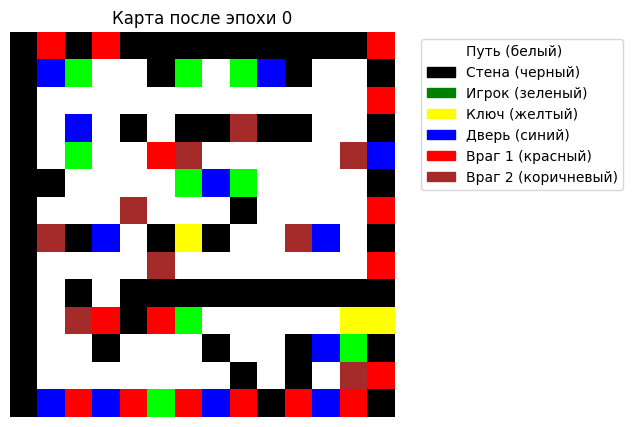

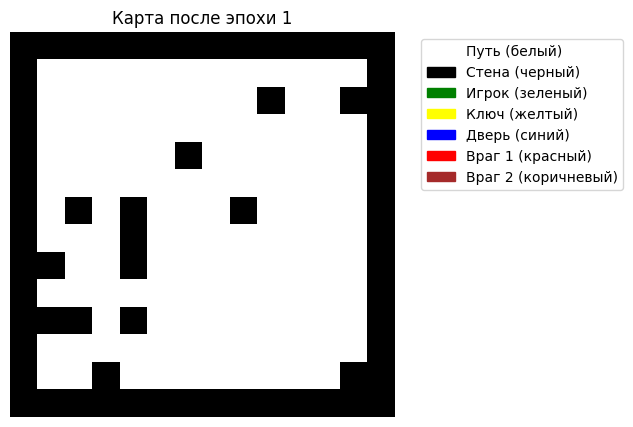

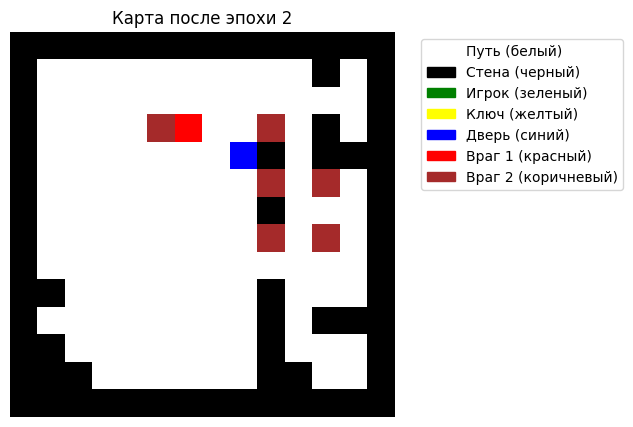

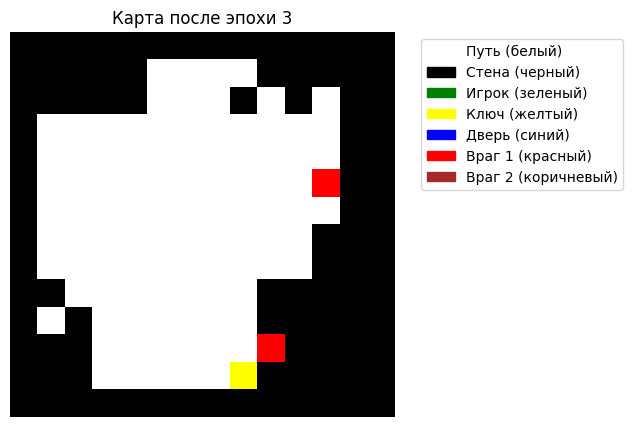

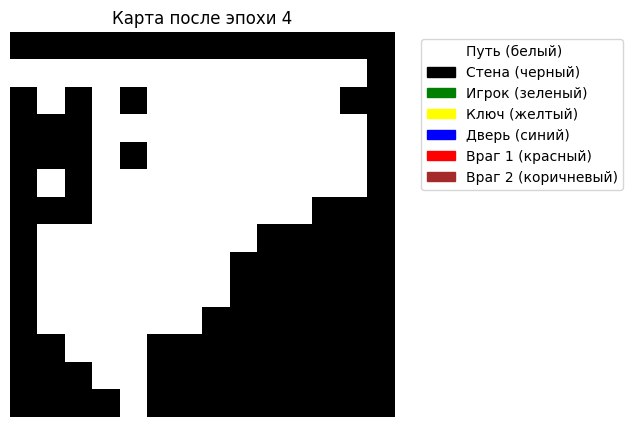

...

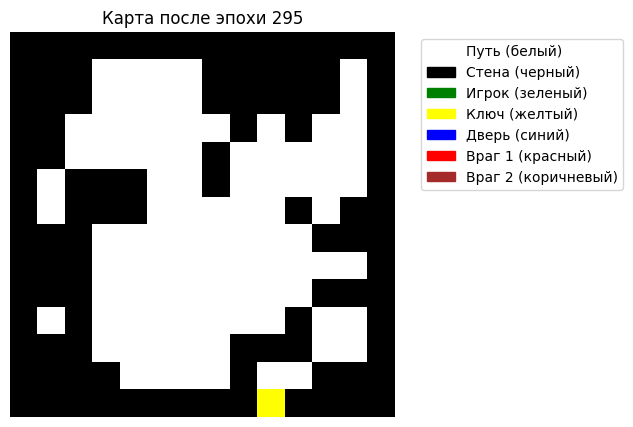

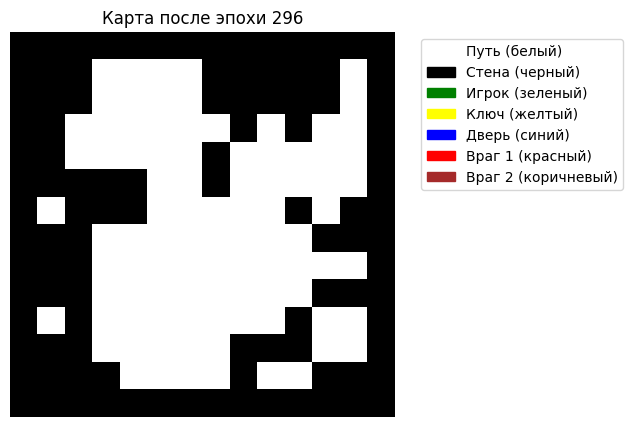

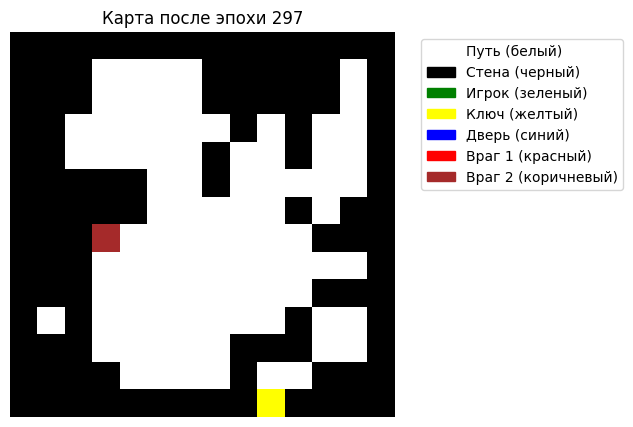

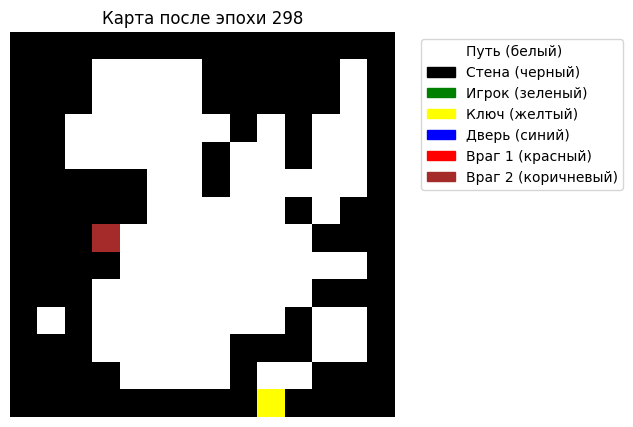

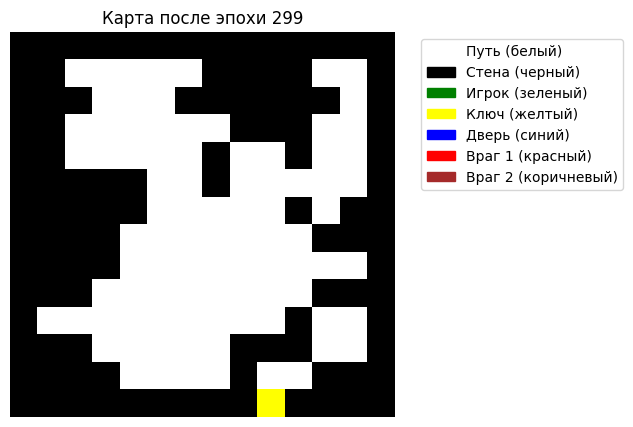

In [196]:
dataloader = get_dataloader(maps, objects, batch_size=32)
train_gan(generator, discriminator, dataloader, epochs=300)

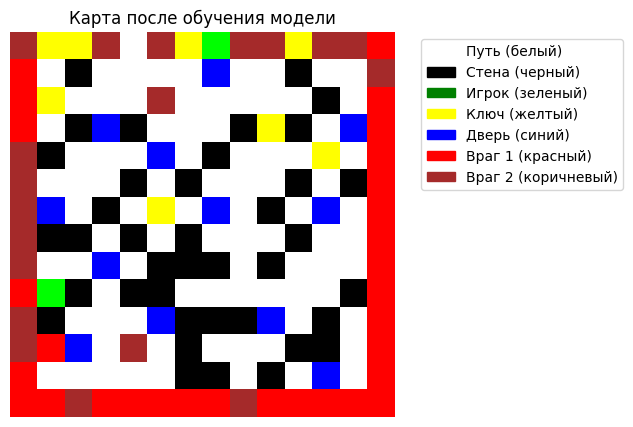

In [ ]:
z = torch.randn(1, 100)
u = torch.tensor([1, 1, 1, 2, 0]).type(torch.FloatTensor).unsqueeze(0)
map = torch.argmax(generator(z, u), dim=1)[0]
visualize_map(map, title="Карта после обучения модели")

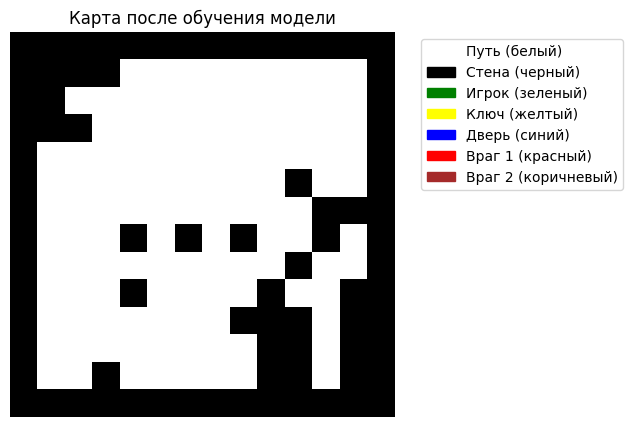

In [ ]:
z = torch.randn(1, 100)
u = torch.tensor([1, 1, 1, 2, 0]).type(torch.FloatTensor).unsqueeze(0)
map = torch.argmax(generator(z, u), dim=1)[0]
visualize_map(map, title="Карта после обучения модели")

In [ ]:
z = torch.randn(1, 100)
u = torch.tensor([1, 1, 1, 2, 0]).type(torch.FloatTensor).unsqueeze(0)
pred_classes = torch.randint(7, (16, 7, 14, 14))
batch_class_counts = torch.zeros(16, 7, device=pred_classes.device)
for b in range(16):
    batch_class_counts[b] = torch.bincount(pred_classes[b].view(-1), minlength=7)
batch_class_counts[:, 2:].shape
#F.mse_loss(class_counts[2:], u)
#class_penalty = (class_weights * (1 - class_distribution)).mean()

torch.Size([16, 5])

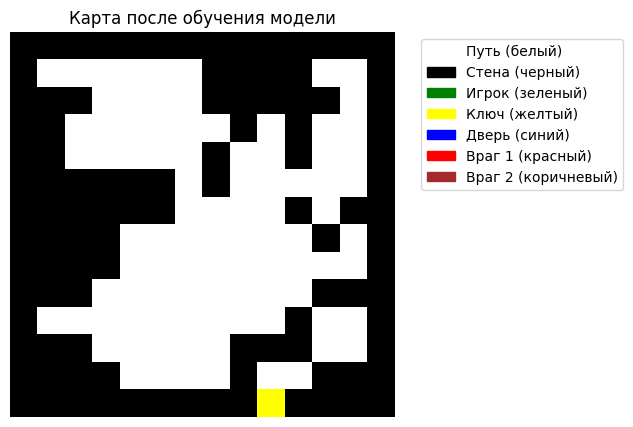

In [215]:
z = torch.randn(1, 100)
u = torch.tensor([0, 1, 2, 2, 1]).type(torch.FloatTensor).unsqueeze(0)
map = torch.argmax(generator(z, u), dim=1)[0]
visualize_map(map, title="Карта после обучения модели")

D_loss,▁
G_loss,▁
conditional_loss,▁
D_loss,0.49895
G_loss,1.86178
conditional_loss,205.075


  6%|▋         | 2/32 [00:00<00:05,  5.32it/s]

[Epoch 0/41] [Batch 0/32] D_loss: 1.3930 G_loss: 0.7034


 38%|███▊      | 12/32 [00:02<00:03,  5.72it/s]

[Epoch 0/41] [Batch 10/32] D_loss: 1.2526 G_loss: 0.7913


 69%|██████▉   | 22/32 [00:03<00:01,  5.86it/s]

[Epoch 0/41] [Batch 20/32] D_loss: 1.1750 G_loss: 0.8704


100%|██████████| 32/32 [00:05<00:00,  5.82it/s]


[Epoch 0/41] [Batch 30/32] D_loss: 1.1838 G_loss: 0.9239


  6%|▋         | 2/32 [00:00<00:05,  5.67it/s]

[Epoch 1/41] [Batch 0/32] D_loss: 1.1161 G_loss: 0.9393


 38%|███▊      | 12/32 [00:02<00:03,  5.62it/s]

[Epoch 1/41] [Batch 10/32] D_loss: 1.1746 G_loss: 1.2516


 66%|██████▌   | 21/32 [00:04<00:02,  4.02it/s]

[Epoch 1/41] [Batch 20/32] D_loss: 1.1138 G_loss: 1.4852


100%|██████████| 32/32 [00:06<00:00,  4.73it/s]


[Epoch 1/41] [Batch 30/32] D_loss: 1.1335 G_loss: 1.4223


  6%|▋         | 2/32 [00:00<00:05,  5.41it/s]

[Epoch 2/41] [Batch 0/32] D_loss: 1.0304 G_loss: 1.5249


 38%|███▊      | 12/32 [00:02<00:03,  5.75it/s]

[Epoch 2/41] [Batch 10/32] D_loss: 0.9242 G_loss: 1.6539


 69%|██████▉   | 22/32 [00:03<00:01,  5.63it/s]

[Epoch 2/41] [Batch 20/32] D_loss: 0.9477 G_loss: 1.9387


100%|██████████| 32/32 [00:05<00:00,  5.75it/s]


[Epoch 2/41] [Batch 30/32] D_loss: 0.7176 G_loss: 2.0704


  6%|▋         | 2/32 [00:00<00:05,  5.40it/s]

[Epoch 3/41] [Batch 0/32] D_loss: 0.7393 G_loss: 2.1118


 38%|███▊      | 12/32 [00:02<00:03,  5.60it/s]

[Epoch 3/41] [Batch 10/32] D_loss: 0.7133 G_loss: 2.6813


 69%|██████▉   | 22/32 [00:03<00:01,  5.60it/s]

[Epoch 3/41] [Batch 20/32] D_loss: 0.7500 G_loss: 2.1702


100%|██████████| 32/32 [00:06<00:00,  5.03it/s]

[Epoch 3/41] [Batch 30/32] D_loss: 0.6256 G_loss: 3.0725



  3%|▎         | 1/32 [00:00<00:08,  3.57it/s]

[Epoch 4/41] [Batch 0/32] D_loss: 0.5507 G_loss: 3.1294


 38%|███▊      | 12/32 [00:02<00:03,  5.54it/s]

[Epoch 4/41] [Batch 10/32] D_loss: 0.6735 G_loss: 2.4298


 69%|██████▉   | 22/32 [00:04<00:01,  5.69it/s]

[Epoch 4/41] [Batch 20/32] D_loss: 0.8304 G_loss: 3.3967


100%|██████████| 32/32 [00:06<00:00,  5.28it/s]


[Epoch 4/41] [Batch 30/32] D_loss: 0.4649 G_loss: 2.7050


  6%|▋         | 2/32 [00:00<00:05,  5.79it/s]

[Epoch 5/41] [Batch 0/32] D_loss: 0.5948 G_loss: 3.3836


 38%|███▊      | 12/32 [00:02<00:03,  5.67it/s]

[Epoch 5/41] [Batch 10/32] D_loss: 0.4764 G_loss: 2.4859


 69%|██████▉   | 22/32 [00:03<00:01,  5.63it/s]

[Epoch 5/41] [Batch 20/32] D_loss: 0.3704 G_loss: 3.0132


100%|██████████| 32/32 [00:05<00:00,  5.58it/s]

[Epoch 5/41] [Batch 30/32] D_loss: 0.4698 G_loss: 3.9772



  3%|▎         | 1/32 [00:00<00:08,  3.82it/s]

[Epoch 6/41] [Batch 0/32] D_loss: 0.5554 G_loss: 2.7902


 34%|███▍      | 11/32 [00:02<00:05,  3.68it/s]

[Epoch 6/41] [Batch 10/32] D_loss: 0.4155 G_loss: 2.7819


 69%|██████▉   | 22/32 [00:04<00:01,  5.52it/s]

[Epoch 6/41] [Batch 20/32] D_loss: 0.5132 G_loss: 3.0773


100%|██████████| 32/32 [00:06<00:00,  4.83it/s]


[Epoch 6/41] [Batch 30/32] D_loss: 0.7036 G_loss: 2.8287


  6%|▋         | 2/32 [00:00<00:05,  5.70it/s]

[Epoch 7/41] [Batch 0/32] D_loss: 0.7266 G_loss: 4.0236


 38%|███▊      | 12/32 [00:02<00:03,  5.58it/s]

[Epoch 7/41] [Batch 10/32] D_loss: 0.2935 G_loss: 3.0329


 69%|██████▉   | 22/32 [00:03<00:01,  5.60it/s]

[Epoch 7/41] [Batch 20/32] D_loss: 0.2660 G_loss: 4.1253


100%|██████████| 32/32 [00:05<00:00,  5.71it/s]


[Epoch 7/41] [Batch 30/32] D_loss: 0.6866 G_loss: 3.6424


  6%|▋         | 2/32 [00:00<00:05,  5.45it/s]

[Epoch 8/41] [Batch 0/32] D_loss: 0.5889 G_loss: 4.5244


 34%|███▍      | 11/32 [00:02<00:05,  3.85it/s]

[Epoch 8/41] [Batch 10/32] D_loss: 0.5155 G_loss: 3.9031


 69%|██████▉   | 22/32 [00:05<00:02,  4.97it/s]

[Epoch 8/41] [Batch 20/32] D_loss: 0.5454 G_loss: 4.1709


100%|██████████| 32/32 [00:06<00:00,  4.69it/s]


[Epoch 8/41] [Batch 30/32] D_loss: 0.7216 G_loss: 5.2484


  6%|▋         | 2/32 [00:00<00:05,  5.67it/s]

[Epoch 9/41] [Batch 0/32] D_loss: 0.4041 G_loss: 4.7107


 38%|███▊      | 12/32 [00:02<00:03,  5.64it/s]

[Epoch 9/41] [Batch 10/32] D_loss: 0.5375 G_loss: 4.0793


 69%|██████▉   | 22/32 [00:03<00:01,  5.43it/s]

[Epoch 9/41] [Batch 20/32] D_loss: 0.3575 G_loss: 4.1630


100%|██████████| 32/32 [00:05<00:00,  5.71it/s]


[Epoch 9/41] [Batch 30/32] D_loss: 0.4412 G_loss: 5.4012


  6%|▋         | 2/32 [00:00<00:05,  5.38it/s]

[Epoch 10/41] [Batch 0/32] D_loss: 0.4198 G_loss: 3.0791


 34%|███▍      | 11/32 [00:02<00:04,  4.95it/s]

[Epoch 10/41] [Batch 10/32] D_loss: 0.4538 G_loss: 4.8417


 66%|██████▌   | 21/32 [00:04<00:02,  3.83it/s]

[Epoch 10/41] [Batch 20/32] D_loss: 0.4328 G_loss: 3.6447


100%|██████████| 32/32 [00:06<00:00,  4.69it/s]


[Epoch 10/41] [Batch 30/32] D_loss: 0.3115 G_loss: 3.1993


  6%|▋         | 2/32 [00:00<00:05,  5.93it/s]

[Epoch 11/41] [Batch 0/32] D_loss: 0.5305 G_loss: 4.7279


 38%|███▊      | 12/32 [00:02<00:03,  5.67it/s]

[Epoch 11/41] [Batch 10/32] D_loss: 0.3604 G_loss: 3.5032


 69%|██████▉   | 22/32 [00:03<00:01,  5.64it/s]

[Epoch 11/41] [Batch 20/32] D_loss: 0.4904 G_loss: 3.3772


100%|██████████| 32/32 [00:05<00:00,  5.77it/s]


[Epoch 11/41] [Batch 30/32] D_loss: 0.3933 G_loss: 4.1966


  3%|▎         | 1/32 [00:00<00:05,  5.66it/s]

[Epoch 12/41] [Batch 0/32] D_loss: 0.7960 G_loss: 4.2941


 38%|███▊      | 12/32 [00:02<00:03,  5.75it/s]

[Epoch 12/41] [Batch 10/32] D_loss: 0.3671 G_loss: 4.0565


 66%|██████▌   | 21/32 [00:04<00:02,  4.13it/s]

[Epoch 12/41] [Batch 20/32] D_loss: 0.6396 G_loss: 5.2899


100%|██████████| 32/32 [00:06<00:00,  4.73it/s]

[Epoch 12/41] [Batch 30/32] D_loss: 0.6550 G_loss: 5.1308



  6%|▋         | 2/32 [00:00<00:05,  5.70it/s]

[Epoch 13/41] [Batch 0/32] D_loss: 0.3387 G_loss: 6.1850


 38%|███▊      | 12/32 [00:02<00:03,  5.50it/s]

[Epoch 13/41] [Batch 10/32] D_loss: 0.4837 G_loss: 4.6580


 69%|██████▉   | 22/32 [00:03<00:01,  5.75it/s]

[Epoch 13/41] [Batch 20/32] D_loss: 0.2628 G_loss: 5.1218


100%|██████████| 32/32 [00:05<00:00,  5.75it/s]


[Epoch 13/41] [Batch 30/32] D_loss: 0.2713 G_loss: 4.2089


  6%|▋         | 2/32 [00:00<00:05,  5.89it/s]

[Epoch 14/41] [Batch 0/32] D_loss: 0.7894 G_loss: 5.9622


 38%|███▊      | 12/32 [00:02<00:03,  5.68it/s]

[Epoch 14/41] [Batch 10/32] D_loss: 0.2688 G_loss: 4.3197


 69%|██████▉   | 22/32 [00:03<00:01,  5.55it/s]

[Epoch 14/41] [Batch 20/32] D_loss: 0.6864 G_loss: 5.1272


100%|██████████| 32/32 [00:06<00:00,  5.18it/s]

[Epoch 14/41] [Batch 30/32] D_loss: 0.5431 G_loss: 5.1315



  3%|▎         | 1/32 [00:00<00:07,  4.05it/s]

[Epoch 15/41] [Batch 0/32] D_loss: 0.4745 G_loss: 6.3996


 38%|███▊      | 12/32 [00:02<00:03,  5.21it/s]

[Epoch 15/41] [Batch 10/32] D_loss: 0.5375 G_loss: 5.6268


 69%|██████▉   | 22/32 [00:04<00:01,  5.65it/s]

[Epoch 15/41] [Batch 20/32] D_loss: 0.4244 G_loss: 4.9662


100%|██████████| 32/32 [00:06<00:00,  5.17it/s]


[Epoch 15/41] [Batch 30/32] D_loss: 0.2509 G_loss: 5.7516


  6%|▋         | 2/32 [00:00<00:05,  5.64it/s]

[Epoch 16/41] [Batch 0/32] D_loss: 0.3101 G_loss: 5.1344


 38%|███▊      | 12/32 [00:02<00:03,  5.54it/s]

[Epoch 16/41] [Batch 10/32] D_loss: 0.3045 G_loss: 6.6052


 69%|██████▉   | 22/32 [00:03<00:01,  5.63it/s]

[Epoch 16/41] [Batch 20/32] D_loss: 0.3725 G_loss: 6.8253


100%|██████████| 32/32 [00:05<00:00,  5.63it/s]

[Epoch 16/41] [Batch 30/32] D_loss: 0.2883 G_loss: 5.8676



  3%|▎         | 1/32 [00:00<00:08,  3.76it/s]

[Epoch 17/41] [Batch 0/32] D_loss: 0.2727 G_loss: 5.6775


 34%|███▍      | 11/32 [00:02<00:05,  3.68it/s]

[Epoch 17/41] [Batch 10/32] D_loss: 0.4054 G_loss: 6.6297


 69%|██████▉   | 22/32 [00:05<00:01,  5.58it/s]

[Epoch 17/41] [Batch 20/32] D_loss: 0.3559 G_loss: 5.3810


100%|██████████| 32/32 [00:06<00:00,  4.77it/s]


[Epoch 17/41] [Batch 30/32] D_loss: 0.6049 G_loss: 5.9503


  6%|▋         | 2/32 [00:00<00:05,  5.66it/s]

[Epoch 18/41] [Batch 0/32] D_loss: 0.3084 G_loss: 5.1179


 38%|███▊      | 12/32 [00:02<00:03,  5.51it/s]

[Epoch 18/41] [Batch 10/32] D_loss: 0.3141 G_loss: 6.2837


 69%|██████▉   | 22/32 [00:04<00:01,  5.54it/s]

[Epoch 18/41] [Batch 20/32] D_loss: 0.2806 G_loss: 6.1472


100%|██████████| 32/32 [00:05<00:00,  5.57it/s]

[Epoch 18/41] [Batch 30/32] D_loss: 0.4120 G_loss: 6.9656



  6%|▋         | 2/32 [00:00<00:05,  5.57it/s]

[Epoch 19/41] [Batch 0/32] D_loss: 0.2740 G_loss: 7.5308


 34%|███▍      | 11/32 [00:02<00:05,  3.86it/s]

[Epoch 19/41] [Batch 10/32] D_loss: 0.4721 G_loss: 5.7395


 69%|██████▉   | 22/32 [00:05<00:02,  4.92it/s]

[Epoch 19/41] [Batch 20/32] D_loss: 0.2980 G_loss: 5.8741


100%|██████████| 32/32 [00:06<00:00,  4.67it/s]


[Epoch 19/41] [Batch 30/32] D_loss: 0.3450 G_loss: 6.0323


  6%|▋         | 2/32 [00:00<00:05,  5.58it/s]

[Epoch 20/41] [Batch 0/32] D_loss: 0.2037 G_loss: 7.0312


 38%|███▊      | 12/32 [00:02<00:03,  5.47it/s]

[Epoch 20/41] [Batch 10/32] D_loss: 0.5242 G_loss: 7.1932


 69%|██████▉   | 22/32 [00:03<00:01,  5.61it/s]

[Epoch 20/41] [Batch 20/32] D_loss: 0.3939 G_loss: 8.7659


100%|██████████| 32/32 [00:05<00:00,  5.69it/s]
<ipython-input-174-ae9b14d0bdda>:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5, 5))


[Epoch 20/41] [Batch 30/32] D_loss: 0.3737 G_loss: 7.0930


  6%|▋         | 2/32 [00:00<00:05,  5.86it/s]

[Epoch 21/41] [Batch 0/32] D_loss: 0.3039 G_loss: 7.7166


 34%|███▍      | 11/32 [00:01<00:03,  5.30it/s]

[Epoch 21/41] [Batch 10/32] D_loss: 0.2439 G_loss: 7.4056


 66%|██████▌   | 21/32 [00:04<00:02,  3.88it/s]

[Epoch 21/41] [Batch 20/32] D_loss: 0.3572 G_loss: 5.7351


100%|██████████| 32/32 [00:06<00:00,  4.69it/s]


[Epoch 21/41] [Batch 30/32] D_loss: 0.3402 G_loss: 8.8280


  6%|▋         | 2/32 [00:00<00:05,  5.84it/s]

[Epoch 22/41] [Batch 0/32] D_loss: 0.1956 G_loss: 7.7381


 38%|███▊      | 12/32 [00:02<00:03,  5.75it/s]

[Epoch 22/41] [Batch 10/32] D_loss: 0.2062 G_loss: 7.7539


 69%|██████▉   | 22/32 [00:03<00:01,  5.62it/s]

[Epoch 22/41] [Batch 20/32] D_loss: 0.3093 G_loss: 7.2453


100%|██████████| 32/32 [00:05<00:00,  5.73it/s]


[Epoch 22/41] [Batch 30/32] D_loss: 0.3852 G_loss: 7.1660


  6%|▋         | 2/32 [00:00<00:05,  5.79it/s]

[Epoch 23/41] [Batch 0/32] D_loss: 0.2625 G_loss: 9.2493


 38%|███▊      | 12/32 [00:02<00:03,  5.57it/s]

[Epoch 23/41] [Batch 10/32] D_loss: 0.2279 G_loss: 8.7428


 66%|██████▌   | 21/32 [00:04<00:02,  4.22it/s]

[Epoch 23/41] [Batch 20/32] D_loss: 0.3189 G_loss: 9.1228


100%|██████████| 32/32 [00:06<00:00,  4.74it/s]

[Epoch 23/41] [Batch 30/32] D_loss: 0.2238 G_loss: 6.9942



  6%|▋         | 2/32 [00:00<00:05,  5.51it/s]

[Epoch 24/41] [Batch 0/32] D_loss: 0.2285 G_loss: 7.4991


 38%|███▊      | 12/32 [00:02<00:03,  5.62it/s]

[Epoch 24/41] [Batch 10/32] D_loss: 0.2039 G_loss: 7.4862


 69%|██████▉   | 22/32 [00:03<00:01,  5.63it/s]

[Epoch 24/41] [Batch 20/32] D_loss: 0.2816 G_loss: 10.6144


100%|██████████| 32/32 [00:05<00:00,  5.71it/s]


[Epoch 24/41] [Batch 30/32] D_loss: 0.1489 G_loss: 8.4640


  6%|▋         | 2/32 [00:00<00:05,  5.63it/s]

[Epoch 25/41] [Batch 0/32] D_loss: 0.1968 G_loss: 8.8431


 38%|███▊      | 12/32 [00:02<00:03,  5.64it/s]

[Epoch 25/41] [Batch 10/32] D_loss: 0.4299 G_loss: 7.6545


 69%|██████▉   | 22/32 [00:03<00:01,  5.76it/s]

[Epoch 25/41] [Batch 20/32] D_loss: 0.5150 G_loss: 8.1993


100%|██████████| 32/32 [00:06<00:00,  5.28it/s]

[Epoch 25/41] [Batch 30/32] D_loss: 0.1532 G_loss: 7.6962



  3%|▎         | 1/32 [00:00<00:07,  3.99it/s]

[Epoch 26/41] [Batch 0/32] D_loss: 0.2304 G_loss: 8.5352


 38%|███▊      | 12/32 [00:02<00:03,  5.25it/s]

[Epoch 26/41] [Batch 10/32] D_loss: 0.4998 G_loss: 8.8743


 69%|██████▉   | 22/32 [00:04<00:01,  5.12it/s]

[Epoch 26/41] [Batch 20/32] D_loss: 0.2222 G_loss: 8.3674


100%|██████████| 32/32 [00:06<00:00,  4.99it/s]


[Epoch 26/41] [Batch 30/32] D_loss: 0.2283 G_loss: 8.5267


  6%|▋         | 2/32 [00:00<00:05,  5.95it/s]

[Epoch 27/41] [Batch 0/32] D_loss: 0.3431 G_loss: 8.4522


 38%|███▊      | 12/32 [00:02<00:03,  5.62it/s]

[Epoch 27/41] [Batch 10/32] D_loss: 0.2345 G_loss: 9.6236


 69%|██████▉   | 22/32 [00:03<00:01,  5.53it/s]

[Epoch 27/41] [Batch 20/32] D_loss: 0.2384 G_loss: 8.1539


100%|██████████| 32/32 [00:05<00:00,  5.61it/s]

[Epoch 27/41] [Batch 30/32] D_loss: 0.1276 G_loss: 8.0246



  3%|▎         | 1/32 [00:00<00:08,  3.70it/s]

[Epoch 28/41] [Batch 0/32] D_loss: 0.1546 G_loss: 7.4010


 34%|███▍      | 11/32 [00:02<00:05,  3.73it/s]

[Epoch 28/41] [Batch 10/32] D_loss: 0.2358 G_loss: 8.1760


 69%|██████▉   | 22/32 [00:04<00:01,  5.60it/s]

[Epoch 28/41] [Batch 20/32] D_loss: 0.3056 G_loss: 10.5456


100%|██████████| 32/32 [00:06<00:00,  4.82it/s]


[Epoch 28/41] [Batch 30/32] D_loss: 0.2594 G_loss: 9.2516


  6%|▋         | 2/32 [00:00<00:05,  5.74it/s]

[Epoch 29/41] [Batch 0/32] D_loss: 0.3004 G_loss: 13.4679


 38%|███▊      | 12/32 [00:02<00:03,  5.57it/s]

[Epoch 29/41] [Batch 10/32] D_loss: 0.0874 G_loss: 10.7442


 69%|██████▉   | 22/32 [00:03<00:01,  5.59it/s]

[Epoch 29/41] [Batch 20/32] D_loss: 0.3479 G_loss: 10.4632


100%|██████████| 32/32 [00:05<00:00,  5.75it/s]


[Epoch 29/41] [Batch 30/32] D_loss: 0.2412 G_loss: 10.1538


  6%|▋         | 2/32 [00:00<00:05,  5.44it/s]

[Epoch 30/41] [Batch 0/32] D_loss: 0.2182 G_loss: 9.3405


 34%|███▍      | 11/32 [00:02<00:05,  3.91it/s]

[Epoch 30/41] [Batch 10/32] D_loss: 0.2747 G_loss: 9.6765


 69%|██████▉   | 22/32 [00:05<00:02,  4.74it/s]

[Epoch 30/41] [Batch 20/32] D_loss: 0.3162 G_loss: 9.7430


100%|██████████| 32/32 [00:06<00:00,  4.68it/s]


[Epoch 30/41] [Batch 30/32] D_loss: 0.1443 G_loss: 13.8734


  6%|▋         | 2/32 [00:00<00:05,  5.68it/s]

[Epoch 31/41] [Batch 0/32] D_loss: 0.1205 G_loss: 10.4659


 38%|███▊      | 12/32 [00:02<00:03,  5.65it/s]

[Epoch 31/41] [Batch 10/32] D_loss: 0.1977 G_loss: 12.0189


 69%|██████▉   | 22/32 [00:03<00:01,  5.62it/s]

[Epoch 31/41] [Batch 20/32] D_loss: 0.1887 G_loss: 10.8609


100%|██████████| 32/32 [00:05<00:00,  5.73it/s]


[Epoch 31/41] [Batch 30/32] D_loss: 0.0933 G_loss: 12.1864


  6%|▋         | 2/32 [00:00<00:05,  5.44it/s]

[Epoch 32/41] [Batch 0/32] D_loss: 0.2643 G_loss: 14.4456


 34%|███▍      | 11/32 [00:01<00:03,  5.54it/s]

[Epoch 32/41] [Batch 10/32] D_loss: 0.3129 G_loss: 13.4550


 66%|██████▌   | 21/32 [00:04<00:02,  3.91it/s]

[Epoch 32/41] [Batch 20/32] D_loss: 0.2405 G_loss: 10.2538


100%|██████████| 32/32 [00:06<00:00,  4.65it/s]


[Epoch 32/41] [Batch 30/32] D_loss: 0.2029 G_loss: 13.5629


  6%|▋         | 2/32 [00:00<00:05,  5.60it/s]

[Epoch 33/41] [Batch 0/32] D_loss: 0.2441 G_loss: 12.1736


 38%|███▊      | 12/32 [00:02<00:03,  5.53it/s]

[Epoch 33/41] [Batch 10/32] D_loss: 0.2564 G_loss: 13.2197


 69%|██████▉   | 22/32 [00:04<00:01,  5.36it/s]

[Epoch 33/41] [Batch 20/32] D_loss: 0.1901 G_loss: 10.6695


100%|██████████| 32/32 [00:05<00:00,  5.59it/s]


[Epoch 33/41] [Batch 30/32] D_loss: 0.2921 G_loss: 13.9059


  6%|▋         | 2/32 [00:00<00:05,  5.44it/s]

[Epoch 34/41] [Batch 0/32] D_loss: 0.4154 G_loss: 12.0961


 38%|███▊      | 12/32 [00:02<00:03,  5.49it/s]

[Epoch 34/41] [Batch 10/32] D_loss: 0.2065 G_loss: 12.9140


 66%|██████▌   | 21/32 [00:04<00:02,  4.16it/s]

[Epoch 34/41] [Batch 20/32] D_loss: 0.2836 G_loss: 11.7565


100%|██████████| 32/32 [00:06<00:00,  4.66it/s]

[Epoch 34/41] [Batch 30/32] D_loss: 0.1171 G_loss: 13.0748



  6%|▋         | 2/32 [00:00<00:05,  5.69it/s]

[Epoch 35/41] [Batch 0/32] D_loss: 0.1701 G_loss: 9.5948


 38%|███▊      | 12/32 [00:02<00:03,  5.58it/s]

[Epoch 35/41] [Batch 10/32] D_loss: 0.2951 G_loss: 12.7639


 69%|██████▉   | 22/32 [00:03<00:01,  5.59it/s]

[Epoch 35/41] [Batch 20/32] D_loss: 0.1279 G_loss: 10.9152


100%|██████████| 32/32 [00:05<00:00,  5.73it/s]


[Epoch 35/41] [Batch 30/32] D_loss: 0.4116 G_loss: 13.3842


  6%|▋         | 2/32 [00:00<00:05,  5.44it/s]

[Epoch 36/41] [Batch 0/32] D_loss: 0.1356 G_loss: 11.1630


 38%|███▊      | 12/32 [00:02<00:03,  5.74it/s]

[Epoch 36/41] [Batch 10/32] D_loss: 0.2785 G_loss: 11.7906


 69%|██████▉   | 22/32 [00:03<00:01,  5.76it/s]

[Epoch 36/41] [Batch 20/32] D_loss: 0.2370 G_loss: 14.0162


100%|██████████| 32/32 [00:06<00:00,  5.20it/s]

[Epoch 36/41] [Batch 30/32] D_loss: 0.0715 G_loss: 13.0964



  3%|▎         | 1/32 [00:00<00:08,  3.83it/s]

[Epoch 37/41] [Batch 0/32] D_loss: 0.1880 G_loss: 11.2205


 38%|███▊      | 12/32 [00:02<00:03,  5.19it/s]

[Epoch 37/41] [Batch 10/32] D_loss: 0.4931 G_loss: 15.1934


 69%|██████▉   | 22/32 [00:04<00:01,  5.53it/s]

[Epoch 37/41] [Batch 20/32] D_loss: 0.2650 G_loss: 14.9924


100%|██████████| 32/32 [00:06<00:00,  5.11it/s]


[Epoch 37/41] [Batch 30/32] D_loss: 0.0698 G_loss: 14.8267


  6%|▋         | 2/32 [00:00<00:05,  5.50it/s]

[Epoch 38/41] [Batch 0/32] D_loss: 0.2313 G_loss: 15.3240


 38%|███▊      | 12/32 [00:02<00:03,  5.34it/s]

[Epoch 38/41] [Batch 10/32] D_loss: 0.3454 G_loss: 14.7827


 69%|██████▉   | 22/32 [00:04<00:01,  5.52it/s]

[Epoch 38/41] [Batch 20/32] D_loss: 0.1008 G_loss: 11.7104


100%|██████████| 32/32 [00:05<00:00,  5.51it/s]

[Epoch 38/41] [Batch 30/32] D_loss: 0.2168 G_loss: 15.7328



  3%|▎         | 1/32 [00:00<00:07,  3.92it/s]

[Epoch 39/41] [Batch 0/32] D_loss: 0.1123 G_loss: 14.7926


 34%|███▍      | 11/32 [00:02<00:05,  3.75it/s]

[Epoch 39/41] [Batch 10/32] D_loss: 0.1519 G_loss: 13.6756


 69%|██████▉   | 22/32 [00:05<00:02,  4.57it/s]

[Epoch 39/41] [Batch 20/32] D_loss: 0.2036 G_loss: 15.4277


100%|██████████| 32/32 [00:06<00:00,  4.59it/s]


[Epoch 39/41] [Batch 30/32] D_loss: 0.0867 G_loss: 14.2641


  6%|▋         | 2/32 [00:00<00:05,  5.66it/s]

[Epoch 40/41] [Batch 0/32] D_loss: 0.1815 G_loss: 12.3609


 38%|███▊      | 12/32 [00:02<00:03,  5.65it/s]

[Epoch 40/41] [Batch 10/32] D_loss: 0.2515 G_loss: 15.3102


 69%|██████▉   | 22/32 [00:03<00:01,  5.52it/s]

[Epoch 40/41] [Batch 20/32] D_loss: 0.2018 G_loss: 17.0045


100%|██████████| 32/32 [00:05<00:00,  5.71it/s]

[Epoch 40/41] [Batch 30/32] D_loss: 0.1681 G_loss: 17.3808


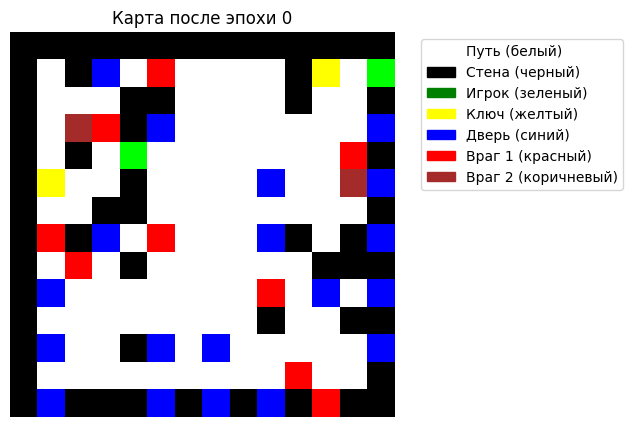

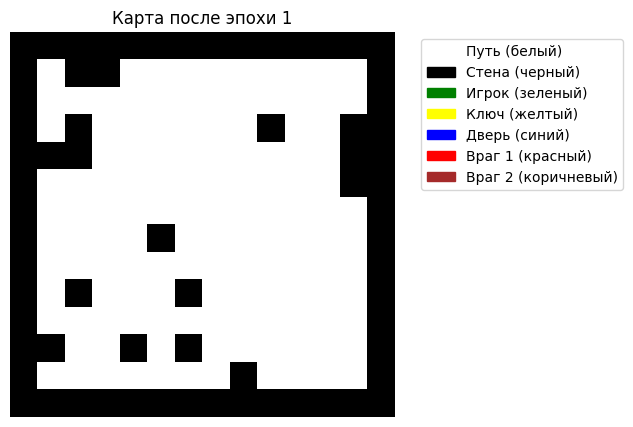

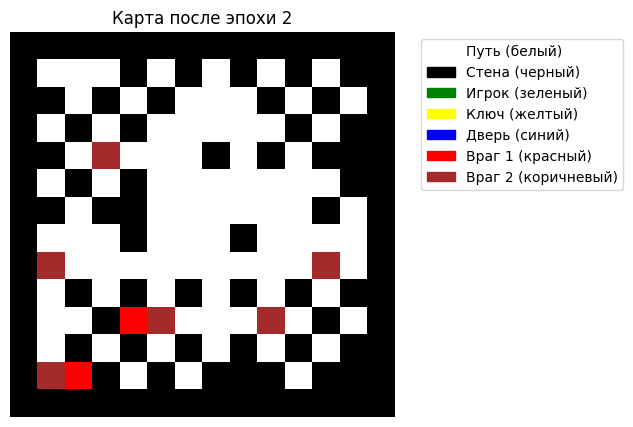

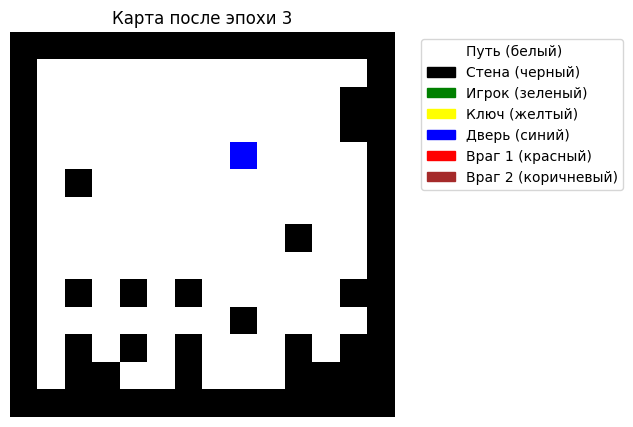

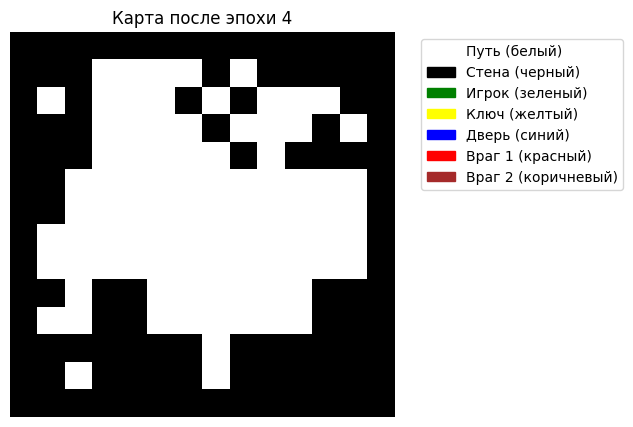

...

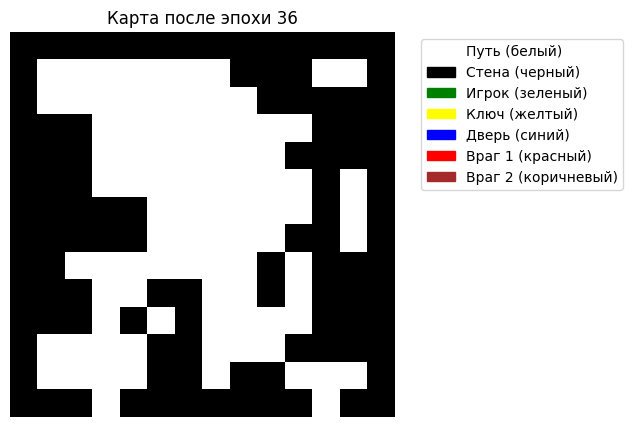

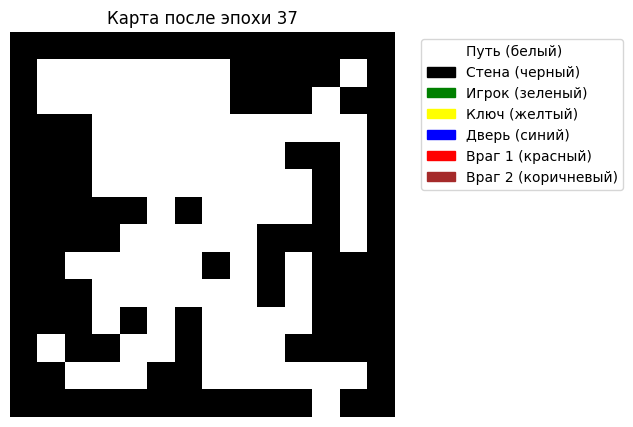

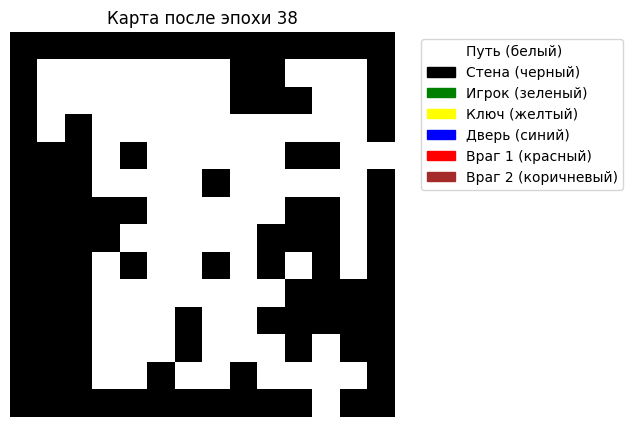

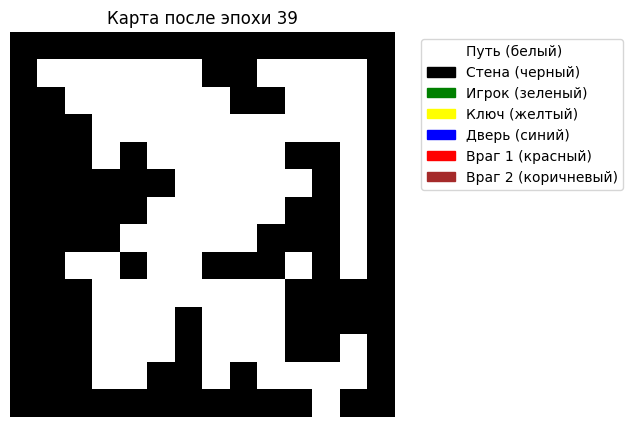

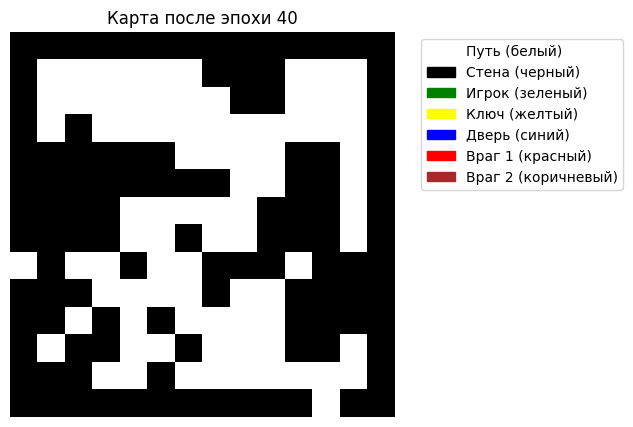

In [219]:
dataloader = get_dataloader(maps, objects, batch_size=32)
train_gan(generator, discriminator, dataloader, epochs=41)

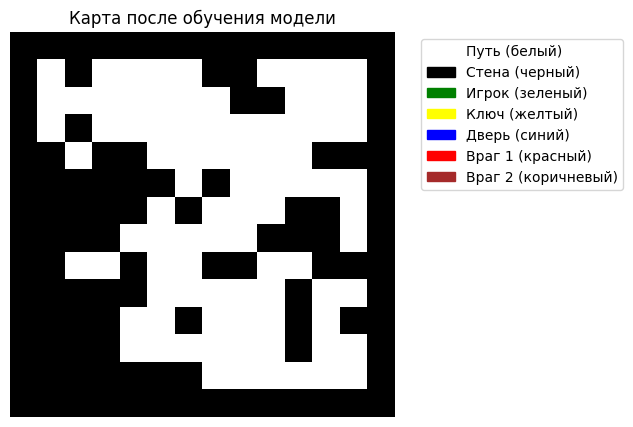

In [242]:
z = torch.randn(1, 100)
u = torch.tensor([0, 1, 2, 2, 1]).type(torch.FloatTensor).unsqueeze(0)
map = torch.argmax(generator(z, u), dim=1)[0]
visualize_map(map, title="Карта после обучения модели")

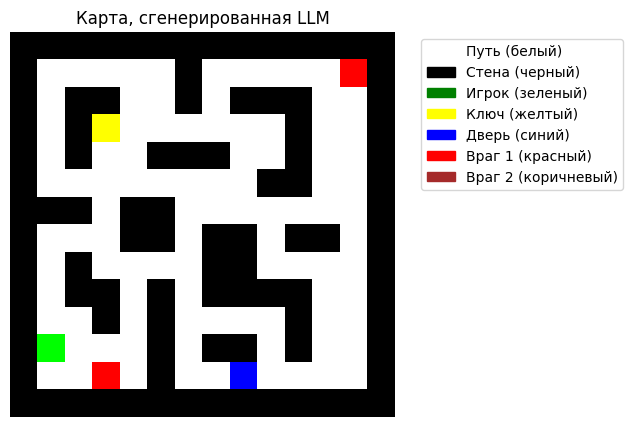

In [223]:
map = np.array([
 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 [1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 5, 1],
 [1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1],
 [1, 0, 1, 3, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1],
 [1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1],
 [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
 [1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1],
 [1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1],
 [1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
 [1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1],
 [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1],
 [1, 2, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1],
 [1, 0, 0, 5, 0, 1, 0, 0, 4, 0, 0, 0, 0, 1],
 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
])
visualize_map(map, title="Карта, сгенерированная LLM")